# CANDELS workshop | UC Riverside | April 10-13, 2018

## The Art of Measuring Physical Parameters in Galaxies

### This notebook is designed to collect outputs from ~ 16 different SED Fitting codes and compare their Stellar Masses, Star Formation Rates, and other quantities. 

This is a work in progress, and any ideas about new analysis I can try, or mistakes I may have inadvertently made in the course of importing and analysing the data will be gratefully acknowledged and incorporated / fixed. You can contact me with questions / comments at iyer@physics.rutgers.edu


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings

import scipy.io as sio

from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)
cosmo.age(1)

import seaborn as sns
import pandas as pd
from astropy.io import fits

sns.set(font_scale=2)
sns.set_style("whitegrid")

from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import axes3d

import statsmodels.api as sm
lowess = sm.nonparametric.lowess

## Changelog:

(if you are making changes to the shared version of this notebook, please update the changelog with your handle and a brief description of the changes.)

- 04/13/2018 - finished rough first version of notebook, uploaded to SEDfitting dropbox folder. [`kiyer`]
- 04/20/2018 - added SpeedyMC SFRs calculated using LinExp SFHs. [`kiyer`]
- 04/20/2018 - fixed small issue with nan values in the 3dplots. [`kiyer`]
- 05/30/2018 - added code to save all the comparison figures generated in running this. [`kiyer`]
- 06/11/2018 - changed directory structure for clarity, added GitHub repo. [`kiyer`]
- 06/22/2018 - added Dust uncertainties from Dense Basis code [`kiyer`]
- 06/22/2018 - added z~3 catalog that Cami uploaded to the trello board. [`kiyer`]
- 06/23/2018 - included SEDfitting outputs for z~3 catalog from Pacifici+16, Dense Basis, Salmon+15, Nima's fits, Marianna's fits, MAGPHYS (renamed file to MAGPHYS_output_z3.fits), BAGPIPES (slight formatting change in outputs) [`kiyer`]
- 06/24/2018 - Added SED3FIT outputs. (need to check units of SFR with Kevin). Added INTERROGATOR z~1 and z~3 outputs. [`kiyer`]
- 06/26/2018 - Add SpeedyMC SFR estimates with uncertainties, and z~3 sample. [`kiyer`]
- 07/02/2018 - Changed SED3FIT outputs to SFR instead of log SFR. Added MAGPHYS z~1 and z~3 AGN samples. Fixed interrogator importing so that galaxy IDs are the same as the sample + other codes. Missing galaxies are still marked with nan values. [`kiyer`]
- 07/03/2018 - overhauled z~1 plots, added dust comparison as well. [`kiyer`]
- 07/07/2018 - added variability plots as a function of SNR in different bands as well as total SNR. Need to converge on a set of plots in this regard. [`kiyer`]
- 07/07/2018 - added Joels z~3 prospector fits, and z~3 CIGALE fits (there isn't a corresponding set with AGN for z~3, so I've removed that column from the z~3 figures. [`kiyer`]
- 07/08/2018 - overhauled most of the plots, now have plots for: z1 [mass, SFR, Av comparison, mass uncertainty comparison and sfr uncertainty comparison], z1[inter-code variability in mass, SFR and SSFR, as a function of those quantities, and SNR in a few bands), z3[mass, SFR, Av comparisons]
- 07/18/2018 - added Brett's new fits to the code comparison [`kiyer`]
- 07/24/2018 - added Alba's Beagle z=1 and z=3 fits to the code comparison [`kiyer`]

Current To-Do: 

- ask about SED3FIT and CIGALE dust estimates at z~1 and z~3. 
- start importing z~1 IR sample fits - so far I have outputs from SED3FIT (Kevin), MAGPHYS (Yu-yen) and Prospector (Joel). Are there any others that I'm missing?
- check if all the SFR outputs I'm using are averaged over the last 100 Myr - if not, restrict to the subsample that are

# Step 1: import catalogs and galaxy IDs

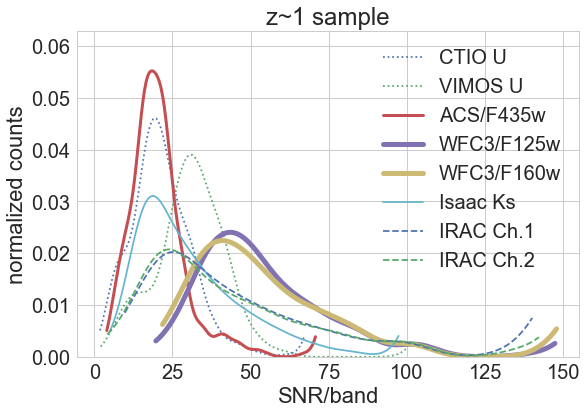

In [2]:
# ID     zz	  (0,1)
#CTIO_U   eCTIO_U  (2,3)  
#VIMOS_U   eVIMOS_U (4,5)  
#ACS_F435W   eACS_F435W (6,7) 
#ACS_F606W   eACS_F606W (8,9)
#ACS_F775W	eACS_F775W   
#ACS_F814W   eACS_F814W   
#ACS_F850LP   eACS_F850LP   
#WFC3_F098M   eWFC3_F098M   
#WFC3_F105W   eWFC3_F105W   
#WFC3_F125W   eWFC3_F125W   (20,21)
#WFC3_F160W   eWFC3_F160W   (22,23)
#ISAAC_KS	eISAAC_KS   (24,25)
#HAWKI_KS   eHAWKI_KS   
#IRAC_CH1   eIRAC_CH1   (28,29)
#IRAC_CH2   eIRAC_CH2   (30,31)
#IRAC_CH3   eIRAC_CH3	(32,33)
#IRAC_CH4   eIRAC_CH4   (34,35)
#flg1   flg2  (36,37)

candels_cat_small = np.loadtxt('catalogs/CANDELS_GDSS_workshop.dat')

# subtracting 1 from the ID for python indexing
cat_small_ids = candels_cat_small[0:,0] - 1
cat_small_z = candels_cat_small[0:,1]

print(str(cat_small_z.shape[0])+' galaxies in the small catalog.')

candels_cat_z1 = np.loadtxt('catalogs/CANDELS_GDSS_workshop_z1.dat')

# subtracting 1 from the ID for python indexing
cat_z1_ids = candels_cat_z1[0:,0] - 1
cat_z1_z = candels_cat_z1[0:,1]
cat_z1_ctioU_SNR = np.sqrt(candels_cat_z1[0:,2]/candels_cat_z1[0:,3])
cat_z1_vimosU_SNR = np.sqrt(candels_cat_z1[0:,4]/candels_cat_z1[0:,5])
cat_z1_f435_SNR = np.sqrt(candels_cat_z1[0:,6]/candels_cat_z1[0:,7])
cat_z1_f125_SNR = np.sqrt(candels_cat_z1[0:,20]/candels_cat_z1[0:,21])
cat_z1_f160_SNR = np.sqrt(candels_cat_z1[0:,22]/candels_cat_z1[0:,23])
cat_z1_isaacKs_SNR = np.sqrt(candels_cat_z1[0:,24]/candels_cat_z1[0:,25])
cat_z1_irac1_SNR = np.sqrt(candels_cat_z1[0:,28]/candels_cat_z1[0:,29])
cat_z1_irac2_SNR = np.sqrt(candels_cat_z1[0:,30]/candels_cat_z1[0:,31])

print(str(cat_z1_z.shape[0])+' galaxies in the z~1 catalog.')

candels_cat_z3 = np.loadtxt('catalogs/CANDELS_GDSS_workshop_z3.dat')

# subtracting 1 from the ID for python indexing
cat_z3_ids = candels_cat_z3[0:,0] - 1
cat_z3_z = candels_cat_z3[0:,1]

print(str(cat_z3_z.shape[0])+' galaxies in the z~3 catalog.')


plt.figure(figsize=(9,6))
xax = cat_z1_ctioU_SNR; sns.kdeplot(xax[xax>0],cut=0,label='CTIO U',linestyle=":")
xax = cat_z1_vimosU_SNR; sns.kdeplot(xax[xax>0],cut=0,label='VIMOS U',linestyle=":")
xax = cat_z1_f435_SNR;  sns.kdeplot(xax[xax>0],cut=0,label='ACS/F435w',lw=3)
xax = cat_z1_f125_SNR; sns.kdeplot((xax[xax>0]),cut=0,label='WFC3/F125w',lw=5)
xax = cat_z1_f160_SNR; sns.kdeplot((xax[xax>0]),cut=0,label='WFC3/F160w',lw=5)
xax = cat_z1_isaacKs_SNR; sns.kdeplot((xax[xax>0]),cut=0,label='Isaac Ks')
xax = cat_z1_irac1_SNR; sns.kdeplot((xax[xax>0]),cut=0,label='IRAC Ch.1',linestyle="--")
xax = cat_z1_irac2_SNR; sns.kdeplot((xax[xax>0]),cut=0,label='IRAC Ch.2',linestyle="--")
plt.legend(edgecolor='w')
plt.xlabel('SNR/band')
plt.ylim(0,0.063)
plt.ylabel('normalized counts')
plt.title('z~1 sample')
plt.savefig('figures/z1_sample_SNR_distributions.png',bbox_inches='tight')
plt.show()

# Step 2: import outputs of all the SED fitting codes.

### Pacifici+16 fits

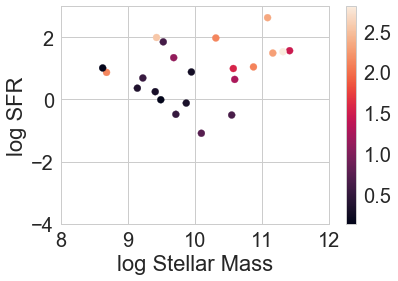

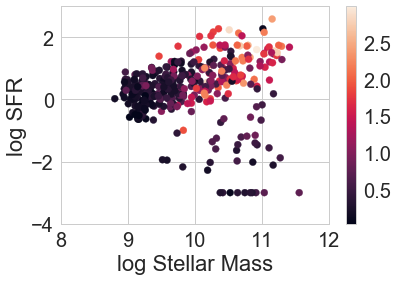

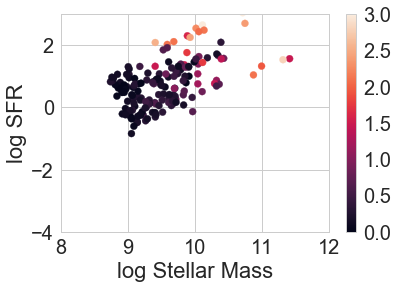

In [3]:
# This is a full CANDELS/GOODS-S catalog

cami_catalog = np.genfromtxt('code_outputs/Cami_GOODS-S_zbest.dat')
print(cami_catalog.shape)

# Galaxy IDs
cami_id_full = cami_catalog[0:,0]

# Stellar Mass
cami_mass_full = cami_catalog[0:,1]
cami_mass_lo_full = cami_catalog[0:,14]
cami_mass_hi_full = cami_catalog[0:,27]

# Star Formation Rate
cami_sfr_full = cami_catalog[0:,3]
cami_sfr_lo_full = cami_catalog[0:,16]
cami_sfr_hi_full = cami_catalog[0:,29]

# Dust estimate
cami_AV_full = cami_catalog[0:,11]
cami_AV_lo_full = cami_catalog[0:,24]
cami_AV_hi_full = cami_catalog[0:,37]

#-------------------partition into small and z1 catalogs-----------------

cami_mass_small = cami_mass_full[cat_small_ids.astype(int)]
cami_mass_lo_small = cami_mass_lo_full[cat_small_ids.astype(int)]
cami_mass_hi_small = cami_mass_hi_full[cat_small_ids.astype(int)]

cami_sfr_small = cami_sfr_full[cat_small_ids.astype(int)]
cami_sfr_lo_small = cami_sfr_lo_full[cat_small_ids.astype(int)]
cami_sfr_hi_small = cami_sfr_hi_full[cat_small_ids.astype(int)]

cami_Av_small = cami_AV_full[cat_small_ids.astype(int)]
cami_Av_lo_small = cami_AV_lo_full[cat_small_ids.astype(int)]
cami_Av_hi_small = cami_AV_hi_full[cat_small_ids.astype(int)]

#-------------------------------------------------------------

cami_mass_z1 = cami_mass_full[cat_z1_ids.astype(int)]
cami_mass_lo_z1 = cami_mass_lo_full[cat_z1_ids.astype(int)]
cami_mass_hi_z1 = cami_mass_hi_full[cat_z1_ids.astype(int)]

cami_sfr_z1 = cami_sfr_full[cat_z1_ids.astype(int)]
cami_sfr_lo_z1 = cami_sfr_lo_full[cat_z1_ids.astype(int)]
cami_sfr_hi_z1 = cami_sfr_hi_full[cat_z1_ids.astype(int)]

cami_Av_z1 = cami_AV_full[cat_z1_ids.astype(int)]
cami_Av_lo_z1 = cami_AV_lo_full[cat_z1_ids.astype(int)]
cami_Av_hi_z1 = cami_AV_hi_full[cat_z1_ids.astype(int)]

#-------------------------------------------------------------

cami_mass_z3 = cami_mass_full[cat_z3_ids.astype(int)]
cami_mass_lo_z3 = cami_mass_lo_full[cat_z3_ids.astype(int)]
cami_mass_hi_z3 = cami_mass_hi_full[cat_z3_ids.astype(int)]

cami_sfr_z3 = cami_sfr_full[cat_z3_ids.astype(int)]
cami_sfr_lo_z3 = cami_sfr_lo_full[cat_z3_ids.astype(int)]
cami_sfr_hi_z3 = cami_sfr_hi_full[cat_z3_ids.astype(int)]

cami_Av_z3 = cami_AV_full[cat_z3_ids.astype(int)]
cami_Av_lo_z3 = cami_AV_lo_full[cat_z3_ids.astype(int)]
cami_Av_hi_z3 = cami_AV_hi_full[cat_z3_ids.astype(int)]

#---------------plot SFR-M* diagrams as a consistency check

plt.scatter(cami_mass_small,cami_sfr_small,c = cami_Av_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(cami_mass_z1,cami_sfr_z1,c = cami_Av_z1)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(cami_mass_z3,cami_sfr_z3,c = cami_Av_z3)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

### Dense Basis Fits

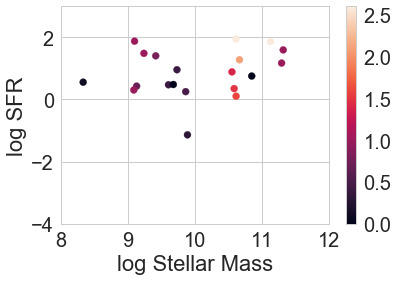

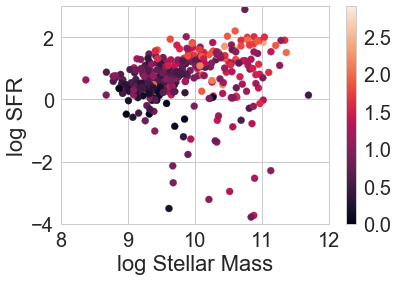

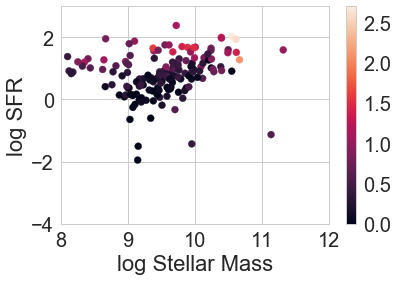

In [4]:
# This is a full CANDELS/GOODS-S catalog

DB_cat = np.genfromtxt('code_outputs/Dense_Basis_GOODS-S_v1.2.dat',delimiter=',')
print(DB_cat.shape)

DB_cat_dust_uncert = np.genfromtxt('code_outputs/Dense_Basis_GOODS-S_v1.2_dust_uncertainties.dat')
print(DB_cat_dust_uncert.shape)

# Header quantities: 
# ID, z_fit, useflag, 
# logM_gal, logM*, logM*_84, logM*_16, 
# log_SFR_inst, log_SFR_inst_84, log_SFR_inst_16, 
# log_SFR_100, log_SFR_300, log_SFR_500, 
# t10_gyr, t50_gyr, t90_gyr, 
# age_gyr, Av_calzetti, log_Z/Zsolar

# Galaxy IDs
DB_id_full = DB_cat[0:,0]

# Stellar Mass
DB_mass_full = DB_cat[0:,4]
DB_mass_lo_full = DB_cat[0:,6]
DB_mass_hi_full = DB_cat[0:,5]

# Star Formation Rate
DB_sfr_full = DB_cat[0:,7]
DB_sfr_lo_full = DB_cat[0:,9]
DB_sfr_hi_full = DB_cat[0:,8]

# Dust estimate 
DB_Av_full = DB_cat[0:,-2]
DB_Av_lo_full = DB_cat_dust_uncert[0:,0]
DB_Av_hi_full = DB_cat_dust_uncert[0:,1]

#-------------------partition into small and z1 catalogs-----------------

DB_mass_small = DB_mass_full[cat_small_ids.astype(int)]
DB_mass_lo_small = DB_mass_lo_full[cat_small_ids.astype(int)]
DB_mass_hi_small = DB_mass_hi_full[cat_small_ids.astype(int)]

DB_sfr_small = DB_sfr_full[cat_small_ids.astype(int)]
DB_sfr_lo_small = DB_sfr_lo_full[cat_small_ids.astype(int)]
DB_sfr_hi_small = DB_sfr_hi_full[cat_small_ids.astype(int)]

DB_Av_small = DB_Av_full[cat_small_ids.astype(int)]
DB_Av_lo_small = DB_Av_lo_full[cat_small_ids.astype(int)]
DB_Av_hi_small = DB_Av_hi_full[cat_small_ids.astype(int)]

#----------------------------------------------------------

DB_mass_z1 = DB_mass_full[cat_z1_ids.astype(int)]
DB_mass_lo_z1 = DB_mass_lo_full[cat_z1_ids.astype(int)]
DB_mass_hi_z1 = DB_mass_hi_full[cat_z1_ids.astype(int)]

DB_sfr_z1 = DB_sfr_full[cat_z1_ids.astype(int)]
DB_sfr_lo_z1 = DB_sfr_lo_full[cat_z1_ids.astype(int)]
DB_sfr_hi_z1 = DB_sfr_hi_full[cat_z1_ids.astype(int)]

DB_Av_z1 = DB_Av_full[cat_z1_ids.astype(int)]
DB_Av_lo_z1 = DB_Av_lo_full[cat_z1_ids.astype(int)]
DB_Av_hi_z1 = DB_Av_hi_full[cat_z1_ids.astype(int)]

#---------------------------------------------------------

DB_mass_z3 = DB_mass_full[cat_z3_ids.astype(int)]
DB_mass_lo_z3 = DB_mass_lo_full[cat_z3_ids.astype(int)]
DB_mass_hi_z3 = DB_mass_hi_full[cat_z3_ids.astype(int)]

DB_sfr_z3 = DB_sfr_full[cat_z3_ids.astype(int)]
DB_sfr_lo_z3 = DB_sfr_lo_full[cat_z3_ids.astype(int)]
DB_sfr_hi_z3 = DB_sfr_hi_full[cat_z3_ids.astype(int)]

DB_Av_z3 = DB_Av_full[cat_z3_ids.astype(int)]
DB_Av_lo_z3 = DB_Av_lo_full[cat_z3_ids.astype(int)]
DB_Av_hi_z3 = DB_Av_hi_full[cat_z3_ids.astype(int)]


#---------------plot SFR-M* diagrams as a consistency check

plt.scatter(DB_mass_small,DB_sfr_small,c = DB_Av_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(DB_mass_z1,DB_sfr_z1,c = DB_Av_z1)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(DB_mass_z3,DB_sfr_z3,c = DB_Av_z3)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

### Brett's fits

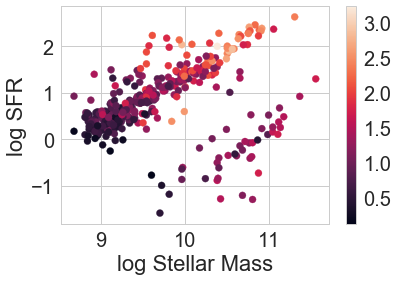

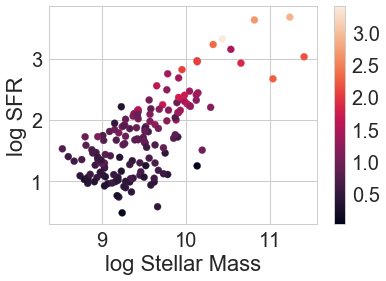

0

In [5]:
# This is a full CANDELS/GOODS-S catalog

# Header data
# id    z    
#tau  tau_l68  tau_h68  
#metal  met_l68  met_h68 
#lg_age lg_a_l68 lg_a_h68   
#ebv ebv_l68 ebv_h68 
#delta del_l68 del_h68 
#lg_mass lg_mass_l68 lg_mass_h68 
#lg_sfr lg_sfr_l68 lg_sfr_h68


# updating brett's outputs:

#     id    z    
#tau  tau_l68  tau_h68  
#metal  met_l68  met_h68 
#lg_age lg_a_l68 lg_a_h68   
#ebv ebv_l68 ebv_h68 
#delta del_l68 del_h68 
#lg_mass lg_mass_l68 lg_mass_h68 
#lg_salmon_sfr lg_sfr lg_sfr_l68 lg_sfr_h68

brett_cat = np.genfromtxt('code_outputs/fitsed_goods-s_z1_071718.dat')
print(brett_cat.shape)


# Galaxy IDs
brett_ids_full = brett_cat[0:,0]

# Stellar Mass
brett_mass_full = brett_cat[0:,17]
brett_mass_lo_full = brett_cat[0:,18]
brett_mass_hi_full = brett_cat[0:,19]

# Star Formation Rate
brett_sfr_full = brett_cat[0:,20]
brett_sfr_lo_full = brett_cat[0:,21]
brett_sfr_hi_full = brett_cat[0:,22]

# Dust estimate
brett_Av_full = brett_cat[0:,11]*4.05
brett_Av_lo_full = brett_cat[0:,12]*4.05
brett_Av_hi_full = brett_cat[0:,13]*4.05

# some of the dust values are -400, setting these to Number_of_bands_used
brett_Av_full[brett_Av_full < 0] = np.nan

#-------------------partition into small and z1 catalogs-----------------

# brett_mass_small = brett_mass_full[cat_small_ids.astype(int)]
# brett_mass_lo_small = brett_mass_lo_full[cat_small_ids.astype(int)]
# brett_mass_hi_small = brett_mass_hi_full[cat_small_ids.astype(int)]

# brett_mass_small[brett_mass_small < 0] = np.nan

# brett_sfr_small = brett_sfr_full[cat_small_ids.astype(int)]
# brett_sfr_lo_small = brett_sfr_lo_full[cat_small_ids.astype(int)]
# brett_sfr_hi_small = brett_sfr_hi_full[cat_small_ids.astype(int)]

# brett_Av_small = brett_Av_full[cat_small_ids.astype(int)]
# brett_Av_lo_small = brett_Av_lo_full[cat_small_ids.astype(int)]
# brett_Av_hi_small = brett_Av_hi_full[cat_small_ids.astype(int)]

#-----------------------------------------------------------

brett_mass_z1 = np.zeros((len(cat_z1_ids)))*np.nan
brett_sfr_z1 = np.zeros((len(cat_z1_ids)))*np.nan
brett_Av_z1 = np.zeros((len(cat_z1_ids)))*np.nan

brett_mass_lo_z1 = np.zeros((len(cat_z1_ids)))*np.nan
brett_sfr_lo_z1 = np.zeros((len(cat_z1_ids)))*np.nan
brett_Av_lo_z1 = np.zeros((len(cat_z1_ids)))*np.nan

brett_mass_hi_z1 = np.zeros((len(cat_z1_ids)))*np.nan
brett_sfr_hi_z1 = np.zeros((len(cat_z1_ids)))*np.nan
brett_Av_hi_z1 = np.zeros((len(cat_z1_ids)))*np.nan

for i in range(len(cat_z1_ids)):
    if np.sum(brett_ids_full == cat_z1_ids[i]+1) == 1:
        brett_mass_z1[i] = brett_mass_full[brett_ids_full == cat_z1_ids[i]+1]
        brett_sfr_z1[i] = brett_sfr_full[brett_ids_full == cat_z1_ids[i]+1]
        brett_Av_z1[i] = brett_Av_full[brett_ids_full == cat_z1_ids[i]+1]
        
        brett_mass_lo_z1[i] = brett_mass_lo_full[brett_ids_full == cat_z1_ids[i]+1]
        brett_sfr_lo_z1[i] = brett_sfr_lo_full[brett_ids_full == cat_z1_ids[i]+1]
        brett_Av_lo_z1[i] = brett_Av_lo_full[brett_ids_full == cat_z1_ids[i]+1]
        
        brett_mass_hi_z1[i] = brett_mass_hi_full[brett_ids_full == cat_z1_ids[i]+1]
        brett_sfr_hi_z1[i] = brett_sfr_hi_full[brett_ids_full == cat_z1_ids[i]+1]
        brett_Av_hi_z1[i] = brett_Av_hi_full[brett_ids_full == cat_z1_ids[i]+1]

# brett_mass_z1 = brett_mass_full[cat_z1_ids.astype(int)]
# brett_mass_lo_z1 = brett_mass_lo_full[cat_z1_ids.astype(int)]
# brett_mass_hi_z1 = brett_mass_hi_full[cat_z1_ids.astype(int)]

# brett_sfr_z1 = brett_sfr_full[cat_z1_ids.astype(int)]
# brett_sfr_lo_z1 = brett_sfr_lo_full[cat_z1_ids.astype(int)]
# brett_sfr_hi_z1 = brett_sfr_hi_full[cat_z1_ids.astype(int)]

# brett_Av_z1 = brett_Av_full[cat_z1_ids.astype(int)]
# brett_Av_lo_z1 = brett_Av_lo_full[cat_z1_ids.astype(int)]
# brett_Av_hi_z1 = brett_Av_hi_full[cat_z1_ids.astype(int)]

#-----------------------------------------------------------


# brett_mass_z3 = np.zeros((len(cat_z1_ids)))*np.nan
# brett_sfr_z3 = np.zeros((len(cat_z1_ids)))*np.nan
# brett_Av_z3 = np.zeros((len(cat_z1_ids)))*np.nan

# for i in range(len(cat_z3_ids)):
#     if np.sum(brett_ids_full == cat_z3_ids[i]+1) == 1:
#         brett_mass_z3[i] = brett_mass_full[brett_ids_full == cat_z3_ids[i]+1]
#         brett_sfr_z3[i] = brett_sfr_full[brett_ids_full == cat_z3_ids[i]+1]
#         brett_Av_z3[i] = brett_Av_full[brett_ids_full == cat_z3_ids[i]+1]

brett_cat = np.genfromtxt('code_outputs/Salmon_GSD_result.cat')
print(brett_cat.shape)



# Galaxy IDs
brett_ids_full = brett_cat[0:,0]

# Stellar Mass
brett_mass_full = brett_cat[0:,17]
brett_mass_lo_full = brett_cat[0:,18]
brett_mass_hi_full = brett_cat[0:,19]

# Star Formation Rate
brett_sfr_full = brett_cat[0:,20]
brett_sfr_lo_full = brett_cat[0:,21]
brett_sfr_hi_full = brett_cat[0:,22]

# Dust estimate
brett_Av_full = brett_cat[0:,11]*4.05
brett_Av_lo_full = brett_cat[0:,12]*4.05
brett_Av_hi_full = brett_cat[0:,13]*4.05

# some of the dust values are -400, setting these to Number_of_bands_used
brett_Av_full[brett_Av_full < 0] = np.nan

brett_mass_z3 = brett_mass_full[cat_z3_ids.astype(int)]
brett_mass_lo_z3 = brett_mass_lo_full[cat_z3_ids.astype(int)]
brett_mass_hi_z3 = brett_mass_hi_full[cat_z3_ids.astype(int)]

brett_sfr_z3 = brett_sfr_full[cat_z3_ids.astype(int)]
brett_sfr_lo_z3 = brett_sfr_lo_full[cat_z3_ids.astype(int)]
brett_sfr_hi_z3 = brett_sfr_hi_full[cat_z3_ids.astype(int)]

brett_Av_z3 = brett_Av_full[cat_z3_ids.astype(int)]
brett_Av_lo_z3 = brett_Av_lo_full[cat_z3_ids.astype(int)]
brett_Av_hi_z3 = brett_Av_hi_full[cat_z3_ids.astype(int)]

#---------------plot SFR-M* diagrams as a consistency check

# plt.scatter(brett_mass_small,brett_sfr_small,c = brett_Av_small)
# plt.colorbar()
# plt.ylim(-4,3)
# plt.xlim(8,12)
# plt.xlabel('log Stellar Mass')
# plt.ylabel('log SFR')
# plt.show()


plt.scatter(brett_mass_z1[brett_sfr_z1>-90],brett_sfr_z1[brett_sfr_z1>-90],c = brett_Av_z1[brett_sfr_z1>-90])
plt.colorbar()
#plt.ylim(-10,3)
#plt.xlim(4,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(brett_mass_z3,brett_sfr_z3,c = brett_Av_z3)
plt.colorbar()
#plt.ylim(-10,3)
#plt.xlim(4,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

np.sum(np.isnan(brett_mass_z3) == np.nan)

### Nima's fits

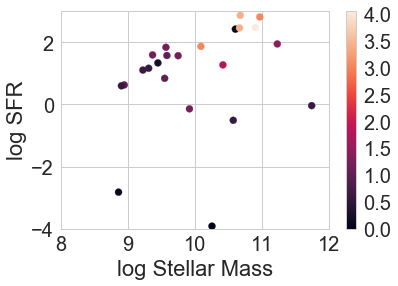

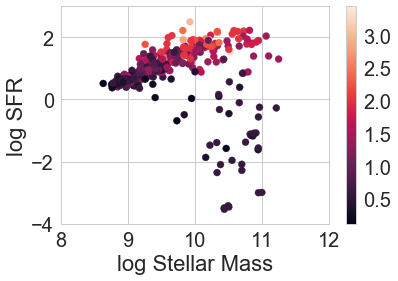

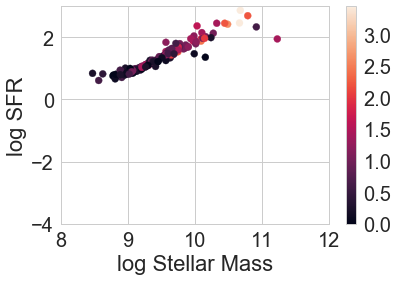

In [6]:
# This is a full CANDELS/GOODS-S catalog

nima_cat = np.genfromtxt('code_outputs/Nima_GOODSS_v2.1.txt')
print(nima_cat.shape)

# ==================================================
# 1 ID
# 2 RAdeg
# 3 DECdeg
# 4 z_Best
# 5 E(B-v)
# 6 Rest-frame U/Johnson
# 7 Rest-frame B/Johnson
# 8 Rest-frame V/Johnson
# 9 Rest-frame R/Johnson
# 10 Rest-frame I/Johnson
# 11 Rest-frame J/2mass
# 12 Rest-frame H/2mass
# 13 Rest-frame K/2mass
# 14 Rest-frame UV_1500
# 15 Age_Best
# 16 Age_inf 
# 17 Age_med
# 18 Age_sup
# 19 log(Mass)_Best
# 20 log(Mass)_inf
# 21 log(Mass)_med
# 22 log(Mass)_sup
# 23 log(SFR)_Best
# 24 log(SFR)_inf
# 25 log(SFR)_med
# 26 log(SFR)_sup
# 27 log(sSFR)_Best
# 28 log(sSFR)_inf
# 29 log(sSFR)_med
# 30 log(sSFR)_sup
# 31 chi_Best
# 32 Number_of_bands_used
# 33 Model_Best(BC03)
# 34 Class_star
# 35 AGNFlag 

# Galaxy IDs
nima_ids_full = nima_cat[0:,0]

# Stellar Mass
nima_mass_full = nima_cat[0:,20]
nima_mass_lo_full = nima_cat[0:,19]
nima_mass_hi_full = nima_cat[0:,21]

# Star Formation Rate
nima_sfr_full = nima_cat[0:,24]
nima_sfr_lo_full = nima_cat[0:,23]
nima_sfr_hi_full = nima_cat[0:,25]

# Dust estimate
nima_Av_full = nima_cat[0:,4]*4.05


#-------------------partition into small and z1 catalogs-----------------

nima_mass_small = nima_mass_full[cat_small_ids.astype(int)]
nima_mass_lo_small = nima_mass_lo_full[cat_small_ids.astype(int)]
nima_mass_hi_small = nima_mass_hi_full[cat_small_ids.astype(int)]

nima_sfr_small = nima_sfr_full[cat_small_ids.astype(int)]
nima_sfr_lo_small = nima_sfr_lo_full[cat_small_ids.astype(int)]
nima_sfr_hi_small = nima_sfr_hi_full[cat_small_ids.astype(int)]

nima_Av_small = nima_Av_full[cat_small_ids.astype(int)]

#------------------------------------------------------------------

nima_mass_z1 = nima_mass_full[cat_z1_ids.astype(int)]
nima_mass_lo_z1 = nima_mass_lo_full[cat_z1_ids.astype(int)]
nima_mass_hi_z1 = nima_mass_hi_full[cat_z1_ids.astype(int)]

nima_sfr_z1 = nima_sfr_full[cat_z1_ids.astype(int)]
nima_sfr_lo_z1 = nima_sfr_lo_full[cat_z1_ids.astype(int)]
nima_sfr_hi_z1 = nima_sfr_hi_full[cat_z1_ids.astype(int)]

nima_Av_z1 = nima_Av_full[cat_z1_ids.astype(int)]

#------------------------------------------------------------------

nima_mass_z3 = nima_mass_full[cat_z3_ids.astype(int)]
nima_mass_lo_z3 = nima_mass_lo_full[cat_z3_ids.astype(int)]
nima_mass_hi_z3 = nima_mass_hi_full[cat_z3_ids.astype(int)]

nima_sfr_z3 = nima_sfr_full[cat_z3_ids.astype(int)]
nima_sfr_lo_z3 = nima_sfr_lo_full[cat_z3_ids.astype(int)]
nima_sfr_hi_z3 = nima_sfr_hi_full[cat_z3_ids.astype(int)]

nima_Av_z3 = nima_Av_full[cat_z3_ids.astype(int)]

#---------------plot SFR-M* diagrams as a consistency check

plt.scatter(nima_mass_small,nima_sfr_small,c = nima_Av_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(nima_mass_z1,nima_sfr_z1,c = nima_Av_z1)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(nima_mass_z3,nima_sfr_z3,c = nima_Av_z3)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

### Marianna's fits

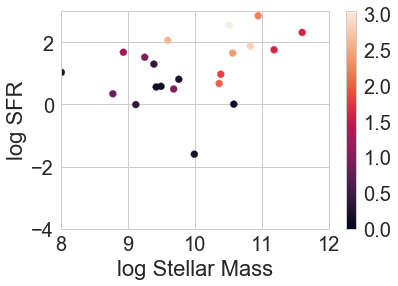

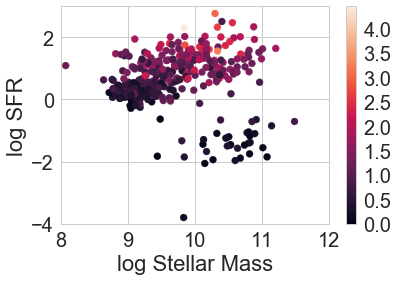

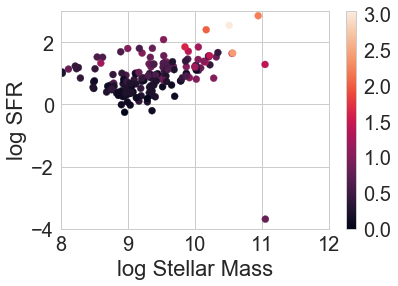

In [7]:
# This is a full CANDELS/GOODS-S catalog

marianna_cat = np.genfromtxt('code_outputs/marianna_GOODSS_BC03_zbest.dat')
print(marianna_cat.shape)

#header data
#log10(mass)	SFR	age	E(B-V)	U	B	BJ	V	R	I	J	K

# Galaxy IDs
marianna_ids_full = np.arange(marianna_cat.shape[0])

# Stellar Mass
marianna_mass_full = marianna_cat[0:,0]
marianna_mass_lo_full = marianna_cat[0:,0] - 0.1
marianna_mass_hi_full = marianna_cat[0:,0] + 0.1

# Star Formation Rates
marianna_sfr_full = np.log10(marianna_cat[0:,1])
marianna_sfr_lo_full = np.log10(marianna_cat[0:,1]) - 0.1
marianna_sfr_hi_full = np.log10(marianna_cat[0:,1]) + 0.1

# Dust estimate
marianna_Av_full = marianna_cat[0:,3]*4.05


#-------------------partition into small and z1 catalogs-----------------

marianna_mass_small = marianna_mass_full[cat_small_ids.astype(int)]
marianna_mass_lo_small = marianna_mass_lo_full[cat_small_ids.astype(int)]
marianna_mass_hi_small = marianna_mass_hi_full[cat_small_ids.astype(int)]

marianna_sfr_small = marianna_sfr_full[cat_small_ids.astype(int)]
marianna_sfr_lo_small = marianna_sfr_lo_full[cat_small_ids.astype(int)]
marianna_sfr_hi_small = marianna_sfr_hi_full[cat_small_ids.astype(int)]

marianna_Av_small = marianna_Av_full[cat_small_ids.astype(int)]

#------------------------------------------------------------------

marianna_mass_z1 = marianna_mass_full[cat_z1_ids.astype(int)]
marianna_mass_lo_z1 = marianna_mass_lo_full[cat_z1_ids.astype(int)]
marianna_mass_hi_z1 = marianna_mass_hi_full[cat_z1_ids.astype(int)]

marianna_sfr_z1 = marianna_sfr_full[cat_z1_ids.astype(int)]
marianna_sfr_lo_z1 = marianna_sfr_lo_full[cat_z1_ids.astype(int)]
marianna_sfr_hi_z1 = marianna_sfr_hi_full[cat_z1_ids.astype(int)]

marianna_Av_z1 = marianna_Av_full[cat_z1_ids.astype(int)]

#-------------------------------------------------------------------

marianna_mass_z3 = marianna_mass_full[cat_z3_ids.astype(int)]
marianna_mass_lo_z3 = marianna_mass_lo_full[cat_z3_ids.astype(int)]
marianna_mass_hi_z3 = marianna_mass_hi_full[cat_z3_ids.astype(int)]

marianna_sfr_z3 = marianna_sfr_full[cat_z3_ids.astype(int)]
marianna_sfr_lo_z3 = marianna_sfr_lo_full[cat_z3_ids.astype(int)]
marianna_sfr_hi_z3 = marianna_sfr_hi_full[cat_z3_ids.astype(int)]

marianna_Av_z3 = marianna_Av_full[cat_z3_ids.astype(int)]


#---------------plot SFR-M* diagrams as a consistency check

plt.scatter(marianna_mass_small,marianna_sfr_small,c = marianna_Av_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(marianna_mass_z1,marianna_sfr_z1,c = marianna_Av_z1)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(marianna_mass_z3,marianna_sfr_z3,c = marianna_Av_z3)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

# import Joel's Prospector Fits

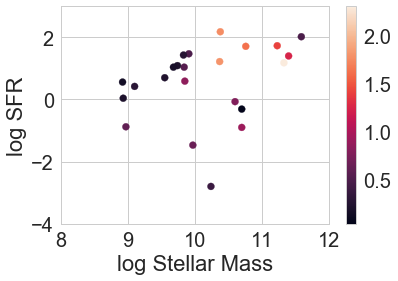

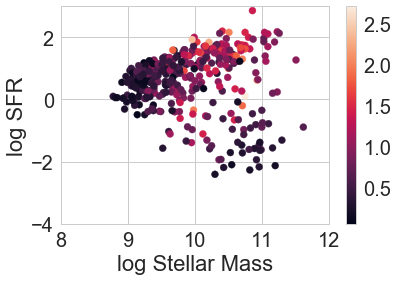

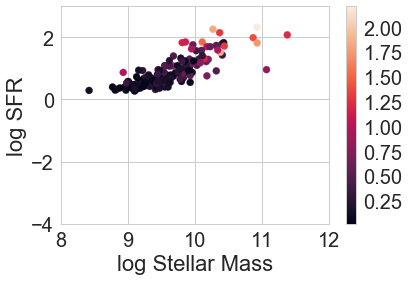

In [8]:
# Fits using Prospector - not importing the z1 IR, IR+AGN samples for now, waiting till we get more people to send their outputs 

prospector_cat_small = np.genfromtxt('code_outputs/prospector_output.dat',delimiter=',')

prospector_ids_small = prospector_cat_small[0:,0]

prospector_mass_small = prospector_cat_small[0:,1]
prospector_mass_hi_small = prospector_cat_small[0:,1] + prospector_cat_small[0:,2]
prospector_mass_lo_small = prospector_cat_small[0:,1] - prospector_cat_small[0:,3]

prospector_sfr_small = prospector_cat_small[0:,4]
prospector_sfr_hi_small = prospector_cat_small[0:,5]
prospector_sfr_lo_small = prospector_cat_small[0:,6]

prospector_Av_small = prospector_cat_small[0:,7]
prospector_Av_hi_small = prospector_cat_small[0:,8]
prospector_Av_lo_small = prospector_cat_small[0:,9]

prospector_cat_z1 = np.genfromtxt('code_outputs/prospector_output_z1.dat',delimiter=',')

prospector_ids_z1 = prospector_cat_z1[0:,0]

prospector_mass_z1 = prospector_cat_z1[0:,1]
prospector_mass_hi_z1 = prospector_cat_z1[0:,1] + prospector_cat_z1[0:,2]
prospector_mass_lo_z1 = prospector_cat_z1[0:,1] - prospector_cat_z1[0:,3]

prospector_sfr_z1 = prospector_cat_z1[0:,4]
prospector_sfr_hi_z1 = prospector_cat_z1[0:,5]
prospector_sfr_lo_z1 = prospector_cat_z1[0:,6]

prospector_Av_z1 = prospector_cat_z1[0:,7]
prospector_Av_hi_z1 = prospector_cat_z1[0:,8]
prospector_Av_lo_z1 = prospector_cat_z1[0:,9]


prospector_cat_z3 = np.genfromtxt('code_outputs/prospector_output_z3.dat',delimiter=',')

# objname,logmass,logmass_errup,logmass_errdown,
#logsfr100,logsfr100_errup,logsfr100_errdown,
#logsfr10,logsfr10_errup,logsfr10_errdown,
#mwa,mwa_errup,mwa_errdown,
#av,av_errup,av_errdown

prospector_ids_z3 = prospector_cat_z3[0:,0]

prospector_mass_z3 = prospector_cat_z3[0:,1]
prospector_mass_hi_z3 = prospector_cat_z3[0:,1] + prospector_cat_z3[0:,2]
prospector_mass_lo_z3 = prospector_cat_z3[0:,1] - prospector_cat_z3[0:,3]

prospector_sfr_z3 = prospector_cat_z3[0:,4]
prospector_sfr_hi_z3 = prospector_cat_z3[0:,5]
prospector_sfr_lo_z3 = prospector_cat_z3[0:,6]

prospector_Av_z3 = prospector_cat_z3[0:,13]
prospector_Av_hi_z3 = prospector_cat_z3[0:,14]
prospector_Av_lo_z3 = prospector_cat_z3[0:,15]


#---------------plot SFR-M* diagrams as a consistency check

plt.scatter(prospector_mass_small,prospector_sfr_small,c = prospector_Av_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(prospector_mass_z1,prospector_sfr_z1,c = prospector_Av_z1)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(prospector_mass_z3,prospector_sfr_z3,c = prospector_Av_z3)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

print(prospector_mass_small, prospector_mass_lo_small)

# import Bagpipes data

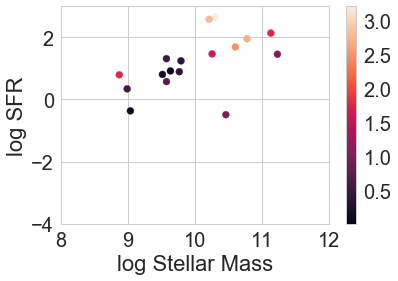

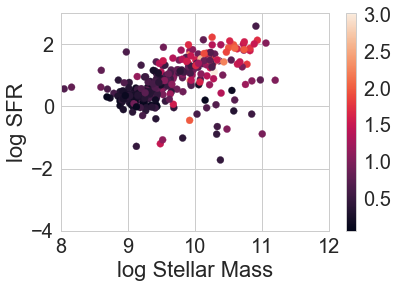

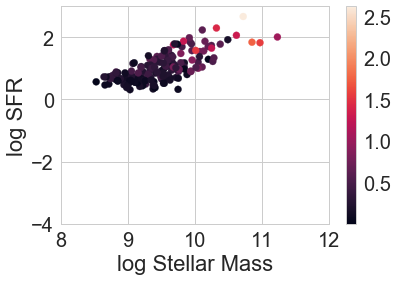

In [9]:
bagpipes_cat_small = np.genfromtxt('code_outputs/bagpipes_first_cat_pipes_output.txt')
print(bagpipes_cat_small.shape)

bagpipes_id = bagpipes_cat_small[0:,0]

bagpipes_Av_lo_small= bagpipes_cat_small[0:,1]
bagpipes_Av_small = bagpipes_cat_small[0:,2]
bagpipes_Av_hi_small = bagpipes_cat_small[0:,3]

bagpipes_mass_lo_small = np.log10(bagpipes_cat_small[0:,34])
bagpipes_mass_small = np.log10(bagpipes_cat_small[0:,35])
bagpipes_mass_hi_small = np.log10(bagpipes_cat_small[0:,36])

bagpipes_sfr_lo_small = np.log10(bagpipes_cat_small[0:,31])
bagpipes_sfr_small = np.log10(bagpipes_cat_small[0:,32])
bagpipes_sfr_hi_small = np.log10(bagpipes_cat_small[0:,33])

# ID dust:Av_16 dust:Av_median dust:Av_84 
#dblplaw:tau_16 dblplaw:tau_median dblplaw:tau_84 
#dblplaw:beta_16 dblplaw:beta_median dblplaw:beta_84 
#dblplaw:metallicity_16 dblplaw:metallicity_median dblplaw:metallicity_84 
#dblplaw:massformed_16 dblplaw:massformed_median dblplaw:massformed_84 
#dblplaw:alpha_16 dblplaw:alpha_median dblplaw:alpha_84 
#redshift_16 redshift_median redshift_84 
#UVcolour_16 UVcolour_median UVcolour_84 
#VJcolour_16 VJcolour_median VJcolour_84 
#tmw_16 tmw_median tmw_84 
#sfr_16 sfr_median sfr_84 
#mstar_liv_16 mstar_liv_median mstar_liv_84 
#z_input global_log_evidence global_log_evidence_err min_chisq_reduced


bagpipes_cat_z1 = np.genfromtxt('code_outputs/bagpipes_z1_cat_pipes_output.txt')
print(bagpipes_cat_z1.shape)

bagpipes_id = bagpipes_cat_z1[0:,0]

bagpipes_Av_lo_z1= bagpipes_cat_z1[0:,1]
bagpipes_Av_z1 = bagpipes_cat_z1[0:,2]
bagpipes_Av_hi_z1 = bagpipes_cat_z1[0:,3]

bagpipes_mass_lo_z1 = np.log10(bagpipes_cat_z1[0:,34])
bagpipes_mass_z1 = np.log10(bagpipes_cat_z1[0:,35])
bagpipes_mass_hi_z1 = np.log10(bagpipes_cat_z1[0:,36])

bagpipes_sfr_lo_z1 = np.log10(bagpipes_cat_z1[0:,31])
bagpipes_sfr_z1 = np.log10(bagpipes_cat_z1[0:,32])
bagpipes_sfr_hi_z1 = np.log10(bagpipes_cat_z1[0:,33])

# ID 
#dust:Av_16 dust:Av_median dust:Av_84 
#dblplaw:tau_16 dblplaw:tau_median dblplaw:tau_84 
#dblplaw:metallicity_16 dblplaw:metallicity_median dblplaw:metallicity_84 
#dblplaw:beta_16 dblplaw:beta_median dblplaw:beta_84 
#dblplaw:massformed_16 dblplaw:massformed_median dblplaw:massformed_84 
#dblplaw:alpha_16 dblplaw:alpha_median dblplaw:alpha_84 
#UVcolour_16 UVcolour_median UVcolour_84 VJcolour_16 VJcolour_median VJcolour_84 
#tmw_16 tmw_median tmw_84 
#sfr_16 sfr_median sfr_84 
#mstar_liv_16 mstar_liv_median mstar_liv_84 
#z_input log_evidence log_evidence_err min_chisq_reduced


bagpipes_cat_z3 = np.genfromtxt('code_outputs/bagpipes_ucr_z3_results.cat')
print(bagpipes_cat_z3.shape)

bagpipes_id = bagpipes_cat_z3[0:,0]

bagpipes_Av_lo_z3= bagpipes_cat_z3[0:,1]
bagpipes_Av_z3 = bagpipes_cat_z3[0:,2]
bagpipes_Av_hi_z3 = bagpipes_cat_z3[0:,3]

bagpipes_mass_lo_z3 = np.log10(bagpipes_cat_z3[0:,31])
bagpipes_mass_z3 = np.log10(bagpipes_cat_z3[0:,32])
bagpipes_mass_hi_z3 = np.log10(bagpipes_cat_z3[0:,33])

bagpipes_sfr_lo_z3 = np.log10(bagpipes_cat_z3[0:,28])
bagpipes_sfr_z3 = np.log10(bagpipes_cat_z3[0:,29])
bagpipes_sfr_hi_z3 = np.log10(bagpipes_cat_z3[0:,30])

#---------------plot SFR-M* diagrams as a consistency check

plt.scatter(bagpipes_mass_small,bagpipes_sfr_small,c = bagpipes_Av_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(bagpipes_mass_z1,bagpipes_sfr_z1,c = bagpipes_Av_z1)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(bagpipes_mass_z3,bagpipes_sfr_z3,c = bagpipes_Av_z3)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

# import Cigale fits

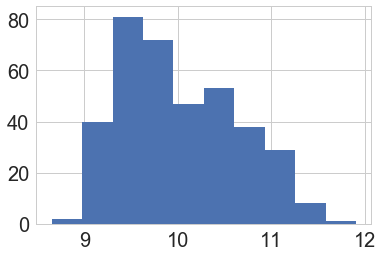

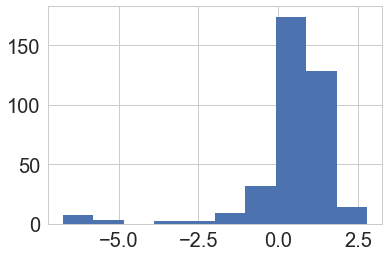

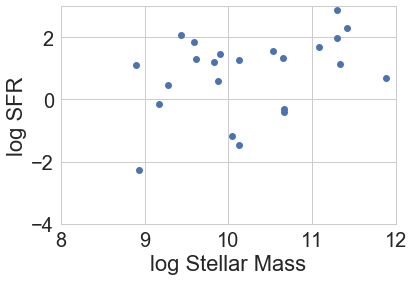

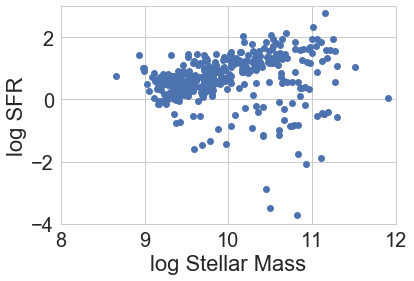

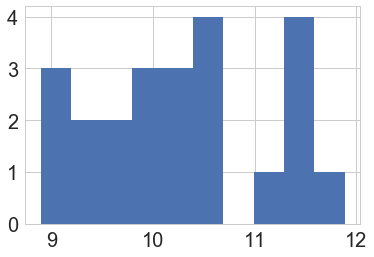

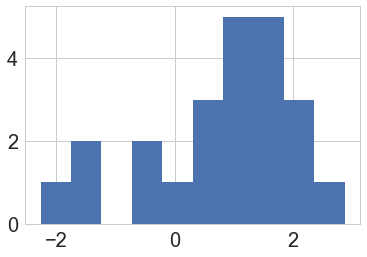

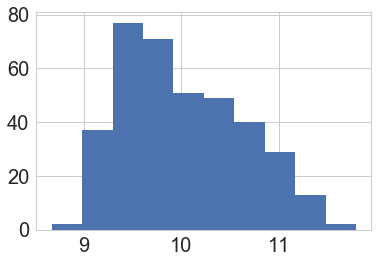

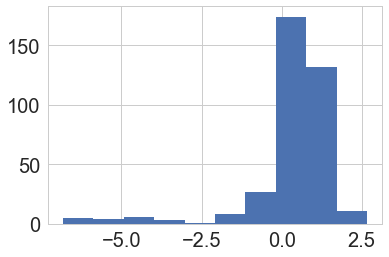

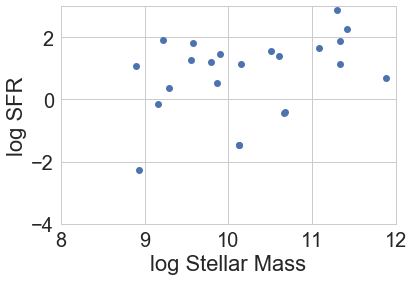

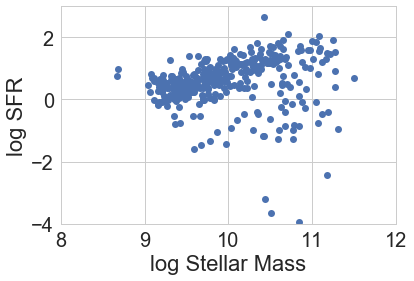

In [10]:
cigale_cat = np.genfromtxt('code_outputs/cigale_results_noAGN.txt')
print(cigale_cat.shape)

# what parameter should I use to best compare to the Calzetti Av that other codes produce? 

#header: id  
#bayes.attenuation.E_BVs.stellar.young  bayes.attenuation.E_BVs.stellar.young_err  
#bayes.attenuation.FUV  bayes.attenuation.FUV_err  
#bayes.param.IRX  bayes.param.IRX_err  bayes.param.beta_calz94  bayes.param.beta_calz94_err  
#bayes.sfh.age  bayes.sfh.age_err  bayes.sfh.burst_age  bayes.sfh.burst_age_err  
#bayes.sfh.f_burst  bayes.sfh.f_burst_err  bayes.sfh.tau_main  bayes.sfh.tau_main_err  
#bayes.stellar.metallicity  bayes.stellar.metallicity_err  
#bayes.dust.luminosity  bayes.dust.luminosity_err  
#bayes.param.restframe_Lnu(FUV)  bayes.param.restframe_Lnu(FUV)_err  
#bayes.sfh.sfr10Myrs  bayes.sfh.sfr10Myrs_err  
#bayes.stellar.m_star  bayes.stellar.m_star_err  
#best.chi_square  best.reduced_chi_square  
#best.attenuation.B_B90  best.attenuation.E_BVs.nebular.continuum_old  
#best.attenuation.E_BVs.nebular.continuum_young  
#best.attenuation.E_BVs.nebular.lines_old  best.attenuation.E_BVs.nebular.lines_young  
#best.attenuation.E_BVs.stellar.old  best.attenuation.E_BVs.stellar.young  
#best.attenuation.FUV  best.attenuation.V_B90  best.attenuation.ebvs_old_factor  
#best.attenuation.powerlaw_slope  best.attenuation.uv_bump_amplitude  best.attenuation.uv_bump_wavelength  
#best.attenuation.uv_bump_width  best.dust.alpha  best.dust.gamma  best.dust.qpah  best.dust.umin  
#best.nebular.f_dust  best.nebular.f_esc  best.nebular.lines_width  best.nebular.logU  
#best.param.EW(500.7/1.0)  best.param.EW(656.3/1.0)    best.param.IRX  best.param.beta_calz94  
#best.param.restframe_FUV-NUV  best.param.restframe_NUV-r_prime  best.sfh.age  best.sfh.burst_age  
#best.sfh.f_burst  best.sfh.tau_burst  best.sfh.tau_main  best.stellar.age_m_star  best.stellar.imf  
#best.stellar.metallicity  best.stellar.old_young_separation_age  best.universe.age  
#best.universe.luminosity_distance  best.universe.redshift  best.attenuation.nebular.continuum_old  
#best.attenuation.nebular.continuum_young  best.attenuation.nebular.lines_old  best.attenuation.nebular.lines_young  
#best.attenuation.stellar.old  best.attenuation.stellar.young  best.dust.luminosity     best.dust.mass  
#best.param.restframe_Lnu(FUV)  best.param.restframe_Lnu(V_B90)  best.sfh.integrated       
#best.sfh.sfr  best.sfh.sfr100Myrs  best.sfh.sfr10Myrs   best.stellar.lum  best.stellar.lum_ly  
#best.stellar.lum_ly_old  best.stellar.lum_ly_young  best.stellar.lum_old  best.stellar.lum_young  
#best.stellar.m_gas  best.stellar.m_gas_old  best.stellar.m_gas_young  best.stellar.m_star  best.stellar.m_star_old  
#best.stellar.m_star_young  best.stellar.n_ly  best.stellar.n_ly_old  best.stellar.n_ly_young        
#best.CTIO_U       best.VIMOS_U     best.ACS_F435W     best.ACS_F606W     best.ACS_F775W     best.ACS_F814W    
#best.ACS_F850LP    best.WFC3_F098M    best.WFC3_F105W    best.WFC3_F125W    best.WFC3_F160W      best.ISAAC_KS      
#best.HAWKI_KS      best.IRAC_CH1      best.IRAC_CH2      best.IRAC_CH3      best.IRAC_CH4 
    

cigale_id = cigale_cat[0:,0]

# the Cigale output is a single file for both the small and z=1 catalogs.
# I'm splitting this into two catalogs

cigale_mask_small = np.zeros_like(cigale_id)
for i in range(len(cat_small_ids)):
    cigale_mask_small[cigale_id == cat_small_ids[i]+1] = 1

cigale_mask_z1 = np.zeros_like(cigale_id)
for i in range(len(cat_z1_ids)):
    cigale_mask_z1[cigale_id == cat_z1_ids[i]+1] = 1
    
print(np.sum(cigale_mask_small))
print(np.sum(cigale_mask_z1))

#----------------------------------
        
cigale_id_small = cigale_id[cigale_mask_small.astype(bool)]



cigale_mass_small_noagn = np.log10(cigale_cat[cigale_mask_small.astype(bool),25])
cigale_mass_err_noagn = np.log10(cigale_cat[cigale_mask_small.astype(bool),26])
cigale_mass_lo_small_noagn = np.log10(10**cigale_mass_small_noagn - 10**cigale_mass_err_noagn)
cigale_mass_hi_small_noagn = np.log10(10**cigale_mass_small_noagn + 10**cigale_mass_err_noagn)

cigale_id_z1 = cigale_id[cigale_mask_z1.astype(bool)]

cigale_sfr_small_noagn = np.log10(cigale_cat[cigale_mask_small.astype(bool),23])
cigale_sfr_err_noagn = np.log10(cigale_cat[cigale_mask_small.astype(bool),24])
cigale_sfr_lo_small_noagn = np.log10(10**cigale_sfr_small_noagn - 10**cigale_sfr_err_noagn)
cigale_sfr_hi_small_noagn = np.log10(10**cigale_sfr_small_noagn + 10**cigale_sfr_err_noagn)


cigale_mass_z1_noagn = np.log10(cigale_cat[cigale_mask_z1.astype(bool),25])
cigale_mass_err_z1_noagn = np.log10(cigale_cat[cigale_mask_z1.astype(bool),26])
cigale_mass_lo_z1_noagn = np.log10(10**cigale_mass_z1_noagn - 10**cigale_mass_err_z1_noagn)
cigale_mass_hi_z1_noagn = np.log10(10**cigale_mass_z1_noagn + 10**cigale_mass_err_z1_noagn)
plt.hist(cigale_mass_z1_noagn)
plt.show()

cigale_sfr_z1_noagn = np.log10(cigale_cat[cigale_mask_z1.astype(bool),23])
cigale_sfr_err_z1_noagn = np.log10(cigale_cat[cigale_mask_z1.astype(bool),24])
cigale_sfr_lo_z1_noagn = np.log10(10**cigale_sfr_z1_noagn - 10**cigale_sfr_z1_noagn)
cigale_sfr_hi_z1_noagn = np.log10(10**cigale_sfr_z1_noagn + 10**cigale_sfr_z1_noagn)
plt.hist(cigale_sfr_z1_noagn)
plt.show()

plt.plot(cigale_mass_small_noagn,cigale_sfr_small_noagn,'o')
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

plt.plot(cigale_mass_z1_noagn,cigale_sfr_z1_noagn,'o')
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


#------------------------------------------------------------------
# with AGN

#id  
#bayes.agn.fracAGN  bayes.agn.fracAGN_err     bayes.agn.psy  bayes.agn.psy_err  
#bayes.agn.tau  bayes.agn.tau_err  
#bayes.attenuation.E_BVs.stellar.young  bayes.attenuation.E_BVs.stellar.young_err  
#bayes.attenuation.FUV  bayes.attenuation.FUV_err  
#bayes.param.IRX  bayes.param.IRX_err  bayes.param.beta_calz94  bayes.param.beta_calz94_err  
#bayes.sfh.age  bayes.sfh.age_err  bayes.sfh.burst_age  bayes.sfh.burst_age_err  
#bayes.sfh.f_burst  bayes.sfh.f_burst_err  bayes.sfh.tau_main  bayes.sfh.tau_main_err  
#bayes.stellar.metallicity  bayes.stellar.metallicity_err  bayes.dust.luminosity  bayes.dust.luminosity_err  
#bayes.param.restframe_Lnu(FUV)  bayes.param.restframe_Lnu(FUV)_err  
#bayes.sfh.sfr10Myrs  bayes.sfh.sfr10Myrs_err  
#bayes.stellar.m_star  bayes.stellar.m_star_err  best.chi_square  best.reduced_chi_square  best.agn.beta  best.agn.fracAGN  best.agn.gamma  best.agn.opening_angle  best.agn.psy  best.agn.r_ratio  best.agn.tau  best.attenuation.B_B90  best.attenuation.E_BVs.nebular.continuum_old  best.attenuation.E_BVs.nebular.continuum_young  best.attenuation.E_BVs.nebular.lines_old  best.attenuation.E_BVs.nebular.lines_young  best.attenuation.E_BVs.stellar.old  best.attenuation.E_BVs.stellar.young  best.attenuation.FUV  best.attenuation.V_B90  best.attenuation.ebvs_old_factor  best.attenuation.powerlaw_slope  best.attenuation.uv_bump_amplitude  best.attenuation.uv_bump_wavelength  best.attenuation.uv_bump_width  best.dust.alpha  best.dust.gamma  best.dust.qpah  best.dust.umin  best.nebular.f_dust  best.nebular.f_esc  best.nebular.lines_width  best.nebular.logU  best.param.EW(500.7/1.0)  best.param.EW(656.3/1.0)    best.param.IRX  best.param.beta_calz94  best.param.restframe_FUV-NUV  best.param.restframe_NUV-r_prime  best.sfh.age  best.sfh.burst_age  best.sfh.f_burst  best.sfh.tau_burst  best.sfh.tau_main  best.stellar.age_m_star  best.stellar.imf  best.stellar.metallicity  best.stellar.old_young_separation_age  best.universe.age  best.universe.luminosity_distance  best.universe.redshift  best.agn.agn_luminosity  best.agn.luminosity  best.agn.scatt_luminosity  best.agn.therm_luminosity  best.attenuation.nebular.continuum_old  best.attenuation.nebular.continuum_young  best.attenuation.nebular.lines_old  best.attenuation.nebular.lines_young  best.attenuation.stellar.old  best.attenuation.stellar.young  best.dust.luminosity     best.dust.mass  best.param.restframe_Lnu(FUV)  best.param.restframe_Lnu(V_B90)  best.sfh.integrated       best.sfh.sfr  best.sfh.sfr100Myrs  best.sfh.sfr10Myrs   best.stellar.lum  best.stellar.lum_ly  best.stellar.lum_ly_old  best.stellar.lum_ly_young  best.stellar.lum_old  best.stellar.lum_young  best.stellar.m_gas  best.stellar.m_gas_old  best.stellar.m_gas_young  best.stellar.m_star  best.stellar.m_star_old  best.stellar.m_star_young  best.stellar.n_ly  best.stellar.n_ly_old  best.stellar.n_ly_young        best.CTIO_U       best.VIMOS_U     best.ACS_F435W     best.ACS_F606W     best.ACS_F775W     best.ACS_F814W    best.ACS_F850LP    best.WFC3_F098M    best.WFC3_F105W    best.WFC3_F125W    best.WFC3_F160W      best.ISAAC_KS      best.HAWKI_KS      best.IRAC_CH1      best.IRAC_CH2      best.IRAC_CH3      best.IRAC_CH4 
    
print('doing things with AGN now')
    
cigale_cat = np.genfromtxt('code_outputs/cigale_results_wAGN.txt')
print(cigale_cat.shape)

cigale_id = cigale_cat[0:,0]

cigale_mask_small = np.zeros_like(cigale_id)
for i in range(len(cat_small_ids)):
    cigale_mask_small[cigale_id == cat_small_ids[i]+1] = 1

cigale_mask_z1 = np.zeros_like(cigale_id)
for i in range(len(cat_z1_ids)):
    cigale_mask_z1[cigale_id == cat_z1_ids[i]+1] = 1
    
print(np.sum(cigale_mask_small))
print(np.sum(cigale_mask_z1))
        
cigale_id_small = cigale_id[cigale_mask_small.astype(bool)]
cigale_mass_small_wagn = np.log10(cigale_cat[cigale_mask_small.astype(bool),31])
cigale_mass_err_wagn = np.log10(cigale_cat[cigale_mask_small.astype(bool),32])
cigale_mass_lo_small_wagn = np.log10(10**cigale_mass_small_wagn - 10**cigale_mass_err_wagn)
cigale_mass_hi_small_wagn = np.log10(10**cigale_mass_small_wagn + 10**cigale_mass_err_wagn)
plt.hist(cigale_mass_small_wagn)
plt.show()

cigale_id_z1 = cigale_id[cigale_mask_z1.astype(bool)]
cigale_sfr_small_wagn = np.log10(cigale_cat[cigale_mask_small.astype(bool),29])
cigale_sfr_err_wagn = np.log10(cigale_cat[cigale_mask_small.astype(bool),30])
cigale_sfr_lo_small_wagn = np.log10(10**cigale_sfr_small_wagn - 10**cigale_sfr_err_wagn)
cigale_sfr_hi_small_wagn = np.log10(10**cigale_sfr_small_wagn + 10**cigale_sfr_err_wagn)
plt.hist(cigale_sfr_small_wagn)
plt.show()



cigale_mass_z1_wagn = np.log10(cigale_cat[cigale_mask_z1.astype(bool),31])
cigale_mass_err_z1_wagn = np.log10(cigale_cat[cigale_mask_z1.astype(bool),32])
cigale_mass_lo_z1_wagn = np.log10(10**cigale_mass_z1_wagn - 10**cigale_mass_err_z1_wagn)
cigale_mass_hi_z1_wagn = np.log10(10**cigale_mass_z1_wagn + 10**cigale_mass_err_z1_wagn)
plt.hist(cigale_mass_z1_wagn)
plt.show()

cigale_sfr_z1_wagn = np.log10(cigale_cat[cigale_mask_z1.astype(bool),29])
cigale_sfr_err_z1_wagn = np.log10(cigale_cat[cigale_mask_z1.astype(bool),30])
cigale_sfr_lo_z1_wagn = np.log10(10**cigale_sfr_z1_wagn - 10**cigale_sfr_z1_wagn)
cigale_sfr_hi_z1_wagn = np.log10(10**cigale_sfr_z1_wagn + 10**cigale_sfr_z1_wagn)
plt.hist(cigale_sfr_z1_wagn)
plt.show()

plt.plot(cigale_mass_small_wagn,cigale_sfr_small_wagn,'o')
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

plt.plot(cigale_mass_z1_wagn,cigale_sfr_z1_wagn,'o')
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


#header: id  
#bayes.attenuation.E_BVs.stellar.young  bayes.attenuation.E_BVs.stellar.young_err  
#bayes.attenuation.FUV  bayes.attenuation.FUV_err  
#bayes.param.IRX  bayes.param.IRX_err  bayes.param.beta_calz94  bayes.param.beta_calz94_err  
#bayes.sfh.age  bayes.sfh.age_err  bayes.sfh.burst_age  bayes.sfh.burst_age_err  
#bayes.sfh.f_burst  bayes.sfh.f_burst_err  bayes.sfh.tau_main  bayes.sfh.tau_main_err  
#bayes.stellar.metallicity  bayes.stellar.metallicity_err  
#bayes.dust.luminosity  bayes.dust.luminosity_err  
#bayes.param.restframe_Lnu(FUV)  bayes.param.restframe_Lnu(FUV)_err  
#bayes.sfh.sfr10Myrs  bayes.sfh.sfr10Myrs_err  
#bayes.stellar.m_star  bayes.stellar.m_star_err  
#best.chi_square  best.reduced_chi_square  best.attenuation.B_B90  best.attenuation.E_BVs.nebular.continuum_old  best.attenuation.E_BVs.nebular.continuum_young  best.attenuation.E_BVs.nebular.lines_old  best.attenuation.E_BVs.nebular.lines_young  best.attenuation.E_BVs.stellar.old  best.attenuation.E_BVs.stellar.young  best.attenuation.FUV  best.attenuation.V_B90  best.attenuation.ebvs_old_factor  best.attenuation.powerlaw_slope  best.attenuation.uv_bump_amplitude  best.attenuation.uv_bump_wavelength  best.attenuation.uv_bump_width  best.dust.alpha  best.dust.gamma  best.dust.qpah  best.dust.umin  best.nebular.f_dust  best.nebular.f_esc  best.nebular.lines_width  best.nebular.logU  best.param.EW(500.7/1.0)  best.param.EW(656.3/1.0)    best.param.IRX  best.param.beta_calz94  best.param.restframe_FUV-NUV  best.param.restframe_NUV-r_prime  best.sfh.age  best.sfh.burst_age  best.sfh.f_burst  best.sfh.tau_burst  best.sfh.tau_main  best.stellar.age_m_star  best.stellar.imf  best.stellar.metallicity  best.stellar.old_young_separation_age  best.universe.age  best.universe.luminosity_distance  best.universe.redshift  best.attenuation.nebular.continuum_old  best.attenuation.nebular.continuum_young  best.attenuation.nebular.lines_old  best.attenuation.nebular.lines_young  best.attenuation.stellar.old  best.attenuation.stellar.young  best.dust.luminosity     best.dust.mass  best.param.restframe_Lnu(FUV)  best.param.restframe_Lnu(V_B90)  best.sfh.integrated       best.sfh.sfr  best.sfh.sfr100Myrs  best.sfh.sfr10Myrs   best.stellar.lum  best.stellar.lum_ly  best.stellar.lum_ly_old  best.stellar.lum_ly_young  best.stellar.lum_old  best.stellar.lum_young  best.stellar.m_gas  best.stellar.m_gas_old  best.stellar.m_gas_young  best.stellar.m_star  best.stellar.m_star_old  best.stellar.m_star_young  best.stellar.n_ly  best.stellar.n_ly_old  best.stellar.n_ly_young        best.CTIO_U       best.VIMOS_U     best.ACS_F435W     best.ACS_F606W     best.ACS_F775W     best.ACS_F814W    best.ACS_F850LP    best.WFC3_F098M    best.WFC3_F105W    best.WFC3_F125W    best.WFC3_F160W      best.ISAAC_KS      best.HAWKI_KS      best.IRAC_CH1      best.IRAC_CH2      best.IRAC_CH3      best.IRAC_CH4 
        


In [11]:
cigale_full = fits.open('code_outputs/CIGALE_results_candels_goods-south_v0.fits')
cigale_full.info()
cigale_full[1].header

# what parameter should I use to best compare to the Calzetti Av that other codes produce? 

#header: id  
#bayes.attenuation.E_BVs.stellar.young  bayes.attenuation.E_BVs.stellar.young_err  
#bayes.attenuation.FUV  bayes.attenuation.FUV_err  
#bayes.param.IRX  bayes.param.IRX_err  bayes.param.beta_calz94  bayes.param.beta_calz94_err  
#bayes.sfh.age  bayes.sfh.age_err  bayes.sfh.burst_age  bayes.sfh.burst_age_err  
#bayes.sfh.f_burst  bayes.sfh.f_burst_err  bayes.sfh.tau_main  bayes.sfh.tau_main_err  
#bayes.stellar.metallicity  bayes.stellar.metallicity_err  
#bayes.dust.luminosity  bayes.dust.luminosity_err  
#bayes.param.restframe_Lnu(FUV)  bayes.param.restframe_Lnu(FUV)_err  
#bayes.sfh.sfr10Myrs  bayes.sfh.sfr10Myrs_err  
#bayes.stellar.m_star  bayes.stellar.m_star_err  
#best.chi_square  best.reduced_chi_square  
#best.attenuation.B_B90  best.attenuation.E_BVs.nebular.continuum_old  
#best.attenuation.E_BVs.nebular.continuum_young  
#best.attenuation.E_BVs.nebular.lines_old  best.attenuation.E_BVs.nebular.lines_young  
#best.attenuation.E_BVs.stellar.old  best.attenuation.E_BVs.stellar.young  
#best.attenuation.FUV  best.attenuation.V_B90  best.attenuation.ebvs_old_factor  
#best.attenuation.powerlaw_slope  best.attenuation.uv_bump_amplitude  best.attenuation.uv_bump_wavelength  
#best.attenuation.uv_bump_width  best.dust.alpha  best.dust.gamma  best.dust.qpah  best.dust.umin  
#best.nebular.f_dust  best.nebular.f_esc  best.nebular.lines_width  best.nebular.logU  
#best.param.EW(500.7/1.0)  best.param.EW(656.3/1.0)    best.param.IRX  best.param.beta_calz94  
#best.param.restframe_FUV-NUV  best.param.restframe_NUV-r_prime  best.sfh.age  best.sfh.burst_age  
#best.sfh.f_burst  best.sfh.tau_burst  best.sfh.tau_main  best.stellar.age_m_star  best.stellar.imf  
#best.stellar.metallicity  best.stellar.old_young_separation_age  best.universe.age  
#best.universe.luminosity_distance  best.universe.redshift  best.attenuation.nebular.continuum_old  
#best.attenuation.nebular.continuum_young  best.attenuation.nebular.lines_old  best.attenuation.nebular.lines_young  
#best.attenuation.stellar.old  best.attenuation.stellar.young  best.dust.luminosity     best.dust.mass  
#best.param.restframe_Lnu(FUV)  best.param.restframe_Lnu(V_B90)  best.sfh.integrated       
#best.sfh.sfr  best.sfh.sfr100Myrs  best.sfh.sfr10Myrs   best.stellar.lum  best.stellar.lum_ly  
#best.stellar.lum_ly_old  best.stellar.lum_ly_young  best.stellar.lum_old  best.stellar.lum_young  
#best.stellar.m_gas  best.stellar.m_gas_old  best.stellar.m_gas_young  best.stellar.m_star  best.stellar.m_star_old  
#best.stellar.m_star_young  best.stellar.n_ly  best.stellar.n_ly_old  best.stellar.n_ly_young        
#best.CTIO_U       best.VIMOS_U     best.ACS_F435W     best.ACS_F606W     best.ACS_F775W     best.ACS_F814W    
#best.ACS_F850LP    best.WFC3_F098M    best.WFC3_F105W    best.WFC3_F125W    best.WFC3_F160W      best.ISAAC_KS      
#best.HAWKI_KS      best.IRAC_CH1      best.IRAC_CH2      best.IRAC_CH3      best.IRAC_CH4 
    

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                  920 / length of dimension 1                          
NAXIS2  =                34930 / length of dimension 2                          
PCOUNT  =                    0 / number of group parameters                     
GCOUNT  =                    1 / number of groups                               
TFIELDS =                  115 / number of table fields                         
TTYPE1  = 'id      '                                                            
TFORM1  = 'D       '                                                            
TTYPE2  = 'bayes.attenuation.E_BVs.stellar.young'                               
TFORM2  = 'D       '                                                            
TTYPE3  = 'bayes.attenuation

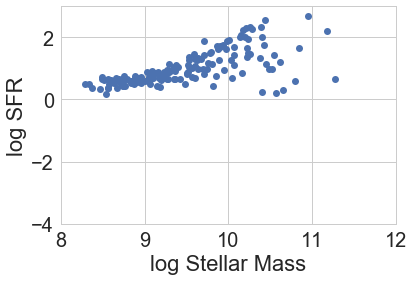

In [12]:
cigale_full_cat = cigale_full[1].data

cigale_mass_z3 = np.zeros((len(cat_z3_ids)))
cigale_mass_err_z3 = np.zeros((len(cat_z3_ids)))
cigale_mass_z3_lo = np.zeros((len(cat_z3_ids)))
cigale_mass_z3_hi = np.zeros((len(cat_z3_ids)))

cigale_sfr_z3 = np.zeros((len(cat_z3_ids)))
cigale_sfr_err_z3 = np.zeros((len(cat_z3_ids)))
cigale_sfr_z3_lo = np.zeros((len(cat_z3_ids)))
cigale_sfr_z3_hi = np.zeros((len(cat_z3_ids)))

for i in range(len(cigale_mass_z3)):
    cigale_mass_z3[i] = np.log10(cigale_full_cat[cat_z3_ids[i].astype(int)][25])
    cigale_mass_err_z3[i] = np.log10(cigale_full_cat[cat_z3_ids[i].astype(int)][26])
    cigale_mass_z3_lo[i] = np.log10(10**cigale_mass_z3[i] - 10**cigale_mass_err_z3[i])
    cigale_mass_z3_hi[i] = np.log10(10**cigale_mass_z3[i] + 10**cigale_mass_err_z3[i])
    
    cigale_sfr_z3[i] = np.log10(cigale_full_cat[cat_z3_ids[i].astype(int)][23])
    cigale_sfr_err_z3[i] = np.log10(cigale_full_cat[cat_z3_ids[i].astype(int)][24])
    cigale_sfr_z3_lo[i] = np.log10(10**cigale_sfr_z3[i] - 10**cigale_sfr_err_z3[i])
    cigale_sfr_z3_hi[i] = np.log10(10**cigale_sfr_z3[i] + 10**cigale_sfr_err_z3[i])
    
    print(cigale_full_cat[cat_z3_ids[i].astype(int)][0], cat_z3_ids[i])
    
    
plt.plot(cigale_mass_z3, cigale_sfr_z3,'o')
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

In [13]:
cigale_full.close()

# import LePhare fits

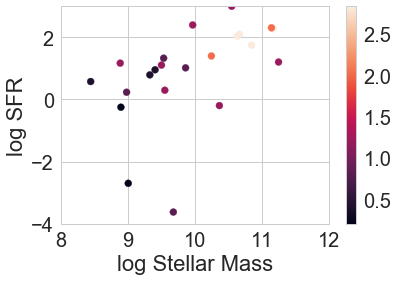

In [14]:
# header: # 
#IDENT  ZSPEC  Z_BEST  Z_ML  Z_ML68_LOW  Z_ML68_HIGH  
#EM_FLUX_OII  EM_FLUX_HB  EM_FLUX_HA  EM_EW_OII  EM_EW_HB  EM_EW_HA  
#CHI_BEST  MOD_BEST  EXTLAW_BEST  EBV_BEST  AGE_BEST  
#MASS_MED  MASS_INF  MASS_SUP  SFR_MED  SFR_INF  SFR_SUP  
#MASS_BEST  SFR_BEST  
#MAG_ABS0  MAG_ABS1  MAG_ABS2  MAG_ABS3  MAG_ABS4  MAG_ABS5  MAG_ABS6  MAG_ABS7  MAG_ABS8  MAG_ABS9  MAG_ABS10  MAG_ABS11  MAG_ABS12  MAG_ABS13  MAG_ABS14  MAG_ABS15  MAG_ABS16  MAG_ABS17  MAG_ABS18  MAG_ABS19  NBAND_USED  CONTEXT  SCALE_BEST 

lephare_cat_small = np.genfromtxt('code_outputs/candels_ucr_lephare.out')
print(lephare_cat_small.shape)

lephare_id_small = lephare_cat_small[0:,0]
lephare_zspec = lephare_cat_small[0:,1]

lephare_mass_small = lephare_cat_small[0:,17]
lephare_mass_lo_small = lephare_cat_small[0:,18]
lephare_mass_hi_small = lephare_cat_small[0:,19]

lephare_sfr_small = lephare_cat_small[0:,20]
lephare_sfr_lo_small = lephare_cat_small[0:,21]
lephare_sfr_hi_small = lephare_cat_small[0:,22]

lephare_Av_small = lephare_cat_small[0:,15]*4.05

plt.scatter(lephare_mass_small,lephare_sfr_small,c=lephare_Av_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()




# import Interrogator fits

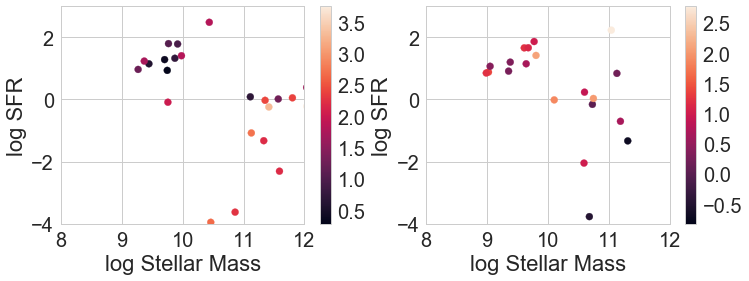

In [15]:
interrogator_cat = np.genfromtxt('code_outputs/Interrogator_BPASS.dat')
print(interrogator_cat.shape)

# ID log10M*_16 log10M*_50 log10M*_84 SFR10_16 SFR10_50 SFR10_84 SFR100_16 SFR100_50 SFR100_84 A_V_16 A_V_50 A_V_84

interrogator_id = interrogator_cat[0:,0]

interrogator_mass_lo_bpass = interrogator_cat[0:,1]
interrogator_mass_bpass = interrogator_cat[0:,2]
interrogator_mass_hi_bpass = interrogator_cat[0:,3]

interrogator_sfr_lo_bpass = interrogator_cat[0:,4]
interrogator_sfr_bpass = interrogator_cat[0:,5]
interrogator_sfr_hi_bpass = interrogator_cat[0:,6]

interrogator_Av_lo_bpass = interrogator_cat[0:,10]
interrogator_Av_bpass = interrogator_cat[0:,11]
interrogator_Av_hi_bpass = interrogator_cat[0:,12]


plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.scatter(interrogator_mass_bpass,interrogator_sfr_bpass,c=interrogator_Av_bpass)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')



interrogator_cat = np.genfromtxt('code_outputs/Interrogator_PEGASE2.dat')
print(interrogator_cat.shape)

# ID log10M*_16 log10M*_50 log10M*_84 SFR10_16 SFR10_50 SFR10_84 SFR100_16 SFR100_50 SFR100_84 A_V_16 A_V_50 A_V_84

interrogator_id = interrogator_cat[0:,0]

interrogator_mass_lo_pegase = interrogator_cat[0:,1]
interrogator_mass_pegase = interrogator_cat[0:,2]
interrogator_mass_hi_pegase = interrogator_cat[0:,3]

interrogator_sfr_lo_pegase = interrogator_cat[0:,4]
interrogator_sfr_pegase = interrogator_cat[0:,5]
interrogator_sfr_hi_pegase = interrogator_cat[0:,6]

interrogator_Av_lo_pegase = interrogator_cat[0:,10]
interrogator_Av_pegase = interrogator_cat[0:,11]
interrogator_Av_hi_pegase = interrogator_cat[0:,12]

plt.subplot(1,2,2)
plt.scatter(interrogator_mass_pegase,interrogator_sfr_pegase,c=interrogator_Av_pegase)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


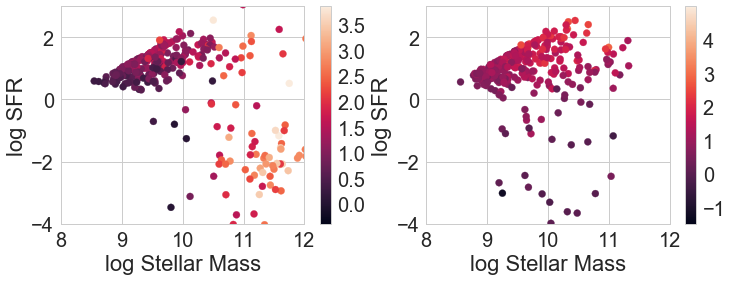

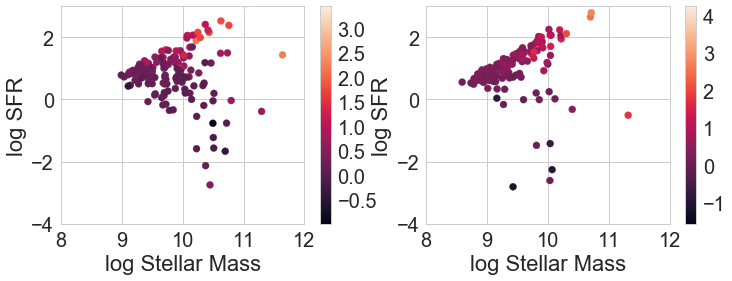

In [16]:

# Interrogator input has some issue, needs to be fixed.
#-----------------------------------------------------------------

#	ID
#BPASS_log10M*_16	BPASS_log10M*_50	BPASS_log10M*_84
#BPASS_SFR10_16	BPASS_SFR10_50	BPASS_SFR10_84
#BPASS_SFR100_16	BPASS_SFR100_50	BPASS_SFR100_84
#BPASS_A_V_16	BPASS_A_V_50	BPASS_A_V_84
#PEGASE_log10M*_16	PEGASE_log10M*_50	PEGASE_log10M*_84
#PEGASE_SFR10_16	PEGASE_SFR10_50	PEGASE_SFR10_84
#PEGASE_SFR100_16	PEGASE_SFR100_50	PEGASE_SFR100_84
#PEGASE_A_V_16	PEGASE_A_V_50	PEGASE_A_V_84

# Currently using SFR10, come back to this if it needs to be changed to SFR100

interrogator_mass_z1_lo_bpass = np.zeros_like(cat_z1_ids)*np.nan
interrogator_mass_z1_bpass = np.zeros_like(cat_z1_ids)*np.nan
interrogator_mass_z1_hi_bpass = np.zeros_like(cat_z1_ids)*np.nan

interrogator_mass_z1_lo_pegase = np.zeros_like(cat_z1_ids)*np.nan
interrogator_mass_z1_pegase = np.zeros_like(cat_z1_ids)*np.nan
interrogator_mass_z1_hi_pegase = np.zeros_like(cat_z1_ids)*np.nan

interrogator_sfr_z1_lo_bpass = np.zeros_like(cat_z1_ids)*np.nan
interrogator_sfr_z1_bpass = np.zeros_like(cat_z1_ids)*np.nan
interrogator_sfr_z1_hi_bpass = np.zeros_like(cat_z1_ids)*np.nan

interrogator_sfr_z1_lo_pegase = np.zeros_like(cat_z1_ids)*np.nan
interrogator_sfr_z1_pegase = np.zeros_like(cat_z1_ids)*np.nan
interrogator_sfr_z1_hi_pegase = np.zeros_like(cat_z1_ids)*np.nan

interrogator_Av_z1_lo_bpass = np.zeros_like(cat_z1_ids)*np.nan
interrogator_Av_z1_bpass = np.zeros_like(cat_z1_ids)*np.nan
interrogator_Av_z1_hi_bpass = np.zeros_like(cat_z1_ids)*np.nan

interrogator_Av_z1_lo_pegase = np.zeros_like(cat_z1_ids)*np.nan
interrogator_Av_z1_pegase = np.zeros_like(cat_z1_ids)*np.nan
interrogator_Av_z1_hi_pegase = np.zeros_like(cat_z1_ids)*np.nan

interrogator_z1_cat = np.genfromtxt('code_outputs/INTERROGATOR_z1_output.dat')
print(interrogator_z1_cat.shape)

interrogator_id_z1 = interrogator_z1_cat[0:,0]

print(np.sort(interrogator_id_z1)[1:10])

for i, idtemp in enumerate(cat_z1_ids):
    
    #print(np.sum(interrogator_id_z1 == (idtemp+1)))
    
    if np.sum(interrogator_id_z1 == (idtemp+1)) == 1:
        interrogator_mass_z1_lo_bpass[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),1]
        interrogator_mass_z1_bpass[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),2]
        interrogator_mass_z1_hi_bpass[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),3]

        interrogator_mass_z1_lo_pegase[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),13]
        interrogator_mass_z1_pegase[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),14]
        interrogator_mass_z1_hi_pegase[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),15]
        
        interrogator_sfr_z1_lo_bpass[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),4]
        interrogator_sfr_z1_bpass[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),5]
        interrogator_sfr_z1_hi_bpass[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),6]

        interrogator_sfr_z1_lo_pegase[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),16]
        interrogator_sfr_z1_pegase[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),17]
        interrogator_sfr_z1_hi_pegase[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),18]

        interrogator_Av_z1_lo_bpass[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),10]
        interrogator_Av_z1_bpass[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),11]
        interrogator_Av_z1_hi_bpass[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),12]

        interrogator_Av_z1_lo_pegase[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),22]
        interrogator_Av_z1_pegase[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),23]
        interrogator_Av_z1_hi_pegase[i] = interrogator_z1_cat[interrogator_id_z1 == (idtemp+1),24]

#----------------------------------------------------------------

interrogator_mass_z3_lo_bpass = np.zeros_like(cat_z3_ids)*np.nan
interrogator_mass_z3_bpass = np.zeros_like(cat_z3_ids)*np.nan
interrogator_mass_z3_hi_bpass = np.zeros_like(cat_z3_ids)*np.nan

interrogator_mass_z3_lo_pegase = np.zeros_like(cat_z3_ids)*np.nan
interrogator_mass_z3_pegase = np.zeros_like(cat_z3_ids)*np.nan
interrogator_mass_z3_hi_pegase = np.zeros_like(cat_z3_ids)*np.nan

interrogator_sfr_z3_lo_bpass = np.zeros_like(cat_z3_ids)*np.nan
interrogator_sfr_z3_bpass = np.zeros_like(cat_z3_ids)*np.nan
interrogator_sfr_z3_hi_bpass = np.zeros_like(cat_z3_ids)*np.nan

interrogator_sfr_z3_lo_pegase = np.zeros_like(cat_z3_ids)*np.nan
interrogator_sfr_z3_pegase = np.zeros_like(cat_z3_ids)*np.nan
interrogator_sfr_z3_hi_pegase = np.zeros_like(cat_z3_ids)*np.nan

interrogator_Av_z3_lo_bpass = np.zeros_like(cat_z3_ids)*np.nan
interrogator_Av_z3_bpass = np.zeros_like(cat_z3_ids)*np.nan
interrogator_Av_z3_hi_bpass = np.zeros_like(cat_z3_ids)*np.nan

interrogator_Av_z3_lo_pegase = np.zeros_like(cat_z3_ids)*np.nan
interrogator_Av_z3_pegase = np.zeros_like(cat_z3_ids)*np.nan
interrogator_Av_z3_hi_pegase = np.zeros_like(cat_z3_ids)*np.nan

interrogator_z3_cat = np.genfromtxt('code_outputs/INTERROGATOR_z3_output.dat')
print(interrogator_z3_cat.shape)

interrogator_id_z3 = interrogator_z3_cat[0:,0]

print(np.sort(interrogator_id_z3)[1:10])

for i, idtemp in enumerate(cat_z3_ids):
    
    #print(np.sum(interrogator_id_z3 == (idtemp+1)))
    
    if np.sum(interrogator_id_z3 == (idtemp+1)) == 1:
        interrogator_mass_z3_lo_bpass[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),1]
        interrogator_mass_z3_bpass[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),2]
        interrogator_mass_z3_hi_bpass[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),3]

        interrogator_mass_z3_lo_pegase[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),13]
        interrogator_mass_z3_pegase[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),14]
        interrogator_mass_z3_hi_pegase[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),15]
        
        interrogator_sfr_z3_lo_bpass[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),4]
        interrogator_sfr_z3_bpass[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),5]
        interrogator_sfr_z3_hi_bpass[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),6]

        interrogator_sfr_z3_lo_pegase[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),16]
        interrogator_sfr_z3_pegase[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),17]
        interrogator_sfr_z3_hi_pegase[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),18]

        interrogator_Av_z3_lo_bpass[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),10]
        interrogator_Av_z3_bpass[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),11]
        interrogator_Av_z3_hi_bpass[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),12]

        interrogator_Av_z3_lo_pegase[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),22]
        interrogator_Av_z3_pegase[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),23]
        interrogator_Av_z3_hi_pegase[i] = interrogator_z3_cat[interrogator_id_z3 == (idtemp+1),24]

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)

mask = (interrogator_mass_z1_pegase > -99)

plt.scatter(interrogator_mass_z1_bpass,interrogator_sfr_z1_bpass,c=interrogator_Av_z1_bpass)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')

plt.subplot(1,2,2)
plt.scatter(interrogator_mass_z1_pegase[mask],interrogator_sfr_z1_pegase[mask],c=interrogator_Av_z1_pegase[mask])
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.scatter(interrogator_mass_z3_bpass,interrogator_sfr_z3_bpass,c=interrogator_Av_z3_bpass)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')

plt.subplot(1,2,2)
plt.scatter(interrogator_mass_z3_pegase,interrogator_sfr_z3_pegase,c=interrogator_Av_z3_pegase)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()



# import SpeedyMC results

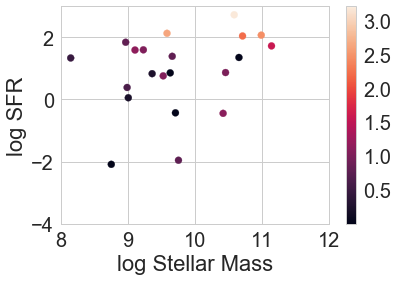

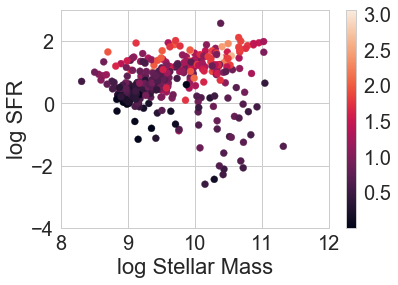

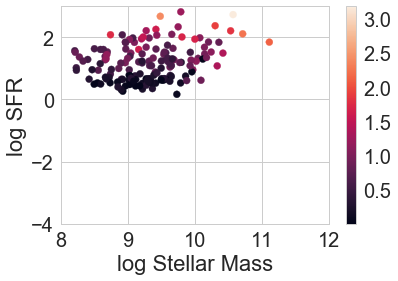

In [17]:
# new SpeedyMC results:

# Format:
#ID     
#Ln(Age/yr)    sigma(Ln(Age/yr))  
#Ln(StM/MSun)  sigma(Ln(StM/MSun))   
#EBV    sigma(EBV)    
#ln(tau)   sigma(ln(tau))    
#SFR    sigma(SFR)    BF_Chi2     Quality(1=best) 

speedy_cat = np.genfromtxt('code_outputs/SpeedyMC_CANDELS_GDSS_Cali_wSFR_Del.out')
print(speedy_cat.shape)

# SpeedyMC doesn't output SFRs, need to calculate it using the linexp SFH.

#ID     Ln(Age/yr)    sigma(Ln(Age/yr))  Ln(StM/MSun)  sigma(Ln(StM/MSun))   
#EBV    sigma(EBV)    ln(tau)   sigma(ln(tau))    BF_Chi2     Quality(1=best) 
speedy_id_small = speedy_cat[0:,0]
speedy_mass_small = np.log10(np.exp(speedy_cat[0:,3]))
speedy_mass_lo_small = np.log10(np.exp(speedy_cat[0:,3] - speedy_cat[0:,4]))
speedy_mass_hi_small = np.log10(np.exp(speedy_cat[0:,3] + speedy_cat[0:,4]))



# Should age be this quantity, or
speedy_age = cosmo.age(cat_small_z).value - np.exp(speedy_cat[0:,1])/1e9
# or 
#speedy_age = np.exp(speedy_cat[0:,1])/1e9
speedy_tau = np.exp(speedy_cat[0:,7])

#timeax = np.arange(0.01,14,0.01)

#speedy_mass_calc = np.zeros((len(speedy_id_small),))
#speedy_sfr_calc =  np.zeros((len(speedy_id_small),))
#for t_id in range(len(speedy_id_small)):
#    speedy_sfh = ((timeax - speedy_age[t_id])/speedy_tau[t_id])*np.exp(-((timeax - speedy_age[t_id])/speedy_tau[t_id]))
#    
#    mask = (speedy_sfh < 0)
#    speedy_sfh[mask] = 0
#    
#    time_index = np.argmin(np.abs(timeax - cosmo.age(cat_small_z[t_id]).value))
#    small_timeax = timeax[0:time_index]
#    small_speedy_sfh = speedy_sfh[0:time_index]
#    
#    tempmass = (np.trapz(x = small_timeax*1e9, y = small_speedy_sfh))
    
    # adding a factor of 0.6 to account for stellar vs galaxy mass. 
    # need to ask Viviana how she does this.
#    small_speedy_sfh_massnorm = small_speedy_sfh * (10**speedy_mass_small[t_id]/(tempmass*0.6))
    
#    speedy_mass_calc[t_id] = np.log10(np.trapz(x = small_timeax*1e9, y = small_speedy_sfh_massnorm))
#    speedy_sfr_calc[t_id] = np.log10(small_speedy_sfh_massnorm[-1])
    
    #plt.plot(timeax,speedy_sfh)
    #plt.title('speedy mass: '+str(speedy_mass_calc[t_id]))
    #plt.show()

#print(speedy_mass_calc)
#plt.plot(speedy_mass_calc, speedy_mass_small,'.')
#plt.title('mass comparison')
#plt.show()

#print(speedy_sfr_calc)

print(speedy_cat[0:,9])


speedy_Av_small = (speedy_cat[0:,5])*4.05
speedy_Av_lo_small = (speedy_cat[0:,5] - speedy_cat[0:,6])*4.05
speedy_Av_hi_small = (speedy_cat[0:,5] + speedy_cat[0:,6])*4.05

#speedy_sfr_small = np.zeros_like(speedy_mass_small)
#speedy_sfr_small = speedy_sfr_calc

speedy_sfr_small = np.log10((speedy_cat[0:,9]))
speedy_sfr_lo_small = np.log10((speedy_cat[0:,9] - speedy_cat[0:,10]))
speedy_sfr_hi_small = np.log10((speedy_cat[0:,9] + speedy_cat[0:,10]))


plt.scatter(speedy_mass_small,speedy_sfr_small,c=speedy_Av_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

print(speedy_cat[0:,3],speedy_cat[0:,4])



speedy_cat = np.genfromtxt('code_outputs/SpeedyMC_CANDELS_GDSS_z1_Cali_wSFR_Del.out')
print(speedy_cat.shape)

#ID     Ln(Age/yr)    sigma(Ln(Age/yr))  Ln(StM/MSun)  sigma(Ln(StM/MSun))   
#EBV    sigma(EBV)    ln(tau)   sigma(ln(tau))    BF_Chi2     Quality(1=best) 

speedy_id_z1 = speedy_cat[0:,0]
speedy_mass_z1 = np.log10(np.exp(speedy_cat[0:,3]))
speedy_mass_lo_z1 = np.log10(np.exp(speedy_cat[0:,3] - speedy_cat[0:,4]))
speedy_mass_hi_z1 = np.log10(np.exp(speedy_cat[0:,3] + speedy_cat[0:,4]))
speedy_mass_z1_masked = speedy_mass_z1[~np.isnan(speedy_mass_z1)]

speedy_Av_z1 = (speedy_cat[0:,5])*4.05
speedy_Av_lo_z1 = (speedy_cat[0:,5] - speedy_cat[0:,6])*4.05
speedy_Av_hi_z1 = (speedy_cat[0:,5] + speedy_cat[0:,6])*4.05


speedy_sfr_z1 = np.log10((speedy_cat[0:,9]))
speedy_sfr_lo_z1 = np.log10((speedy_cat[0:,9] - speedy_cat[0:,10]))
speedy_sfr_hi_z1 = np.log10((speedy_cat[0:,9] + speedy_cat[0:,10]))

print(speedy_mass_hi_z1- speedy_mass_lo_z1)

# Should age be this quantity, or
#speedy_age = cosmo.age(cat_z1_z).value - np.exp(speedy_cat[0:,1])/1e9
# or 
#speedy_age = np.exp(speedy_cat[0:,1])/1e9

#speedy_tau = np.exp(speedy_cat[0:,7])

#timeax = np.arange(0.01,14,0.01)

#speedy_mass_calc = np.zeros((len(speedy_id_z1),))
#speedy_sfr_calc =  np.zeros((len(speedy_id_z1),))
#for t_id in range(len(speedy_id_z1)):
#    speedy_sfh = ((timeax - speedy_age[t_id])/speedy_tau[t_id])*np.exp(-((timeax - speedy_age[t_id])/speedy_tau[t_id]))
#    
#    mask = (speedy_sfh < 0)
#    speedy_sfh[mask] = 0
#    
#    time_index = np.argmin(np.abs(timeax - cosmo.age(cat_z1_z[t_id]).value))
#    small_timeax = timeax[0:time_index]
#    small_speedy_sfh = speedy_sfh[0:time_index]
#    
#    tempmass = (np.trapz(x = small_timeax*1e9, y = small_speedy_sfh))
    
    # adding a factor of 0.6 to account for stellar vs galaxy mass. 
    # need to ask Viviana how she does this.
#    small_speedy_sfh_massnorm = small_speedy_sfh * (10**speedy_mass_z1[t_id]/(tempmass*0.6))
#    
#    speedy_mass_calc[t_id] = np.log10(np.trapz(x = small_timeax*1e9, y = small_speedy_sfh_massnorm))
#    speedy_sfr_calc[t_id] = np.log10(small_speedy_sfh_massnorm[-1])


#speedy_sfr_z1 = np.zeros_like(speedy_mass_z1)
#speedy_mass_small = np.log10(np.exp(speedy_cat[0:,3]))
#speedy_mass_lo_small = np.log10(np.exp(speedy_cat[0:,3] - speedy_cat[0:,4]))
#speedy_mass_hi_small = np.log10(np.exp(speedy_cat[0:,3] + speedy_cat[0:,4]))




plt.scatter(speedy_mass_z1,speedy_sfr_z1,c=speedy_Av_z1)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

# need to ask Viviana how to use uncertainties on tau, t0 to compute SFR uncertainties





speedy_cat = np.genfromtxt('code_outputs/SpeedyMC_CANDELS_GDSS_z3_Cali_wSFR_Del.out')
print(speedy_cat.shape)

#ID     Ln(Age/yr)    sigma(Ln(Age/yr))  Ln(StM/MSun)  sigma(Ln(StM/MSun))   
#EBV    sigma(EBV)    ln(tau)   sigma(ln(tau))    BF_Chi2     Quality(1=best) 

speedy_id_z3 = speedy_cat[0:,0]
speedy_mass_z3 = np.log10(np.exp(speedy_cat[0:,3]))
speedy_mass_lo_z3 = np.log10(np.exp(speedy_cat[0:,3]) - np.exp(speedy_cat[0:,4]))
speedy_mass_hi_z3 = np.log10(np.exp(speedy_cat[0:,3]) + np.exp(speedy_cat[0:,4]))
speedy_mass_z3_masked = speedy_mass_z3[~np.isnan(speedy_mass_z3)]

speedy_Av_z3 = (speedy_cat[0:,5])*4.05
speedy_Av_lo_z3 = (speedy_cat[0:,5] - speedy_cat[0:,6])*4.05
speedy_Av_hi_z3 = (speedy_cat[0:,5] + speedy_cat[0:,6])*4.05


speedy_sfr_z3 = np.log10((speedy_cat[0:,9]))
speedy_sfr_lo_z3 = np.log10((speedy_cat[0:,9] - speedy_cat[0:,10]))
speedy_sfr_hi_z3 = np.log10((speedy_cat[0:,9] + speedy_cat[0:,10]))



plt.scatter(speedy_mass_z3,speedy_sfr_z3,c=speedy_Av_z3)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

# import EAZY results

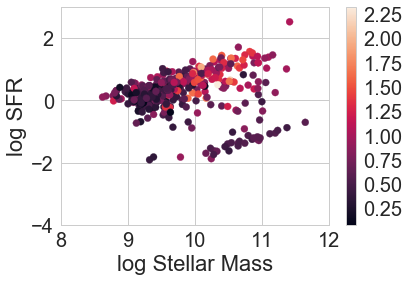

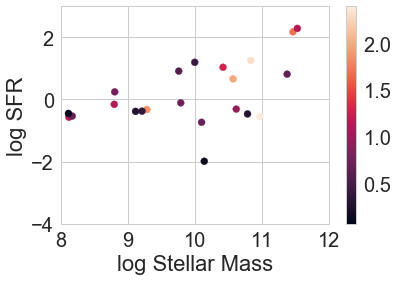

In [18]:
from astropy.io import fits
fits_image_filename = 'code_outputs/CANDELS_GDSS_workshop_z1.eazypy.zout.fits'
hdul = fits.open(fits_image_filename)
hdul.info()
#print(hdul[1].header)

#hdul[1].header[0:]

#hdul.close()

temp = np.array(hdul[1].data)
print(temp.shape)

eazy_id_z1 = np.zeros((len(temp)))
eazy_zphot_z1 = np.zeros((len(temp)))
eazy_mass_z1 = np.zeros((len(temp)))
eazy_sfr_z1 = np.zeros((len(temp)))
eazy_Av_z1 = np.zeros((len(temp)))
for i in range(len(temp)):
    eazy_id_z1[i] = temp[i][1]
    eazy_zphot_z1[i] = temp[i][4]
    eazy_mass_z1[i] = np.log10(temp[i][27])
    eazy_sfr_z1[i] = np.log10(temp[i][28])
    eazy_Av_z1[i] = (temp[i][26])
 
plt.scatter(eazy_mass_z1,eazy_sfr_z1,c=eazy_Av_z1)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


#print(hdul[1].header[0:])

hdul.close()

#plt.hist(eazy_mass)
#plt.show()



#---------------------------outlier catalog--------------------

fits_image_filename = 'code_outputs/CANDELS_GDSS_workshop.eazypy.zout.fits'
hdul = fits.open(fits_image_filename)
#hdul.info()
#print(hdul[1].header)

#hdul[1].header[0:]



#hdul.close()

temp = np.array(hdul[1].data)
#print(temp.shape)

eazy_id_small = np.zeros((len(temp)))
eazy_zphot_small = np.zeros((len(temp)))
eazy_mass_small = np.zeros((len(temp)))
eazy_sfr_small = np.zeros((len(temp)))
eazy_Av_small = np.zeros((len(temp)))
for i in range(len(temp)):
    eazy_id_small[i] = temp[i][0]
    eazy_zphot_small[i] = temp[i][4]
    eazy_mass_small[i] = np.log10(temp[i][27])
    eazy_sfr_small[i] = np.log10(temp[i][28])
    eazy_Av_small[i] = (temp[i][26])
 
plt.scatter(eazy_mass_small,eazy_sfr_small,c=eazy_Av_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

hdul[1].header[0:]
hdul.close()




# import MAGPHYS fits

- these provide SFR100 by default

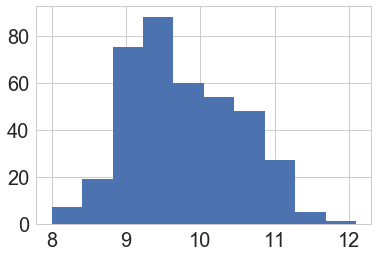

In [20]:
magphys_cat = np.genfromtxt('code_outputs/magphys_output.dat')
print(magphys_cat.shape)

# ID_0    
#tau_v16_0   tau_v50_0   tau_v84_0   - 3
#sSFR16_0   sSFR50_0   sSFR84_0    -6
#Mstar16_0   Mstar50_0   Mstar84_0    -9
#Ldust16_0   Ldust50_0   Ldust84_0    -12
#Mdust16_0   Mdust50_0   Mdust84_0    -15
#SFR16_0   SFR50_0   SFR84_0    -18
#age_M16_0   age_M50_0   age_M84_0  -21  
#A_V16_0   A_V50_0   A_V84_0    -24
#Tdust16_0   Tdust50_0   Tdust84_0  -27  
#tau_v16_agn   tau_v50_agn   tau_v84_agn    -30
#sSFR16_agn   sSFR50_agn   sSFR84_agn    - 33
#Mstar16_agn   Mstar50_agn   Mstar84_agn    -36
#Ldust16_agn   Ldust50_agn   Ldust84_agn    - 39
#Mdust16_agn   Mdust50_agn   Mdust84_agn    - 42
#SFR16_agn   SFR50_agn   SFR84_agn    - 45
#age_M16_agn   age_M50_agn   age_M84_agn   - 48
#A_V16_agn   A_V50_agn   A_V84_agn    - 51
#Tdust16_agn   Tdust50_agn   Tdust84_agn   - 54 
#agnf16_agn   agnf50_agn   agnf84_agn    - 57
#Ldustsf16_agn   Ldustsf50_agn   Ldustsf84_agn    -60
#Ldustagn16_agn   Ldustagn50_agn   Ldustagn84_agn  

magphys_id_full = magphys_cat[0:,0]

magphys_mass_full = magphys_cat[0:,8]
magphys_mass_full_low = magphys_cat[0:,7]
magphys_mass_full_high = magphys_cat[0:,9]

magphys_sfr_full = magphys_cat[0:,16]
magphys_sfr_full_low = magphys_cat[0:,17]
magphys_sfr_full_high = magphys_cat[0:,18]

magphys_Av_full = magphys_cat[0:,23]
magphys_Av_full_low = magphys_cat[0:,22]
magphys_Av_full_high = magphys_cat[0:,24]

magphys_mass_full_wagn = magphys_cat[0:,35]
magphys_mass_full_low_wagn = magphys_cat[0:,34]
magphys_mass_full_high_wagn = magphys_cat[0:,36]

magphys_sfr_full_wagn = magphys_cat[0:,44]
magphys_sfr_full_low_wagn = magphys_cat[0:,43]
magphys_sfr_full_high_wagn = magphys_cat[0:,45]

magphys_Av_full_wagn = magphys_cat[0:,50]
magphys_Av_full_low_wagn = magphys_cat[0:,49]
magphys_Av_full_high_wagn = magphys_cat[0:,51]



magphys_ids_small = np.zeros((len(cat_small_ids),))

magphys_mass_small = np.zeros((len(cat_small_ids),))
magphys_mass_lo_small = np.zeros((len(cat_small_ids),))
magphys_mass_hi_small = np.zeros((len(cat_small_ids),))

magphys_sfr_small = np.zeros((len(cat_small_ids),))
magphys_sfr_lo_small = np.zeros((len(cat_small_ids),))
magphys_sfr_hi_small = np.zeros((len(cat_small_ids),))

magphys_Av_small = np.zeros((len(cat_small_ids),))
magphys_Av_lo_small = np.zeros((len(cat_small_ids),))
magphys_Av_hi_small = np.zeros((len(cat_small_ids),))

for i in range(len(cat_small_ids)):
    #print(magphys_id_full[magphys_id_full == (cat_small_ids[i]+1)])
    #magphys_ids_small[i] = np.sum([magphys_id_full == cat_small_ids[i]+1])
    magphys_ids_small[i] = magphys_id_full[magphys_id_full == cat_small_ids[i]+1]
    
    magphys_mass_small[i] = magphys_mass_full[magphys_id_full == cat_small_ids[i]+1]
    magphys_mass_lo_small[i] = magphys_mass_full_low[magphys_id_full == cat_small_ids[i]+1]
    magphys_mass_hi_small[i] = magphys_mass_full_high[magphys_id_full == cat_small_ids[i]+1]
    
    magphys_sfr_small[i] = magphys_sfr_full[magphys_id_full == cat_small_ids[i]+1]
    magphys_sfr_lo_small[i] = magphys_sfr_full_low[magphys_id_full == cat_small_ids[i]+1]
    magphys_sfr_hi_small[i] = magphys_sfr_full_high[magphys_id_full == cat_small_ids[i]+1]
    
    magphys_Av_small[i] = magphys_Av_full[magphys_id_full == cat_small_ids[i]+1]
    magphys_Av_lo_small[i] = magphys_Av_full_low[magphys_id_full == cat_small_ids[i]+1]
    magphys_Av_hi_small[i] = magphys_Av_full_high[magphys_id_full == cat_small_ids[i]+1]
    

magphys_ids_z1 = np.zeros((len(cat_z1_ids),))

magphys_mass_z1 = np.zeros((len(cat_z1_ids),))
magphys_mass_lo_z1 = np.zeros((len(cat_z1_ids),))
magphys_mass_hi_z1 = np.zeros((len(cat_z1_ids),))

magphys_sfr_z1 = np.zeros((len(cat_z1_ids),))
magphys_sfr_lo_z1 = np.zeros((len(cat_z1_ids),))
magphys_sfr_hi_z1 = np.zeros((len(cat_z1_ids),))

magphys_Av_z1 = np.zeros((len(cat_z1_ids),))
magphys_Av_lo_z1 = np.zeros((len(cat_z1_ids),))
magphys_Av_hi_z1 = np.zeros((len(cat_z1_ids),))


magphys_mass_z1_wagn = np.zeros((len(cat_z1_ids),))
magphys_mass_lo_z1_wagn = np.zeros((len(cat_z1_ids),))
magphys_mass_hi_z1_wagn = np.zeros((len(cat_z1_ids),))

magphys_sfr_z1_wagn = np.zeros((len(cat_z1_ids),))
magphys_sfr_lo_z1_wagn = np.zeros((len(cat_z1_ids),))
magphys_sfr_hi_z1_wagn = np.zeros((len(cat_z1_ids),))

magphys_Av_z1_wagn = np.zeros((len(cat_z1_ids),))
magphys_Av_lo_z1_wagn = np.zeros((len(cat_z1_ids),))
magphys_Av_hi_z1_wagn = np.zeros((len(cat_z1_ids),))

for i in range(len(cat_z1_ids)):
    #print(len(magphys_id_full[magphys_id_full == candels_z1_ids[i]+1]))
    if len(magphys_id_full[magphys_id_full == cat_z1_ids[i]+1]) == 1:
        magphys_ids_z1[i] = magphys_id_full[magphys_id_full == cat_z1_ids[i]+1]
        
        magphys_mass_z1[i] = magphys_mass_full[magphys_id_full == cat_z1_ids[i]+1]
        magphys_mass_lo_z1[i] = magphys_mass_full_low[magphys_id_full == cat_z1_ids[i]+1]
        magphys_mass_hi_z1[i] = magphys_mass_full_high[magphys_id_full == cat_z1_ids[i]+1]
        
        magphys_sfr_z1[i] = magphys_sfr_full[magphys_id_full == cat_z1_ids[i]+1]
        magphys_sfr_lo_z1[i] = magphys_sfr_full_low[magphys_id_full == cat_z1_ids[i]+1]
        magphys_sfr_hi_z1[i] = magphys_sfr_full_high[magphys_id_full == cat_z1_ids[i]+1]
        
        magphys_Av_z1[i] = magphys_Av_full[magphys_id_full == cat_z1_ids[i]+1]
        magphys_Av_lo_z1[i] = magphys_Av_full_low[magphys_id_full == cat_z1_ids[i]+1]
        magphys_Av_hi_z1[i] = magphys_Av_full_high[magphys_id_full == cat_z1_ids[i]+1]
        
        magphys_mass_z1_wagn[i] = magphys_mass_full_wagn[magphys_id_full == cat_z1_ids[i]+1]
        magphys_mass_lo_z1_wagn[i] = magphys_mass_full_low_wagn[magphys_id_full == cat_z1_ids[i]+1]
        magphys_mass_hi_z1_wagn[i] = magphys_mass_full_high_wagn[magphys_id_full == cat_z1_ids[i]+1]
        
        magphys_sfr_z1_wagn[i] = magphys_sfr_full_wagn[magphys_id_full == cat_z1_ids[i]+1]
        magphys_sfr_lo_z1_wagn[i] = magphys_sfr_full_low_wagn[magphys_id_full == cat_z1_ids[i]+1]
        magphys_sfr_hi_z1_wagn[i] = magphys_sfr_full_high_wagn[magphys_id_full == cat_z1_ids[i]+1]
        
        magphys_Av_z1_wagn[i] = magphys_Av_full_wagn[magphys_id_full == cat_z1_ids[i]+1]
        magphys_Av_lo_z1_wagn[i] = magphys_Av_full_low_wagn[magphys_id_full == cat_z1_ids[i]+1]
        magphys_Av_hi_z1_wagn[i] = magphys_Av_full_high_wagn[magphys_id_full == cat_z1_ids[i]+1]
    else:
        print('id:'+str(cat_z1_ids[i])+' not found. mass set to NaN')
        magphys_mass_z1[i] = np.nan
        magphys_sfr_z1[i] = np.nan
        magphys_mass_z1_wagn[i] = np.nan
        magphys_sfr_z1_wagn[i] = np.nan

print(np.sum(magphys_ids_small))
print(np.sum(magphys_ids_z1))

plt.hist(magphys_mass_full)
plt.show()

In [21]:
magphys_z3 = fits.open('code_outputs/MAGPHYS_output_z3.fits')
magphys_z3.info()
magphys_z3[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / 8-bit bytes                                    
NAXIS   =                    2 / 2-dimensional table                            
NAXIS1  =                 1166 / width of table in bytes                        
NAXIS2  =                  161 / number of rows in table                        
PCOUNT  =                    0 / size of special data area                      
GCOUNT  =                    1 / one data group                                 
TFIELDS =                  293 / number of columns                              
EXTNAME = 'Joined  '           / table name                                     
TTYPE1  = 'ID_0    '           / label for column 1                             
TFORM1  = 'I       '           / format for column 1                            
TTYPE2  = 'CTIO_U_0'           / label for column 2                             
TFORM2  = 'E       '        

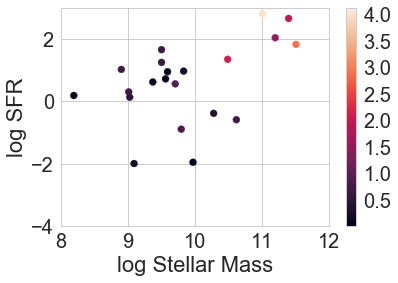

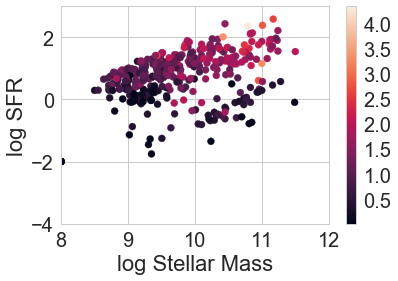

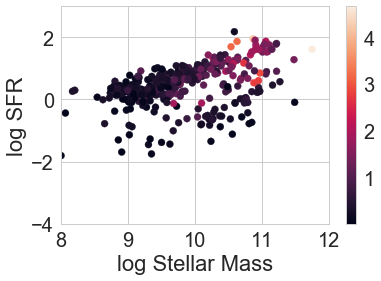

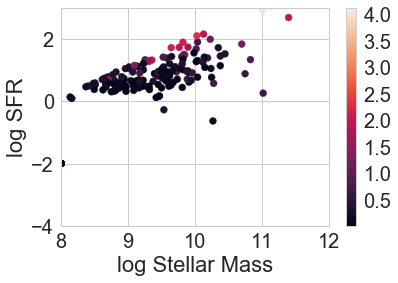

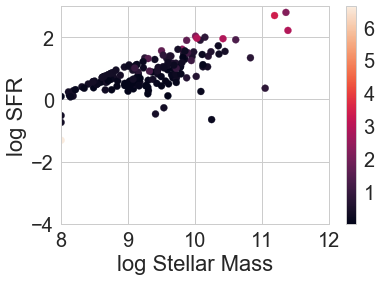

In [22]:
magphys_z3_data = magphys_z3[1].data

magphys_ids_z3 = np.zeros((len(cat_z3_ids),))

magphys_mass_z3 = np.zeros((len(cat_z3_ids),))
magphys_mass_lo_z3 = np.zeros((len(cat_z3_ids),))
magphys_mass_hi_z3 = np.zeros((len(cat_z3_ids),))

magphys_sfr_z3 = np.zeros((len(cat_z3_ids),))
magphys_sfr_lo_z3 = np.zeros((len(cat_z3_ids),))
magphys_sfr_hi_z3 = np.zeros((len(cat_z3_ids),))

magphys_Av_z3 = np.zeros((len(cat_z3_ids),))
magphys_Av_lo_z3 = np.zeros((len(cat_z3_ids),))
magphys_Av_hi_z3 = np.zeros((len(cat_z3_ids),))

magphys_mass_z3_wagn = np.zeros((len(cat_z3_ids),))
magphys_mass_lo_z3_wagn = np.zeros((len(cat_z3_ids),))
magphys_mass_hi_z3_wagn = np.zeros((len(cat_z3_ids),))

magphys_sfr_z3_wagn = np.zeros((len(cat_z3_ids),))
magphys_sfr_lo_z3_wagn = np.zeros((len(cat_z3_ids),))
magphys_sfr_hi_z3_wagn = np.zeros((len(cat_z3_ids),))

magphys_Av_z3_wagn = np.zeros((len(cat_z3_ids),))
magphys_Av_lo_z3_wagn = np.zeros((len(cat_z3_ids),))
magphys_Av_hi_z3_wagn = np.zeros((len(cat_z3_ids),))

for i in range(len(magphys_z3_data)):
    
    magphys_ids_z3[i] = magphys_z3_data[i][0]
    
    magphys_mass_z3_wagn[i] = magphys_z3_data[i][235]
    magphys_mass_lo_z3_wagn[i] = magphys_z3_data[i][234]
    magphys_mass_hi_z3_wagn[i] = magphys_z3_data[i][236]

    magphys_sfr_z3_wagn[i] = magphys_z3_data[i][250]
    magphys_sfr_lo_z3_wagn[i] = magphys_z3_data[i][249]
    magphys_sfr_hi_z3_wagn[i] = magphys_z3_data[i][251]

    magphys_Av_z3_wagn[i] = magphys_z3_data[i][270]
    magphys_Av_lo_z3_wagn[i] = magphys_z3_data[i][269]
    magphys_Av_hi_z3_wagn[i] = magphys_z3_data[i][271]
    
    #-----------------------------
    
    magphys_mass_z3[i] = magphys_z3_data[i][94]
    magphys_mass_lo_z3[i] = magphys_z3_data[i][93]
    magphys_mass_hi_z3[i] = magphys_z3_data[i][95]

    magphys_sfr_z3[i] = magphys_z3_data[i][109]
    magphys_sfr_lo_z3[i] = magphys_z3_data[i][108]
    magphys_sfr_hi_z3[i] = magphys_z3_data[i][110]

    magphys_Av_z3[i] = magphys_z3_data[i][129]
    magphys_Av_lo_z3[i] = magphys_z3_data[i][128]
    magphys_Av_hi_z3[i] = magphys_z3_data[i][130]

    
#plt.plot(magphys_ids_z3, cat_z3_ids,'.')
#plt.show()

plt.scatter(magphys_mass_small,magphys_sfr_small,c=magphys_Av_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(magphys_mass_z1,magphys_sfr_z1, c=magphys_Av_z1)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(magphys_mass_z1_wagn,magphys_sfr_z1_wagn, c=magphys_Av_z1_wagn)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

plt.scatter(magphys_mass_z3,magphys_sfr_z3, c=magphys_Av_z3)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(magphys_mass_z3_wagn,magphys_sfr_z3_wagn, c=magphys_Av_z3_wagn)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

In [23]:
magphys_z3.close()

In [24]:
magphys_z1 = fits.open('code_outputs/MAGPHYS_output.fits')
magphys_z1.info()
magphys_z1[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / 8-bit bytes                                    
NAXIS   =                    2 / 2-dimensional table                            
NAXIS1  =                 1166 / width of table in bytes                        
NAXIS2  =                  384 / number of rows in table                        
PCOUNT  =                    0 / size of special data area                      
GCOUNT  =                    1 / one data group                                 
TFIELDS =                  293 / number of columns                              
EXTNAME = 'Joined  '           / table name                                     
TTYPE1  = 'ID_0    '           / label for column 1                             
TFORM1  = 'I       '           / format for column 1                            
TTYPE2  = 'CTIO_U_0'           / label for column 2                             
TFORM2  = 'E       '        

In [26]:
# magphys_tempids = np.zeros((len(magphys_z1_data),))
# for i in range(len(magphys_z1_data)):
#     magphys_tempids[i] = magphys_z1_data[i][0]

# print(cat_z1_ids[1:100])
# print(magphys_tempids[1:100]-1)

# # example of the mismatch between Magphys IDs and catalog...
magphys_z1.close()

# import Beagle fits

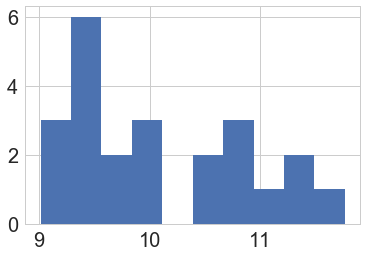

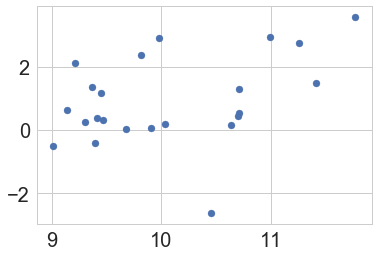

In [27]:
# need to add dust from beagle_dust_attenuation_format.dat

beagle_cat = np.genfromtxt('code_outputs/beagle_galaxy_properties_format.dat')
print(beagle_cat.shape)

#ID     
#M_tot_mean     M_tot_median   M_tot_16	M_tot_84	      M_tot_3     M_tot_97		      
#M_star_mean    M_star_median  M_star_16	M_star_84	     M_star_3	M_star_97	      
#mass_w_age_mean   mass_w_age_median   mass_w_age_16    mass_w_age_84		   mass_w_age_3	    mass_w_age_97	  
#mass_w_Z_mean   mass_w_Z_median   mass_w_Z_16	    mass_w_Z_84	   mass_w_Z_3   mass_w_Z_97		  
#N_ion_mean   N_ion_median   N_ion_16    N_ion_84	       N_ion_3    N_ion_97	        
#xi_ion_mean   xi_ion_median   xi_ion_16	    xi_ion_84       xi_ion_3     xi_ion_97	        
#xi_ion_unatt_mean   xi_ion_unatt_median   xi_ion_unatt_16     xi_ion_unatt_84	   xi_ion_unatt_3     xi_ion_unatt_97	    
#xi_ion_unatt_stellar_mean   xi_ion_unatt_stellar_median   xi_ion_unatt_stellar_16     xi_ion_unatt_stellar_84   xi_ion_unatt_stellar_3     xi_ion_unatt_stellar_97   
#UV_slope_mean   UV_slope_median   UV_slope_16    UV_slope_84	       UV_slope_3    UV_slope_97		  

beagle_cat_sf = np.genfromtxt('code_outputs/beagle_star_formation_format.dat')

# ID      
#sSFR_mean    sSFR_median   sSFR_16  sSFR_84               sSFR_3   sSFR_97                
#SFR_10_mean    SFR_10_median   SFR_10_16   SFR_10_84                SFR_10_3   SFR_10_97                
#SFR_100_mean   SFR_100_median   SFR_100_16    SFR_100_84              SFR_100_3      SFR_100_97           
#max_stellar_age_mean   max_stellar_age_median   max_stellar_age_16  max_stellar_age_84        max_stellar_age_3  max_stellar_age_97       

beagle_ID = beagle_cat[0:,0]
beagle_mass_small = np.log10(beagle_cat[0:,8])
beagle_mass_lo_small = np.log10(beagle_cat[0:,9])
beagle_mass_hi_small = np.log10(beagle_cat[0:,10])


beagle_sfr_small = np.log10(beagle_cat_sf[0:,7])
beagle_sfr_lo_small = np.log10(beagle_cat_sf[0:,8])
beagle_sfr_hi_small = np.log10(beagle_cat_sf[0:,9])

plt.hist(beagle_mass_small)
plt.show()

plt.scatter(beagle_mass_small,beagle_sfr_small)
plt.show()


# the beagle output isn't sorted by galaxy ID, so I'm doing this to fix it

beagle_mass_small_sorted = [beagle_mass_small for (beagle_ID,beagle_mass_small) in sorted(zip(beagle_ID,beagle_mass_small), key=lambda pair: pair[0])]
beagle_mass_lo_small_sorted = [beagle_mass_lo_small for (beagle_ID,beagle_mass_lo_small) in sorted(zip(beagle_ID,beagle_mass_lo_small), key=lambda pair: pair[0])]
beagle_mass_hi_small_sorted = [beagle_mass_hi_small for (beagle_ID,beagle_mass_hi_small) in sorted(zip(beagle_ID,beagle_mass_hi_small), key=lambda pair: pair[0])]

beagle_sfr_small_sorted = [beagle_sfr_small for (beagle_ID,beagle_sfr_small) in sorted(zip(beagle_ID,beagle_sfr_small), key=lambda pair: pair[0])]
beagle_sfr_lo_small_sorted = [beagle_sfr_lo_small for (beagle_ID,beagle_sfr_lo_small) in sorted(zip(beagle_ID,beagle_sfr_lo_small), key=lambda pair: pair[0])]
beagle_sfr_hi_small_sorted = [beagle_sfr_hi_small for (beagle_ID,beagle_sfr_hi_small) in sorted(zip(beagle_ID,beagle_sfr_hi_small), key=lambda pair: pair[0])]



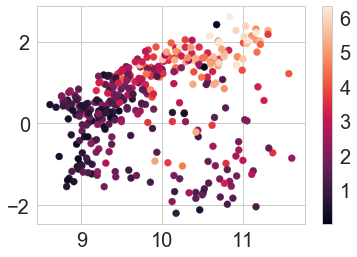

In [30]:
beagle_z1_cat = fits.open('code_outputs/BEAGLE_summary_catalogue_z1.fits')
print(beagle_z1_cat.info())

galprop = beagle_z1_cat[1]
sf = beagle_z1_cat[2]
dust = beagle_z1_cat[3]

#print(dust.header)

beagle_ids = galprop.data['ID      ']
beagle_ids_int = [int(beagle_ids[i]) for i in range(len(beagle_ids))]

mstar = np.log10(galprop.data['M_star_median'])
mstar_68 = np.log10(galprop.data['M_star_68.00'])

sfr = np.log10(sf.data['SFR_100_median'])
sfr_68 = np.log10(sf.data['SFR_100_68.00'])

A1500 = dust.data['A1500_median']
A1500_68 = dust.data['A1500_68.00']

beagle_z1_cat.close()

beagle_mass_z1 = np.zeros_like(cat_z1_ids)*np.nan
beagle_mass_lo_z1 = np.zeros_like(cat_z1_ids)*np.nan
beagle_mass_hi_z1 = np.zeros_like(cat_z1_ids)*np.nan

beagle_sfr_z1 = np.zeros_like(cat_z1_ids)*np.nan
beagle_sfr_lo_z1 = np.zeros_like(cat_z1_ids)*np.nan
beagle_sfr_hi_z1 = np.zeros_like(cat_z1_ids)*np.nan

beagle_Av_z1 = np.zeros_like(cat_z1_ids)*np.nan
beagle_Av_lo_z1 = np.zeros_like(cat_z1_ids)*np.nan
beagle_Av_hi_z1 = np.zeros_like(cat_z1_ids)*np.nan

for i in range(len(cat_z1_ids)):
    
    if np.sum(beagle_ids_int == cat_z1_ids[i]+1) == 1:
        
        beagle_mass_z1[i] = mstar[beagle_ids_int == cat_z1_ids[i]+1]
        
        beagle_mass_lo_z1[i] = mstar_68[beagle_ids_int == cat_z1_ids[i]+1, 0]
        beagle_mass_hi_z1[i] = mstar_68[beagle_ids_int == cat_z1_ids[i]+1, 1]
        
        beagle_sfr_z1[i] = sfr[beagle_ids_int == cat_z1_ids[i]+1]
        beagle_sfr_lo_z1[i] = sfr_68[beagle_ids_int == cat_z1_ids[i]+1, 0]
        beagle_sfr_hi_z1[i] = sfr_68[beagle_ids_int == cat_z1_ids[i]+1, 1]
        
        # currently putting these values in as a placeholder, need to use the correct conversion
        
        beagle_Av_z1[i] = A1500[beagle_ids_int == cat_z1_ids[i]+1]
        beagle_Av_lo_z1[i] = A1500_68[beagle_ids_int == cat_z1_ids[i]+1, 0]
        beagle_Av_hi_z1[i] = A1500_68[beagle_ids_int == cat_z1_ids[i]+1, 1]

plt.scatter(beagle_mass_z1, beagle_sfr_z1, c = beagle_Av_z1)
plt.colorbar()
plt.show()

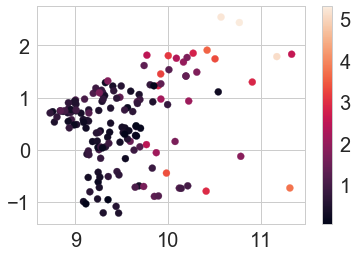

In [31]:
beagle_z3_cat = fits.open('code_outputs/BEAGLE_summary_catalogue_z3.fits')
print(beagle_z3_cat.info())

galprop = beagle_z3_cat[1]
sf = beagle_z3_cat[2]
dust = beagle_z3_cat[3]

#print(dust.header)

beagle_ids = galprop.data['ID      ']
beagle_ids_int = [int(beagle_ids[i]) for i in range(len(beagle_ids))]
print(beagle_ids.shape)

mstar = np.log10(galprop.data['M_star_median'])
mstar_68 = np.log10(galprop.data['M_star_68.00'])

sfr = np.log10(sf.data['SFR_100_median'])
sfr_68 = np.log10(sf.data['SFR_100_68.00'])

A1500 = dust.data['A1500_median']
A1500_68 = dust.data['A1500_68.00']

beagle_z3_cat.close()

beagle_mass_z3 = np.zeros_like(cat_z3_ids)*np.nan
beagle_mass_lo_z3 = np.zeros_like(cat_z3_ids)*np.nan
beagle_mass_hi_z3 = np.zeros_like(cat_z3_ids)*np.nan

beagle_sfr_z3 = np.zeros_like(cat_z3_ids)*np.nan
beagle_sfr_lo_z3 = np.zeros_like(cat_z3_ids)*np.nan
beagle_sfr_hi_z3 = np.zeros_like(cat_z3_ids)*np.nan

beagle_Av_z3 = np.zeros_like(cat_z3_ids)*np.nan
beagle_Av_lo_z3 = np.zeros_like(cat_z3_ids)*np.nan
beagle_Av_hi_z3 = np.zeros_like(cat_z3_ids)*np.nan

for i in range(len(cat_z3_ids)):
    
    if np.sum(beagle_ids_int == cat_z3_ids[i]+1) == 1:
        
        beagle_mass_z3[i] = mstar[beagle_ids_int == cat_z3_ids[i]+1]
        
        beagle_mass_lo_z3[i] = mstar_68[beagle_ids_int == cat_z3_ids[i]+1, 0]
        beagle_mass_hi_z3[i] = mstar_68[beagle_ids_int == cat_z3_ids[i]+1, 1]
        
        beagle_sfr_z3[i] = sfr[beagle_ids_int == cat_z3_ids[i]+1]
        beagle_sfr_lo_z3[i] = sfr_68[beagle_ids_int == cat_z3_ids[i]+1, 0]
        beagle_sfr_hi_z3[i] = sfr_68[beagle_ids_int == cat_z3_ids[i]+1, 1]
        
        # currently putting these values in as a placeholder, need to use the correct conversion
        
        beagle_Av_z3[i] = A1500[beagle_ids_int == cat_z3_ids[i]+1]
        beagle_Av_lo_z3[i] = A1500_68[beagle_ids_int == cat_z3_ids[i]+1, 0]
        beagle_Av_hi_z3[i] = A1500_68[beagle_ids_int == cat_z3_ids[i]+1, 1]

plt.scatter(beagle_mass_z3, beagle_sfr_z3, c = beagle_Av_z3)
plt.colorbar()
plt.show()

# import SED3FIT outputs

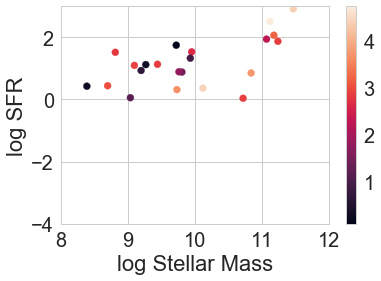

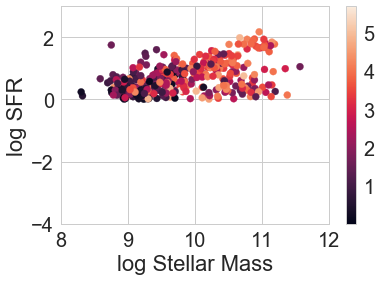

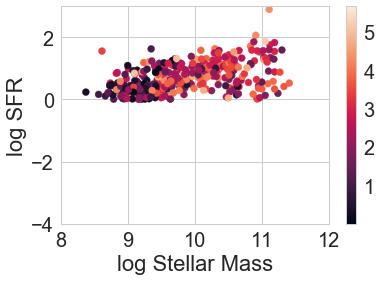

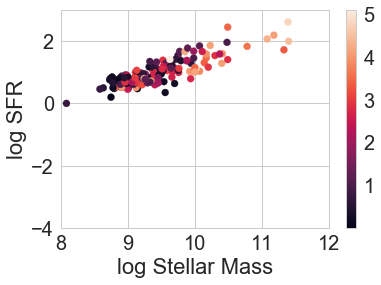

In [32]:
# Check with Kevin to see if the SFR output is in units of solar masses/yr or log solar masses/yr

sed3fit_small_cat = np.genfromtxt('code_outputs/RIVERSIDE_SMALL_SED3FIT_RESULTS_6_25.dat')

# ID_0    tau_v16_0   tau_v50_0   tau_v84_0  Mstar16_0   Mstar50_0   Mstar84_0   SFR16_0   SFR50_0   SFR84_0 

# new headers
# ID    tau_v16   tau_v50   tau_v84   
#age_mw16   age_mw50   age_mw84   
#Mstar16   Mstar50   Mstar84   
#SFR16_7   SFR50_7   SFR84_7   
#SFR16_8   SFR50_8   SFR84_8 

sed3fit_id_small = sed3fit_small_cat[0:,0]

sed3fit_mass_small = sed3fit_small_cat[0:,8]
sed3fit_mass_small_low = sed3fit_small_cat[0:,7]
sed3fit_mass_small_high = sed3fit_small_cat[0:,9]

sed3fit_sfr_small = (sed3fit_small_cat[0:,14])
sed3fit_sfr_small_low = (sed3fit_small_cat[0:,13])
sed3fit_sfr_small_high = (sed3fit_small_cat[0:,15])

sed3fit_tauv_small = sed3fit_small_cat[0:,3]
sed3fit_tauv_small_low = sed3fit_small_cat[0:,1]
sed3fit_tauv_small_high = sed3fit_small_cat[0:,2]

#----------------------------

sed3fit_z1_cat = np.genfromtxt('code_outputs/RIVERSIDE_z1_SED3FIT_RESULTS_6_25.dat')

# ID_0    tau_v16_0   tau_v50_0   tau_v84_0  Mstar16_0   Mstar50_0   Mstar84_0   SFR16_0   SFR50_0   SFR84_0 

sed3fit_id_z1 = sed3fit_z1_cat[0:,0]

sed3fit_mass_z1 = sed3fit_z1_cat[0:,8]
sed3fit_mass_z1_low = sed3fit_z1_cat[0:,7]
sed3fit_mass_z1_high = sed3fit_z1_cat[0:,9]

sed3fit_sfr_z1 = (sed3fit_z1_cat[0:,14])
sed3fit_sfr_z1_low = (sed3fit_z1_cat[0:,13])
sed3fit_sfr_z1_high = (sed3fit_z1_cat[0:,15])

sed3fit_tauv_z1 = sed3fit_z1_cat[0:,3]
sed3fit_tauv_z1_low = sed3fit_z1_cat[0:,1]
sed3fit_tauv_z1_high = sed3fit_z1_cat[0:,2]

#----------------------------

sed3fit_z3_cat = np.genfromtxt('code_outputs/RIVERSIDE_z3_SED3FIT_RESULTS_6_25.dat')

# ID_0    tau_v16_0   tau_v50_0   tau_v84_0  Mstar16_0   Mstar50_0   Mstar84_0   SFR16_0   SFR50_0   SFR84_0 

sed3fit_id_z3 = sed3fit_z3_cat[0:,0]

sed3fit_mass_z3 = sed3fit_z3_cat[0:,8]
sed3fit_mass_z3_low = sed3fit_z3_cat[0:,7]
sed3fit_mass_z3_high = sed3fit_z3_cat[0:,9]

sed3fit_sfr_z3 = (sed3fit_z3_cat[0:,14])
sed3fit_sfr_z3_low = (sed3fit_z3_cat[0:,13])
sed3fit_sfr_z3_high =(sed3fit_z3_cat[0:,15])

sed3fit_tauv_z3 = sed3fit_z3_cat[0:,3]
sed3fit_tauv_z3_low = sed3fit_z3_cat[0:,1]
sed3fit_tauv_z3_high = sed3fit_z3_cat[0:,2]

#----------------------------

sed3fit_z1_IR_cat = np.genfromtxt('code_outputs/RIVERSIDE_z1_IR_SED3FIT_RESULTS_6_25.dat')

# ID_0    tau_v16_0   tau_v50_0   tau_v84_0  Mstar16_0   Mstar50_0   Mstar84_0   SFR16_0   SFR50_0   SFR84_0 

sed3fit_id_z1_IR = sed3fit_z1_IR_cat[0:,0]

sed3fit_mass_z1_IR = sed3fit_z1_IR_cat[0:,8]
sed3fit_mass_z1_IR_low = sed3fit_z1_IR_cat[0:,7]
sed3fit_mass_z1_IR_high = sed3fit_z1_IR_cat[0:,9]

sed3fit_sfr_z1_IR = (sed3fit_z1_IR_cat[0:,14])
sed3fit_sfr_z1_IR_low = (sed3fit_z1_IR_cat[0:,13])
sed3fit_sfr_z1_IR_high = (sed3fit_z1_IR_cat[0:,15])

sed3fit_tauv_z1_IR = sed3fit_z1_IR_cat[0:,3]
sed3fit_tauv_z1_IR_low = sed3fit_z1_IR_cat[0:,1]
sed3fit_tauv_z1_IR_high = sed3fit_z1_IR_cat[0:,2]



plt.scatter(sed3fit_mass_small,sed3fit_sfr_small,c=sed3fit_tauv_small)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(sed3fit_mass_z1,sed3fit_sfr_z1,c=sed3fit_tauv_z1)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(sed3fit_mass_z1_IR,sed3fit_sfr_z1_IR,c=sed3fit_tauv_z1_IR)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()


plt.scatter(sed3fit_mass_z3,sed3fit_sfr_z3,c=sed3fit_tauv_z3)
plt.colorbar()
plt.ylim(-4,3)
plt.xlim(8,12)
plt.xlabel('log Stellar Mass')
plt.ylabel('log SFR')
plt.show()

# Step 3: Take everyone's data and put it in a dataframe, then start the visualization and analysis.

In [37]:
# dataframes for Mass, SFR and dust at z~1

warnings.filterwarnings('ignore')

brett_mass_z1_masked = brett_mass_z1
brett_mass_z1_masked[brett_mass_z1_masked < 0] = np.nan

nima_mass_z1_masked = nima_mass_z1
nima_mass_z1_masked[nima_mass_z1_masked < 0] = np.nan

# Missing codes: BEAGLE, any others ???

z1_cat_mass_dict = {'zPhot':marianna_mass_z1, 
                    'LePhare':nima_mass_z1_masked, 
                    'FITSED':brett_mass_z1_masked, 
                    'MAGPHYS [no AGN]':magphys_mass_z1, 
                    'MAGPHYS [w/AGN]':magphys_mass_z1_wagn, 
                    'EAZY':eazy_mass_z1, 
                    'SpeedyMC [linexp]':speedy_mass_z1,
                    'Cigale [w/AGN]':cigale_mass_z1_wagn.ravel(), 
                    'Cigale [no AGN]':cigale_mass_z1_noagn.ravel(), 
                    'Dense Basis': DB_mass_z1.ravel(), 
                    'Pacifici+16': cami_mass_z1.ravel(), 
                    'Prospector': prospector_mass_z1.ravel(),
                    'Beagle': beagle_mass_z1,
                    'Bagpipes': bagpipes_mass_z1, 
                    'SED3FIT':sed3fit_mass_z1,
                    'Interrogator [BPASS]':interrogator_mass_z1_bpass.ravel(), 
                    'Interrogator [Pegase]':interrogator_mass_z1_pegase.ravel()}
z1_cat_mass = pd.DataFrame(data=z1_cat_mass_dict)

z1_cat_mass[z1_cat_mass < 7] = np.nan

#-----------------------------------------------------------------------
# getting mass uncertainties as well


nima_mass_uncert_z1_masked = nima_mass_hi_z1 - nima_mass_lo_z1
nima_mass_uncert_z1_masked[nima_mass_z1 < 0] = np.nan

brett_mass_uncert_z1_masked = brett_mass_hi_z1 - brett_mass_lo_z1
brett_mass_uncert_z1_masked[brett_mass_z1 < 0] = np.nan
#brett_mass_uncert_z1_masked[brett_mass_uncert_z1_masked > 1] = np.nan

z1_cat_mass_uncert_dict = {'zPhot':marianna_mass_hi_z1 - marianna_mass_lo_z1, 
                    'LePhare':nima_mass_uncert_z1_masked, 
                    'FITSED':brett_mass_uncert_z1_masked, 
                    'MAGPHYS [no AGN]':magphys_mass_hi_z1 - magphys_mass_lo_z1, 
                    'MAGPHYS [w/AGN]':magphys_mass_hi_z1_wagn - magphys_mass_lo_z1_wagn, 
                    'EAZY':np.ones_like(eazy_mass_z1)*0.2, 
                    'SpeedyMC [linexp]':speedy_mass_hi_z1 - speedy_mass_lo_z1,
                    'Cigale [w/AGN]':(cigale_mass_hi_z1_wagn.ravel() - cigale_mass_lo_z1_wagn.ravel()), 
                    'Cigale [no AGN]':(cigale_mass_hi_z1_noagn.ravel() - cigale_mass_lo_z1_noagn.ravel()), 
                    'Dense Basis': DB_mass_hi_z1 - DB_mass_lo_z1, 
                    'Pacifici+16': cami_mass_hi_z1 - cami_mass_lo_z1, 
                    'Prospector': (prospector_mass_hi_z1.ravel() - prospector_mass_lo_z1.ravel()),
                    'Bagpipes': bagpipes_mass_hi_z1 - bagpipes_mass_lo_z1, 
                    'Beagle': beagle_mass_hi_z1 - beagle_mass_lo_z1,
                    'SED3FIT':sed3fit_mass_z1_high - sed3fit_mass_z1_low,
                    'Interrogator [BPASS]':(interrogator_mass_z1_hi_bpass.ravel() - interrogator_mass_z1_lo_bpass.ravel()), 
                    'Interrogator [Pegase]':(interrogator_mass_z1_hi_pegase.ravel() - interrogator_mass_z1_lo_pegase.ravel())}
z1_cat_mass_uncert = pd.DataFrame(data=z1_cat_mass_uncert_dict)

z1_cat_mass_uncert[z1_cat_mass < 7] = np.nan
z1_cat_mass_uncert[z1_cat_mass_uncert > 2] = np.nan



#-----------------------------------------------------------------------


z1_cat_sfr_dict = {'zPhot':marianna_sfr_z1, 
                    'LePhare':nima_sfr_z1, 
                    'FITSED':brett_sfr_z1, 
                    'MAGPHYS [no AGN]':magphys_sfr_z1, 
                    'MAGPHYS [w/AGN]':magphys_sfr_z1_wagn, 
                    'EAZY':eazy_sfr_z1, 
                    'SpeedyMC [linexp]':speedy_sfr_z1,
                    'Cigale [w/AGN]':cigale_sfr_z1_wagn.ravel(), 
                    'Cigale [no AGN]':cigale_sfr_z1_noagn.ravel(), 
                    'Dense Basis': DB_sfr_z1.ravel(), 
                    'Pacifici+16': cami_sfr_z1.ravel(), 
                    'Prospector': prospector_sfr_z1.ravel(),
                    'Bagpipes': bagpipes_sfr_z1, 
                    'Beagle': beagle_sfr_z1,
                    'SED3FIT':sed3fit_sfr_z1,
                    'Interrogator [BPASS]':interrogator_sfr_z1_bpass, 
                    'Interrogator [Pegase]':interrogator_sfr_z1_pegase}
z1_cat_sfr = pd.DataFrame(data=z1_cat_sfr_dict)

z1_cat_sfr[z1_cat_sfr < -3] = -3 # fixes the stretching that a lot of the SFR distributions show due to exrtemely low SFRs


#-----------------------------------------------------------------------
# getting sfr uncertainties as well


nima_sfr_uncert_z1_masked = nima_sfr_hi_z1 - nima_sfr_lo_z1
nima_sfr_uncert_z1_masked[nima_sfr_z1 < 0] = np.nan

brett_sfr_uncert_z1_masked = brett_sfr_hi_z1 - brett_sfr_lo_z1
brett_sfr_uncert_z1_masked[brett_sfr_z1 < 0] = np.nan
#brett_sfr_uncert_z1_masked[brett_sfr_uncert_z1_masked > 1] = np.nan

z1_cat_sfr_uncert_dict = {'zPhot':marianna_sfr_hi_z1 - marianna_sfr_lo_z1, 
                    'LePhare':nima_sfr_uncert_z1_masked, 
                    'FITSED':brett_sfr_uncert_z1_masked, 
                    'MAGPHYS [no AGN]':magphys_sfr_hi_z1 - magphys_sfr_lo_z1, 
                    'MAGPHYS [w/AGN]':magphys_sfr_hi_z1_wagn - magphys_sfr_lo_z1_wagn, 
                    'EAZY':np.ones_like(eazy_sfr_z1)*0.2, 
                    'SpeedyMC [linexp]':speedy_sfr_hi_z1 - speedy_sfr_lo_z1,
                    'Cigale [w/AGN]':(cigale_sfr_hi_z1_wagn.ravel() - cigale_sfr_lo_z1_wagn.ravel()), 
                    'Cigale [no AGN]':(cigale_sfr_hi_z1_noagn.ravel() - cigale_sfr_lo_z1_noagn.ravel()), 
                    'Dense Basis': DB_sfr_hi_z1 - DB_sfr_lo_z1, 
                    'Pacifici+16': cami_sfr_hi_z1 - cami_sfr_lo_z1, 
                    'Prospector': (prospector_sfr_hi_z1.ravel() - prospector_sfr_lo_z1.ravel()),
                    'Bagpipes': bagpipes_sfr_hi_z1 - bagpipes_sfr_lo_z1, 
                    'Beagle': beagle_sfr_hi_z1 - beagle_sfr_lo_z1,
                    'SED3FIT':sed3fit_sfr_z1_high - sed3fit_sfr_z1_low,
                    'Interrogator [BPASS]':(interrogator_sfr_z1_hi_bpass.ravel() - interrogator_sfr_z1_lo_bpass.ravel()), 
                    'Interrogator [Pegase]':(interrogator_sfr_z1_hi_pegase.ravel() - interrogator_sfr_z1_lo_pegase.ravel())}
z1_cat_sfr_uncert = pd.DataFrame(data=z1_cat_sfr_uncert_dict)

z1_cat_sfr_uncert[z1_cat_mass < 7] = np.nan
z1_cat_sfr_uncert[z1_cat_sfr_uncert > 2] = np.nan
z1_cat_sfr_uncert = np.abs(z1_cat_sfr_uncert)


#-----------------------------------------------------------------------


interrogator_Av_z1_bpass[interrogator_Av_z1_bpass < 0] = np.nan
interrogator_Av_z1_pegase[interrogator_Av_z1_pegase < 0] = np.nan

z1_cat_Av_dict = {'zPhot':marianna_Av_z1, 
                    'LePhare':nima_Av_z1, 
                    'FITSED':brett_Av_z1, 
                    'MAGPHYS [no AGN]':magphys_Av_z1, 
                    'MAGPHYS [w/AGN]':magphys_Av_z1_wagn, 
                    'EAZY':eazy_Av_z1, 
                    'SpeedyMC [linexp]':speedy_Av_z1,
                    'Cigale [w/AGN]':np.zeros_like(speedy_Av_z1), 
                    'Cigale [no AGN]':np.zeros_like(speedy_Av_z1), 
                    'Dense Basis': DB_Av_z1.ravel(), 
                    'Pacifici+16': cami_Av_z1.ravel(), 
                    'Prospector': prospector_Av_z1.ravel(),
                    'Bagpipes': bagpipes_Av_z1, 
                    'Beagle': beagle_Av_z1*np.nan,
                    'SED3FIT':np.zeros_like(speedy_Av_z1),
                    'Interrogator [BPASS]':interrogator_Av_z1_bpass, 
                    'Interrogator [Pegase]':interrogator_Av_z1_pegase}
z1_cat_Av = pd.DataFrame(data=z1_cat_Av_dict)

print(z1_cat_mass.shape)
print(z1_cat_sfr.shape)
print(z1_cat_Av.shape)

In [114]:
z1_cat_sfr_uncert
#marianna_sfr_hi_z1 - marianna_sfr_lo_z1

,Bagpipes,Cigale [no AGN],Cigale [w/AGN],Dense Basis,EAZY,FITSED,Interrogator [BPASS],Interrogator [Pegase],LePhare,MAGPHYS [no AGN],MAGPHYS [w/AGN],Pacifici+16,Prospector,SED3FIT,SpeedyMC [linexp],zPhot
0,0.306379,NaN,NaN,0.076622,0.2,0.925,NaN,NaN,0.965768,0.115,0.590,0.989,0.17,0.110,NaN,0.2
1,0.143327,NaN,NaN,0.099577,0.2,0.203,0.50343,0.10229,0.676551,0.005,0.195,0.024,0.00,0.015,0.075590,0.2
2,0.244655,NaN,NaN,0.022790,0.2,0.814,1.10031,0.74682,0.402630,0.000,0.475,1.151,0.40,0.415,0.144257,0.2
3,0.184627,NaN,NaN,0.018834,0.2,0.425,1.36544,0.84488,0.795910,0.075,0.490,0.176,0.31,0.070,0.131539,0.2
4,0.381340,NaN,NaN,0.073110,0.2,0.919,NaN,NaN,0.700490,0.000,0.560,1.501,0.64,0.244,0.147230,0.2
5,0.424116,NaN,NaN,0.015844,0.2,0.679,0.46020,0.93952,0.966600,0.165,0.375,0.814,0.20,0.140,0.205616,0.2
6,0.285603,NaN,NaN,0.147508,0.2,1.132,0.38014,0.72617,1.073127,0.000,0.165,1.088,0.21,0.010,0.308368,0.2
7,0.692599,NaN,NaN,0.240195,0.2,0.929,0.42678,0.53128,1.036777,0.100,0.660,0.363,0.27,0.225,0.189739,0.2
8,0.218875,NaN,NaN,0.185626,0.2,1.077,0.20279,0.64161,1.021483,0.005,0.225,0.178,0.65,0.025,0.325444,0.2
9,0.233938,NaN,NaN,0.196491,0.2,0.444,1.44292,NaN,0.878880,0.180,0.390,0.671,0.03,0.160,0.156397,0.2


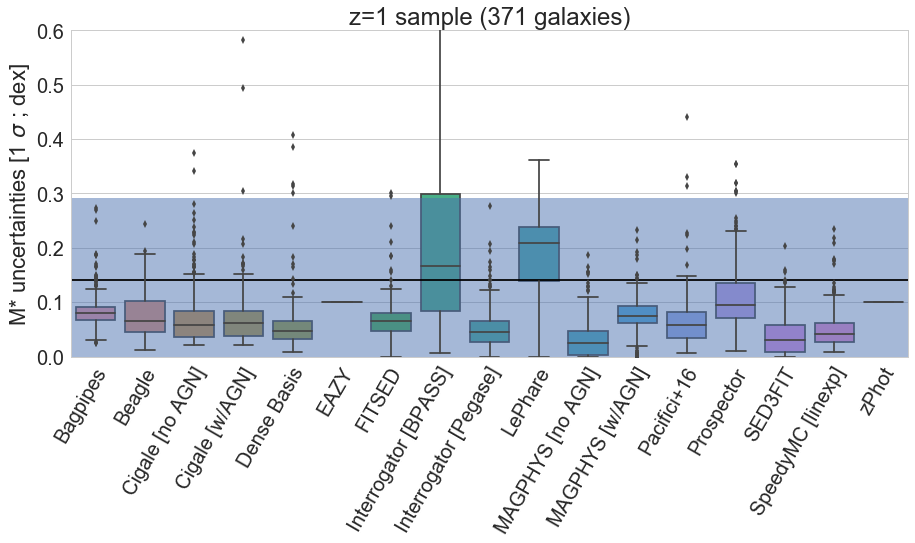

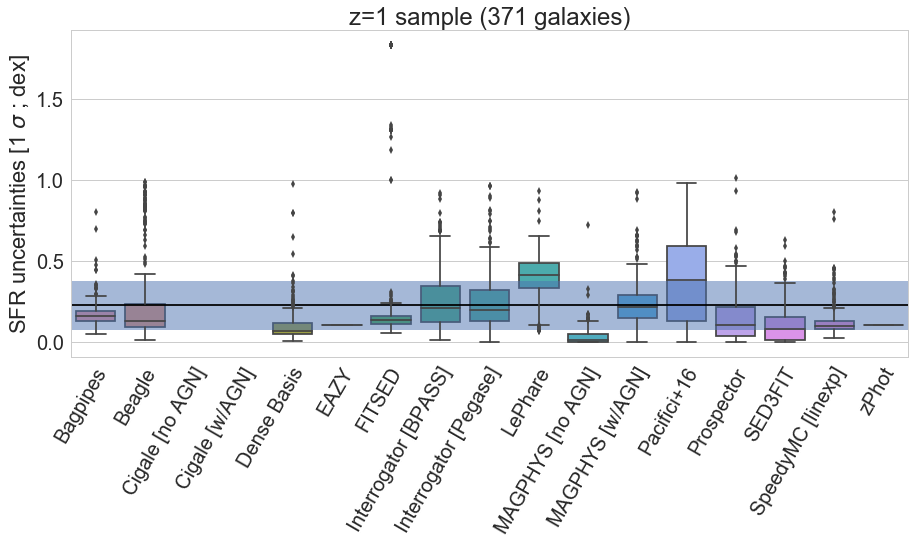

In [34]:


plt.figure(figsize=(15,6))
ax = sns.boxplot(data=z1_cat_mass_uncert/2, orient='v',zorder=10)


median_mass_uncert_val = np.nanmedian(z1_cat_mass_uncert)
plt.plot([-20,20],[median_mass_uncert_val,median_mass_uncert_val],'k-')
plt.fill_between([-20,20], [median_mass_uncert_val+0.15,median_mass_uncert_val+0.15], [median_mass_uncert_val-0.15,median_mass_uncert_val-0.15], alpha=0.5)
ax.set_xticks(np.arange(z1_cat_mass_uncert.shape[1])+0.3)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60,horizontalalignment='right',position=(1,0))
ax.set_ylabel(r'M* uncertainties [1 $\sigma$ ; dex]')
ax.set_title('z=1 sample (371 galaxies)')
fname = 'figures/z1_sample_Mstar_uncert_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
plt.ylim(0,0.6)
#plt.ylim(6,13)
#x = 6;plt.plot([x-0.4,x-0.4],[6,13],'k--',zorder=100);plt.plot([x+1+0.4,x+1+0.4],[6,13],'k--',zorder=100)
#plt.text(x-0.8+0.5,6.5,'includes \nBinary \ntemplates',fontsize=14)
#x = 2;plt.plot([x-1-0.4,x-1-0.4],[6,13],'r--',zorder=100);plt.plot([x+0.45,x+0.45],[6,13],'r--',zorder=100)
#plt.text(x-1.8+0.55,6.5,'estimates \nAGN \ncontribution',fontsize=14)
#x = 10;plt.plot([x-1-0.4,x-1-0.4],[6,13],'r--',zorder=100);plt.plot([x+0.4,x+0.4],[6,13],'r--',zorder=100)
#plt.text(x-1.8+0.5,6.5,'estimates \nAGN \ncontribution',fontsize=14)
plt.show()



plt.figure(figsize=(15,6))
ax = sns.boxplot(data=z1_cat_sfr_uncert/2, orient='v',zorder=10)


median_sfr_uncert_val = np.nanmedian(z1_cat_sfr_uncert)
plt.plot([-20,20],[median_sfr_uncert_val,median_sfr_uncert_val],'k-')
plt.fill_between([-20,20], [median_sfr_uncert_val+0.15,median_sfr_uncert_val+0.15], [median_sfr_uncert_val-0.15,median_sfr_uncert_val-0.15], alpha=0.5)
ax.set_xticks(np.arange(z1_cat_sfr_uncert.shape[1])+0.3)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60,horizontalalignment='right',position=(1,0))
ax.set_ylabel(r'SFR uncertainties [1 $\sigma$ ; dex]')
ax.set_title('z=1 sample (371 galaxies)')
fname = 'figures/z1_sample_SFR_uncert_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
#plt.ylim(0,0.6)
#plt.ylim(6,13)
#x = 6;plt.plot([x-0.4,x-0.4],[6,13],'k--',zorder=100);plt.plot([x+1+0.4,x+1+0.4],[6,13],'k--',zorder=100)
#plt.text(x-0.8+0.5,6.5,'includes \nBinary \ntemplates',fontsize=14)
#x = 2;plt.plot([x-1-0.4,x-1-0.4],[6,13],'r--',zorder=100);plt.plot([x+0.45,x+0.45],[6,13],'r--',zorder=100)
#plt.text(x-1.8+0.55,6.5,'estimates \nAGN \ncontribution',fontsize=14)
#x = 10;plt.plot([x-1-0.4,x-1-0.4],[6,13],'r--',zorder=100);plt.plot([x+0.4,x+0.4],[6,13],'r--',zorder=100)
#plt.text(x-1.8+0.5,6.5,'estimates \nAGN \ncontribution',fontsize=14)
plt.show()

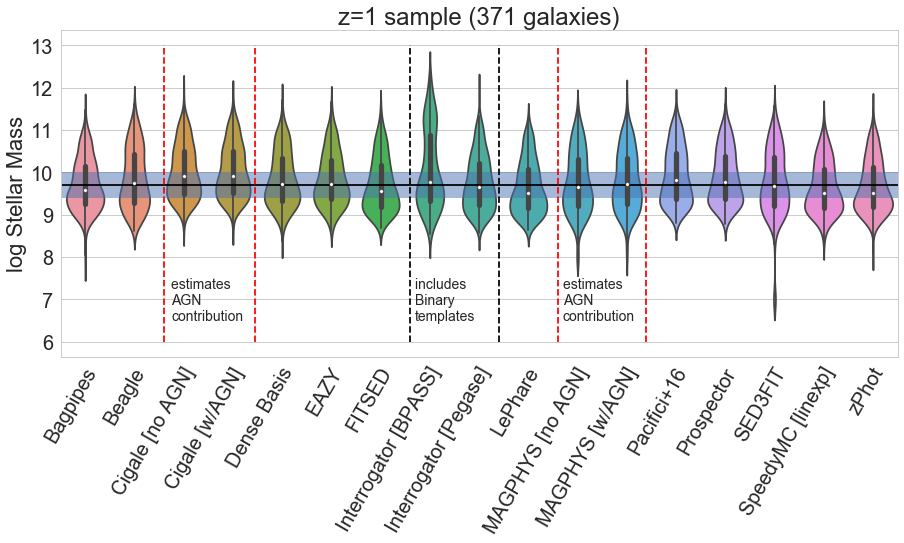

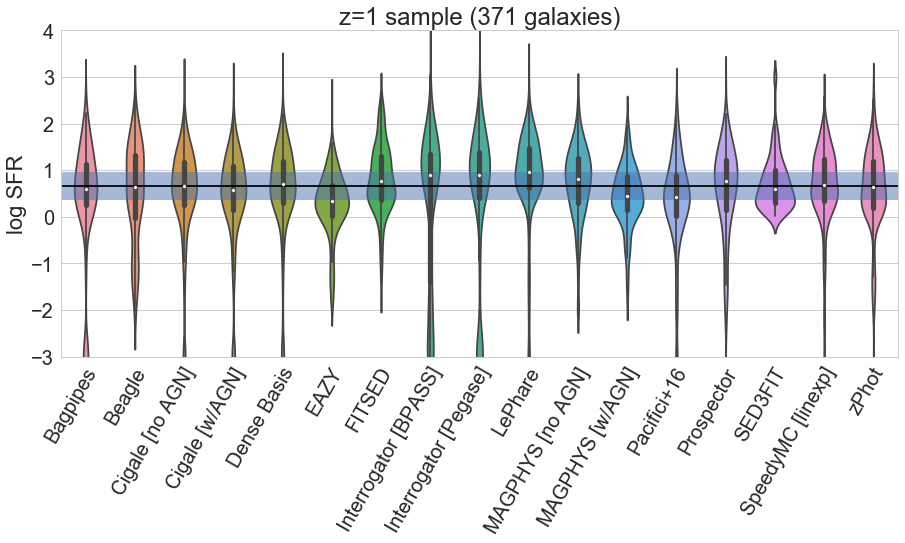

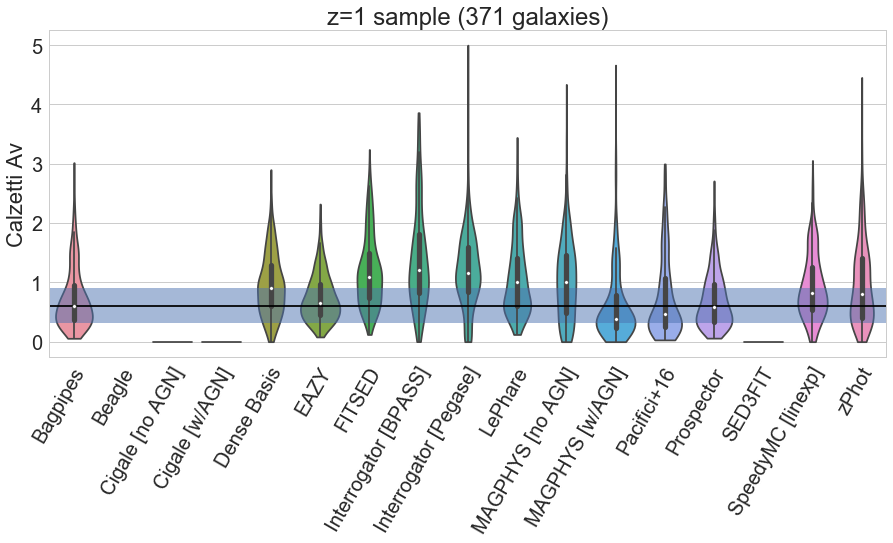

In [46]:
sns.set_style('whitegrid')

plt.figure(figsize=(15,6))
ax = sns.violinplot(data=z1_cat_mass, orient='v',zorder=10)


median_mass_val = np.nanmedian(z1_cat_mass)
plt.plot([-20,20],[median_mass_val,median_mass_val],'k-')
plt.fill_between([-20,20], [median_mass_val+0.3,median_mass_val+0.3], [median_mass_val-0.3,median_mass_val-0.3], alpha=0.5)
ax.set_xticks(np.arange(z1_cat_mass.shape[1])+0.3)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60,horizontalalignment='right',position=(1,0))
ax.set_ylabel('log Stellar Mass')
ax.set_title('z=1 sample (371 galaxies)')

#plt.ylim(6,13)
x = 7;plt.plot([x-0.4,x-0.4],[6,13],'k--',zorder=100);plt.plot([x+1+0.4,x+1+0.4],[6,13],'k--',zorder=100)
plt.text(x-0.8+0.5,6.5,'includes \nBinary \ntemplates',fontsize=14)
x = 3;plt.plot([x-1-0.4,x-1-0.4],[6,13],'r--',zorder=100);plt.plot([x+0.45,x+0.45],[6,13],'r--',zorder=100)
plt.text(x-1.8+0.55,6.5,'estimates \nAGN \ncontribution',fontsize=14)
x = 11;plt.plot([x-1-0.4,x-1-0.4],[6,13],'r--',zorder=100);plt.plot([x+0.4,x+0.4],[6,13],'r--',zorder=100)
plt.text(x-1.8+0.5,6.5,'estimates \nAGN \ncontribution',fontsize=14)

fname = 'figures/z1_sample_Mstar_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()


plt.figure(figsize=(15,6))
ax = sns.violinplot(data=z1_cat_sfr, orient='v')

median_sfr_val = np.nanmedian(z1_cat_sfr)
plt.plot([-20,20],[median_sfr_val,median_sfr_val],'k-')
plt.fill_between([-20,20], [median_sfr_val+0.3,median_sfr_val+0.3], [median_sfr_val-0.3,median_sfr_val-0.3], alpha=0.5)
ax.set_xticks(np.arange(z1_cat_sfr.shape[1])+0.3)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60,horizontalalignment='right')
ax.set_ylabel('log SFR')
ax.set_title('z=1 sample (371 galaxies)')
fname = 'figures/z1_sample_SFR_all_galaxies.png'
plt.ylim(-3,4)
plt.savefig(fname, bbox_inches='tight')
plt.show()




plt.figure(figsize=(15,6))
ax = sns.violinplot(data=z1_cat_Av, orient='v',cut=0)

median_Av_val = np.nanmedian(z1_cat_Av)
plt.plot([-20,20],[median_Av_val,median_Av_val],'k-')
plt.fill_between([-20,20], [median_Av_val+0.3,median_Av_val+0.3], [median_Av_val-0.3,median_Av_val-0.3], alpha=0.5)

ax.set_xticks(np.arange(z1_cat_Av.shape[1])+0.3)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60,horizontalalignment='right')
ax.set_ylabel('Calzetti Av')
ax.set_title('z=1 sample (371 galaxies)')
fname = 'figures/z1_sample_AV_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()




# now calculating the inter-code variance in SFR and M* for the z~1 sample

In [39]:
mass_z1cat_50 = np.nanmedian(z1_cat_mass,axis=1)
mass_z1cat_16 = np.nanpercentile(z1_cat_mass,16,axis=1)
mass_z1cat_84 = np.nanpercentile(z1_cat_mass,84,axis=1)

mass_uncert_z1cat_50 = np.nanmedian(z1_cat_mass_uncert, axis=1)

z1_cat_sfr[z1_cat_sfr < -3] = np.nan

sfr_z1cat_50 = np.nanmedian(z1_cat_sfr,axis=1)
sfr_z1cat_16 = np.nanpercentile(z1_cat_sfr,16,axis=1)
sfr_z1cat_84 = np.nanpercentile(z1_cat_sfr,84,axis=1)

sfr_uncert_z1cat_50 = np.nanmedian(z1_cat_sfr_uncert, axis=1)

ssfr_dist = np.log10(10**np.array(z1_cat_sfr) / 10**np.array(z1_cat_mass))

ssfr_z1cat_50 = np.nanmedian(ssfr_dist,axis=1)
ssfr_z1cat_16 = np.nanpercentile(ssfr_dist,16,axis=1)
ssfr_z1cat_84 = np.nanpercentile(ssfr_dist,84,axis=1)

Av_z1cat_50 = np.nanmedian(z1_cat_Av,axis=1)
Av_z1cat_16 = np.nanpercentile(z1_cat_Av,16,axis=1)
Av_z1cat_84 = np.nanpercentile(z1_cat_Av,84,axis=1)

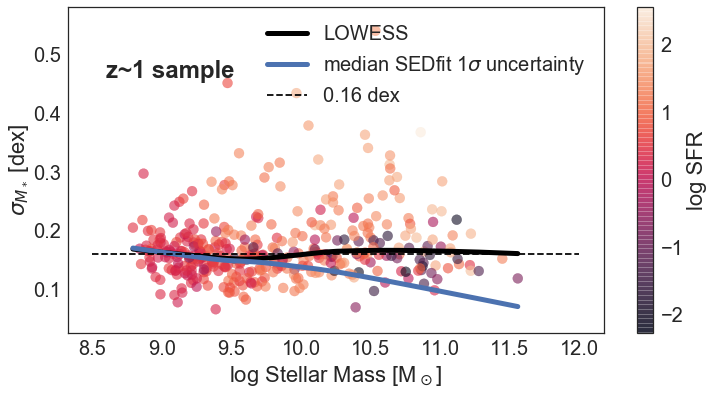

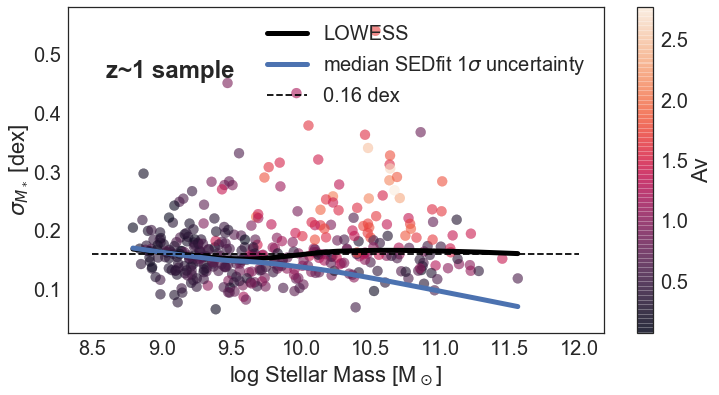

In [40]:
# plot variability for all the galaxies:

sns.set_style("white")

median_sigma = np.nanmedian((mass_z1cat_84 - mass_z1cat_16)/2)

plt.figure(figsize=(12,6))
plt.scatter(mass_z1cat_50, (mass_z1cat_84 - mass_z1cat_16)/2,s=100,alpha=0.6,c=sfr_z1cat_50)

z1 = lowess((mass_z1cat_84 - mass_z1cat_16)/2,mass_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=5,label='LOWESS')

z2 = lowess(mass_uncert_z1cat_50,mass_z1cat_50)
plt.plot(z2[0:,0],z2[0:,1],'-',lw=5,label=r'median SEDfit 1$\sigma$ uncertainty')

plt.plot([8.5,12],[median_sigma, median_sigma],'k--',label='%.2f dex' %median_sigma)
plt.xlabel(r'log Stellar Mass [M$_\odot$]')
plt.ylabel(r'$\sigma_{M_*}$ [dex]')
plt.legend()
plt.text(8.6,0.46,'z~1 sample',fontsize=24,fontweight='bold')

clbr = plt.colorbar()
clbr.set_label('log SFR')
fname = 'figures/mass_variability_z1_colorsfr.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()


plt.figure(figsize=(12,6))
plt.scatter(mass_z1cat_50, (mass_z1cat_84 - mass_z1cat_16)/2,s=100,alpha=0.6,c=Av_z1cat_50)

z1 = lowess((mass_z1cat_84 - mass_z1cat_16)/2,mass_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=5,label='LOWESS')

z2 = lowess(mass_uncert_z1cat_50,mass_z1cat_50)
plt.plot(z2[0:,0],z2[0:,1],'-',lw=5,label=r'median SEDfit 1$\sigma$ uncertainty')

plt.plot([8.5,12],[median_sigma, median_sigma],'k--',label='%.2f dex' %median_sigma)
plt.xlabel(r'log Stellar Mass [M$_\odot$]')
plt.ylabel(r'$\sigma_{M_*}$ [dex]')
plt.legend()
plt.text(8.6,0.46,'z~1 sample',fontsize=24,fontweight='bold')

clbr = plt.colorbar()
clbr.set_label('Av')
fname = 'figures/mass_variability_z1_colorAv.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

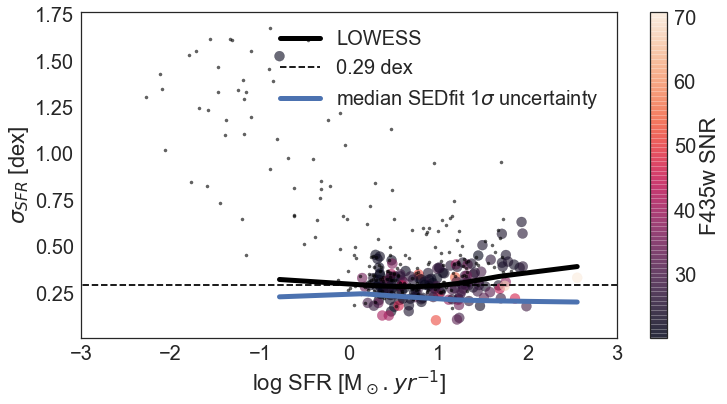

In [41]:
sns.set_style("white")


plt.figure(figsize=(12,6))

fsnr = cat_z1_f435_SNR
mask = (fsnr > 20)

#mask = (np.sqrt(cat_z1_f435_SNR) <0.07 )
median_sigma = np.nanmedian((sfr_z1cat_84[mask] - sfr_z1cat_16[mask])/2)
plt.scatter(sfr_z1cat_50[mask], 
            (sfr_z1cat_84[mask] - sfr_z1cat_16[mask])/2,
            s=100,alpha=0.6,c=fsnr[mask])

clbr = plt.colorbar()
clbr.set_label('F435w SNR')
plt.xlim(-3,3)

plt.scatter(sfr_z1cat_50[~mask], 
            (sfr_z1cat_84[~mask] - sfr_z1cat_16[~mask])/2,
            s=10,alpha=0.6,color='k')

z1 = lowess((sfr_z1cat_84[mask] - sfr_z1cat_16[mask])/2,sfr_z1cat_50[mask])
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=5,label='LOWESS')
plt.plot([-5,4],[median_sigma, median_sigma],'k--',label='%.2f dex' %median_sigma)

z2 = lowess(sfr_uncert_z1cat_50[mask],sfr_z1cat_50[mask])
plt.plot(z2[0:,0],z2[0:,1],'-',lw=5,label=r'median SEDfit 1$\sigma$ uncertainty')

plt.xlabel(r'log SFR [M$_\odot.yr^{-1}$]')
plt.ylabel(r'$\sigma_{SFR}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')


fname = 'figures/sfr_variability_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()




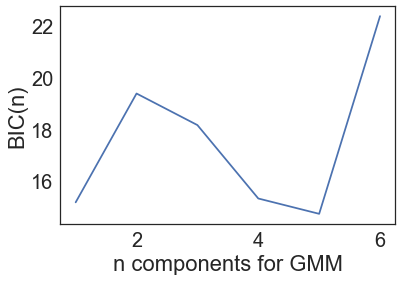

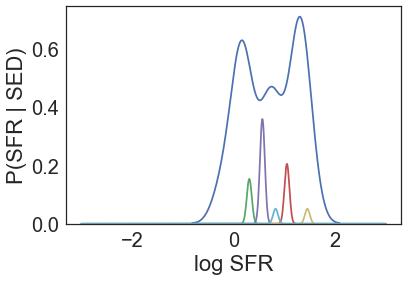

In [98]:
# selecting the SFRs that have a unimodal distribution:

from sklearn import mixture

z1_cat_sfr_array = np.array(z1_cat_sfr)

lowest_bic = np.infty
bic = []
n_components_range = range(1, 7)

X = z1_cat_sfr_array[12,0:].reshape(-1,1)

for n_components in n_components_range:
    # Fit a Gaussian mixture with EM
    gmm = mixture.GaussianMixture(n_components=n_components, covariance_type='full', random_state=12)
    gmm.fit(X)
    bic.append(gmm.bic(X))
    if bic[-1] < lowest_bic:
        lowest_bic = bic[-1]
        best_gmm = gmm

plt.plot(n_components_range, bic)
plt.xlabel('n components for GMM');plt.ylabel('BIC(n)')
plt.show()

Y = best_gmm.predict(X)

sns.kdeplot(z1_cat_sfr_array[1,0:],bw=0.2)

xrange = np.arange(-3,3,0.01)
for i in range(n_components_range[np.argmin(bic)]):
    tempgauss = np.exp(-(xrange-best_gmm.means_[i])**2/(best_gmm.covariances_[1][0][0]))
    plt.plot(xrange, tempgauss/np.sum(tempgauss)*10*np.sum(Y==(i))/len(Y))
    
plt.xlabel('log SFR');plt.ylabel('P(SFR | SED)')
plt.show()


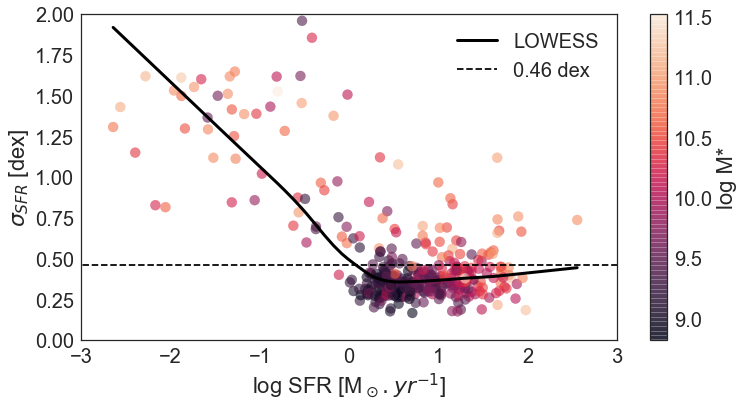

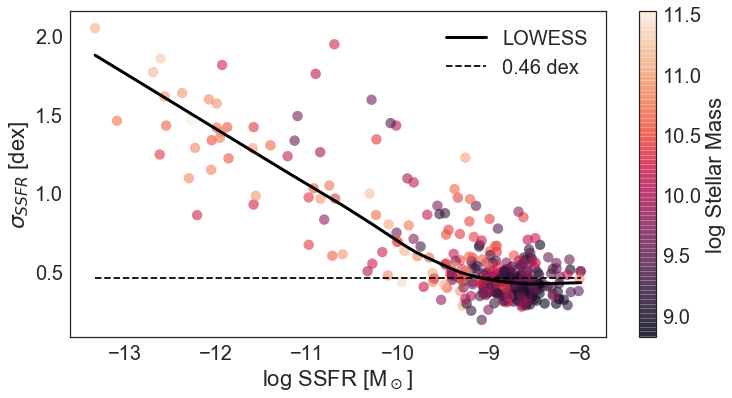

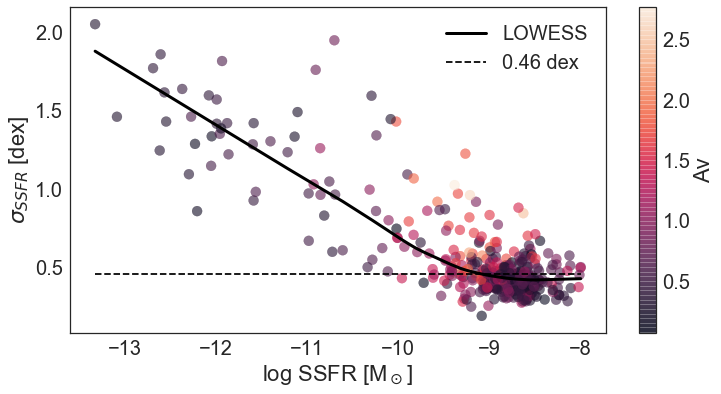

In [220]:

plt.figure(figsize=(12,6))
#plt.subplot(2,1,1)
plt.scatter(sfr_z1cat_50, (sfr_z1cat_84 - sfr_z1cat_16)/2,s=100,alpha=0.6,c=mass_z1cat_50)

z1 = lowess((sfr_z1cat_84 - sfr_z1cat_16)/2,sfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([-5,4],[median_sigma, median_sigma],'k--',label='%.2f dex' %median_sigma)
plt.xlabel(r'log SFR [M$_\odot.yr^{-1}$]')
plt.ylabel(r'$\sigma_{SFR}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')
plt.ylim(0,2)

clbr = plt.colorbar()
clbr.set_label('log M*')
plt.xlim(-3,3)

fname = 'figures/sfr_variability_z1_small_axes.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

#-------------------------------------------------

# plot variability for all the galaxies:

median_sigma = np.nanmedian((ssfr_z1cat_84 - ssfr_z1cat_16)/2)


plt.figure(figsize=(12,6))
plt.scatter(ssfr_z1cat_50, (ssfr_z1cat_84 - ssfr_z1cat_16)/2,s=100,alpha=0.6,c=mass_z1cat_50)

z1 = lowess((ssfr_z1cat_84 - ssfr_z1cat_16)/2,ssfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([np.nanmin(ssfr_z1cat_50), np.nanmax(ssfr_z1cat_50)],[median_sigma, median_sigma],'k--',label='%.2f dex' %median_sigma)
plt.xlabel(r'log SSFR [M$_\odot$]')
plt.ylabel(r'$\sigma_{SSFR}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')

clbr = plt.colorbar()
clbr.set_label('log Stellar Mass')
fname = 'figures/ssfr_variability_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()



plt.figure(figsize=(12,6))
plt.scatter(ssfr_z1cat_50, (ssfr_z1cat_84 - ssfr_z1cat_16)/2,s=100,alpha=0.6,c=(Av_z1cat_50))

z1 = lowess((ssfr_z1cat_84 - ssfr_z1cat_16)/2,ssfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([np.nanmin(ssfr_z1cat_50), np.nanmax(ssfr_z1cat_50)],[median_sigma, median_sigma],'k--',label='%.2f dex' %median_sigma)
plt.xlabel(r'log SSFR [M$_\odot$]')
plt.ylabel(r'$\sigma_{SSFR}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')

clbr = plt.colorbar()
clbr.set_label('Av')
fname = 'figures/ssfr_variability_z1.png'
#plt.savefig(fname, bbox_inches='tight')

plt.show()

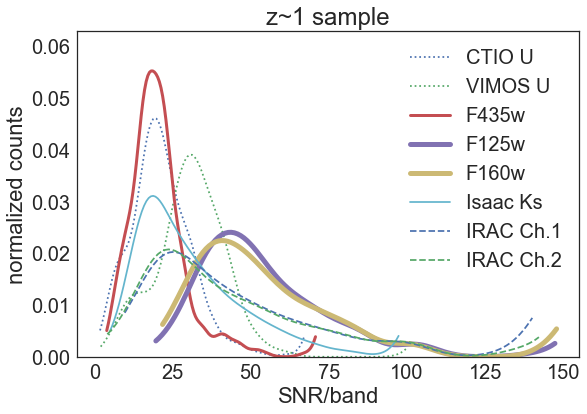

In [196]:
cat_z1_ctioU_SNR = candels_cat_z1[0:,3]/candels_cat_z1[0:,2]
cat_z1_vimosU_SNR = candels_cat_z1[0:,5]/candels_cat_z1[0:,4]
cat_z1_f435_SNR = candels_cat_z1[0:,7]/candels_cat_z1[0:,6]
cat_z1_f125_SNR = candels_cat_z1[0:,21]/candels_cat_z1[0:,20]
cat_z1_f160_SNR = candels_cat_z1[0:,23]/candels_cat_z1[0:,22]
cat_z1_isaacKs_SNR = candels_cat_z1[0:,25]/candels_cat_z1[0:,24]
cat_z1_irac1_SNR = candels_cat_z1[0:,29]/candels_cat_z1[0:,28]
cat_z1_irac2_SNR = candels_cat_z1[0:,31]/candels_cat_z1[0:,30]

#total_SNR = np.mean(candels_cat)
z1_seds = candels_cat_z1[0:,np.arange(2,35,2)]
z1_errs = candels_cat_z1[0:,np.arange(3,36,2)]
total_SNR = (z1_errs/z1_seds)
total_SNR.shape

total_SNR_mean = np.zeros_like(cat_z1_ctioU_SNR)
for i in range(len(total_SNR_mean)):
    mask = total_SNR[i,0:] > 0
    total_SNR_mean[i] = np.mean(total_SNR[i,mask])
# also flags = 36,37


plt.figure(figsize=(9,6))
xax = cat_z1_ctioU_SNR
sns.kdeplot(1/np.sqrt(xax[xax>0]),cut=0,label='CTIO U',linestyle=":")
xax = cat_z1_vimosU_SNR
sns.kdeplot(1/np.sqrt(xax[xax>0]),cut=0,label='VIMOS U',linestyle=":")
xax = cat_z1_f435_SNR
sns.kdeplot(1/np.sqrt(xax[xax>0]),cut=0,label='F435w',lw=3)
xax = cat_z1_f125_SNR
sns.kdeplot(1/np.sqrt(xax[xax>0]),cut=0,label='F125w',lw=5)
xax = cat_z1_f160_SNR
sns.kdeplot(1/np.sqrt(xax[xax>0]),cut=0,label='F160w',lw=5)
xax = cat_z1_isaacKs_SNR
sns.kdeplot(1/np.sqrt(xax[xax>0]),cut=0,label='Isaac Ks')
xax = cat_z1_irac1_SNR
sns.kdeplot(1/np.sqrt(xax[xax>0]),cut=0,label='IRAC Ch.1',linestyle="--")
xax = cat_z1_irac2_SNR
sns.kdeplot(1/np.sqrt(xax[xax>0]),cut=0,label='IRAC Ch.2',linestyle="--")
plt.legend(edgecolor='w')
plt.xlabel('SNR/band')
plt.ylim(0,0.063)
plt.ylabel('normalized counts')
plt.title('z~1 sample')
plt.show()

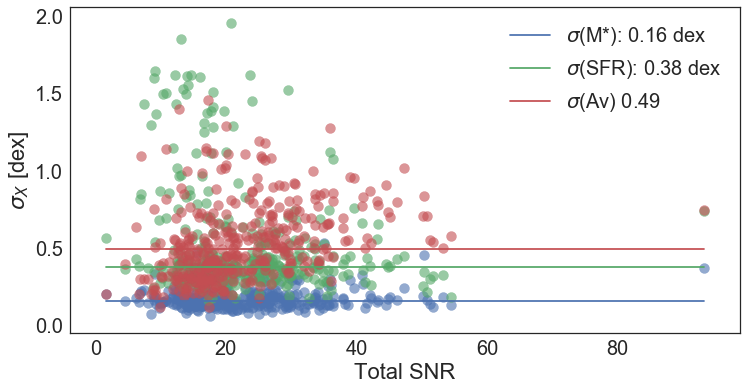

In [214]:
massvar = (mass_z1cat_84 - mass_z1cat_16)/2
sfrvar = (sfr_z1cat_84 - sfr_z1cat_16)/2
dustvar = (Av_z1cat_84 - Av_z1cat_16)/2
ssfrvar = (ssfr_z1cat_84 - ssfr_z1cat_16)/2

xax = 1/np.sqrt(total_SNR_mean)
mask = (xax>0)


plt.figure(figsize=(12,6))
plt.scatter(xax[mask], massvar[mask],s=100,alpha=0.6)
median_sigma = np.median(massvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(M*): %.2f dex' %median_sigma)

plt.scatter(xax[mask], sfrvar[mask],s=100,alpha=0.6)
median_sigma = np.median(sfrvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(SFR): %.2f dex' %median_sigma)

plt.scatter(xax[mask], dustvar[mask],s=100,alpha=0.6)
median_sigma = np.median(dustvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(Av) %.2f' %median_sigma)

plt.xlabel(r'Total SNR')
plt.ylabel(r'$\sigma_{X}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')
#plt.xscale('log')
fname = 'figures/variability_total_SNR_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

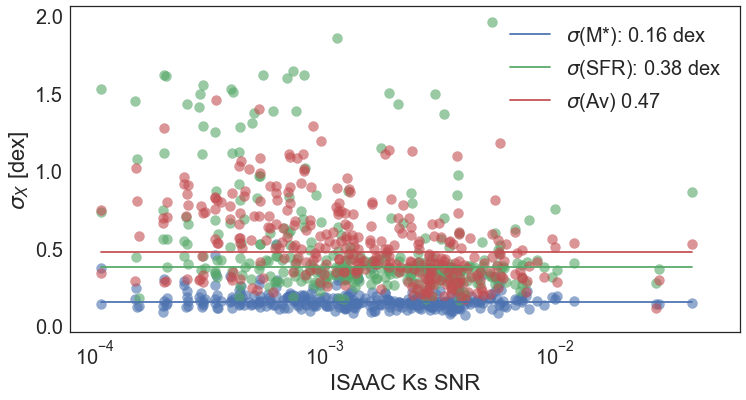

In [95]:
massvar = (mass_z1cat_84 - mass_z1cat_16)/2
sfrvar = (sfr_z1cat_84 - sfr_z1cat_16)/2
dustvar = (Av_z1cat_84 - Av_z1cat_16)/2
ssfrvar = (ssfr_z1cat_84 - ssfr_z1cat_16)/2

xax = cat_z1_isaacKs_SNR
mask = (xax>0)


plt.figure(figsize=(12,6))
plt.scatter(xax[mask], massvar[mask],s=100,alpha=0.6)
median_sigma = np.median(massvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(M*): %.2f dex' %median_sigma)

plt.scatter(xax[mask], sfrvar[mask],s=100,alpha=0.6)
median_sigma = np.median(sfrvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(SFR): %.2f dex' %median_sigma)

plt.scatter(xax[mask], dustvar[mask],s=100,alpha=0.6)
median_sigma = np.median(dustvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(Av) %.2f' %median_sigma)

plt.xlabel(r'ISAAC Ks SNR')
plt.ylabel(r'$\sigma_{X}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')
plt.xscale('log')
fname = 'figures/variability_Ks_SNR_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

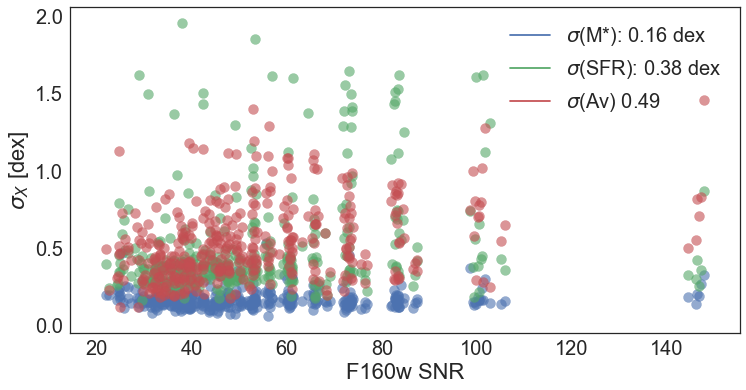

In [211]:
massvar = (mass_z1cat_84 - mass_z1cat_16)/2
sfrvar = (sfr_z1cat_84 - sfr_z1cat_16)/2
dustvar = (Av_z1cat_84 - Av_z1cat_16)/2
ssfrvar = (ssfr_z1cat_84 - ssfr_z1cat_16)/2

xax = cat_z1_f160_SNR
mask = (xax>0)


plt.figure(figsize=(12,6))
plt.scatter(xax[mask], massvar[mask],s=100,alpha=0.6)
median_sigma = np.median(massvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(M*): %.2f dex' %median_sigma)

plt.scatter(xax[mask], sfrvar[mask],s=100,alpha=0.6)
median_sigma = np.median(sfrvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(SFR): %.2f dex' %median_sigma)

plt.scatter(xax[mask], dustvar[mask],s=100,alpha=0.6)
median_sigma = np.median(dustvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(Av) %.2f' %median_sigma)

plt.xlabel(r'F160w SNR')
plt.ylabel(r'$\sigma_{X}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')
#plt.xscale('log')
fname = 'figures/variability_f160w_SNR_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

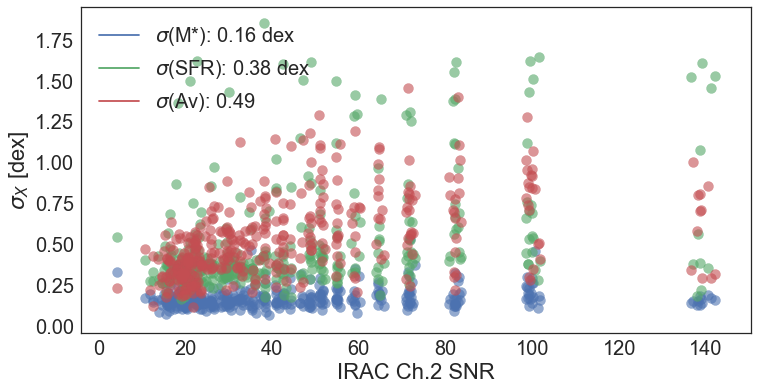

In [210]:
massvar = (mass_z1cat_84 - mass_z1cat_16)/2
sfrvar = (sfr_z1cat_84 - sfr_z1cat_16)/2
dustvar = (Av_z1cat_84 - Av_z1cat_16)/2
ssfrvar = (ssfr_z1cat_84 - ssfr_z1cat_16)/2

xax = cat_z1_irac2_SNR
mask = (xax>0)


plt.figure(figsize=(12,6))
plt.scatter(xax[mask], massvar[mask],s=100,alpha=0.6)
median_sigma = np.median(massvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(M*): %.2f dex' %median_sigma)

plt.scatter(xax[mask], sfrvar[mask],s=100,alpha=0.6)
median_sigma = np.median(sfrvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(SFR): %.2f dex' %median_sigma)

plt.scatter(xax[mask], dustvar[mask],s=100,alpha=0.6)
median_sigma = np.median(dustvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(Av): %.2f' %median_sigma)

plt.xlabel(r'IRAC Ch.2 SNR')
plt.ylabel(r'$\sigma_{X}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')
#plt.xscale('log')
fname = 'figures/variability_irac2_SNR_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

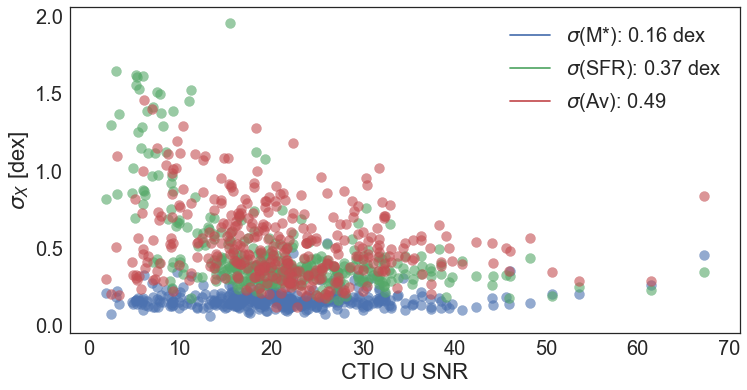

In [209]:
massvar = (mass_z1cat_84 - mass_z1cat_16)/2
sfrvar = (sfr_z1cat_84 - sfr_z1cat_16)/2
dustvar = (Av_z1cat_84 - Av_z1cat_16)/2
ssfrvar = (ssfr_z1cat_84 - ssfr_z1cat_16)/2

xax = cat_z1_ctioU_SNR
mask = (xax>0)


plt.figure(figsize=(12,6))
plt.scatter(xax[mask], massvar[mask],s=100,alpha=0.6)
median_sigma = np.median(massvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(M*): %.2f dex' %median_sigma)

plt.scatter(xax[mask], sfrvar[mask],s=100,alpha=0.6)
median_sigma = np.median(sfrvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(SFR): %.2f dex' %median_sigma)

plt.scatter(xax[mask], dustvar[mask],s=100,alpha=0.6)
median_sigma = np.median(dustvar[mask])
plt.plot([np.nanmin(xax[mask]), np.nanmax(xax[mask])],[median_sigma, median_sigma],'-',label=r'$\sigma$(Av): %.2f' %median_sigma)

plt.xlabel(r'CTIO U SNR')
plt.ylabel(r'$\sigma_{X}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')
#plt.xscale('log')
fname = 'figures/variability_ctio_U_SNR_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

In [ ]:
z1 = lowess((ssfr_z1cat_84 - ssfr_z1cat_16)/2,ssfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')


# redshift 3 sample.

In [42]:
# dataframes for Mass, SFR and dust at z~1

warnings.filterwarnings('ignore')

brett_mass_z3_masked = brett_mass_z3
brett_mass_z3_masked[brett_mass_z3_masked < 0] = np.nan

nima_mass_z3_masked = nima_mass_z3
nima_mass_z3_masked[nima_mass_z3_masked < 0] = np.nan

# Missing codes: BEAGLE, EAZY, Cigale, Prospector any others ???

z3_cat_mass_dict = {'zPhot':marianna_mass_z3, 
                    'LePhare':nima_mass_z3_masked, 
                    'FITSED':brett_mass_z3_masked, 
                    'MAGPHYS [no AGN]':magphys_mass_z3, 
                    'MAGPHYS [w/AGN]':magphys_mass_z3_wagn, 
                    'EAZY':np.zeros_like(marianna_mass_z3)*np.nan, 
                    'SpeedyMC [linexp]':speedy_mass_z3,
                    'Cigale':cigale_mass_z3, 
                    'Dense Basis': DB_mass_z3.ravel(), 
                    'Pacifici+16': cami_mass_z3.ravel(), 
                    'Prospector': prospector_mass_z3,
                    'Bagpipes': bagpipes_mass_z3, 
                    'Beagle': beagle_mass_z3,
                    'SED3FIT':sed3fit_mass_z3,
                    'Interrogator [BPASS]':interrogator_mass_z3_bpass.ravel(), 
                    'Interrogator [Pegase]':interrogator_mass_z3_pegase.ravel()}
z3_cat_mass = pd.DataFrame(data=z3_cat_mass_dict)

z3_cat_mass[z3_cat_mass < 7] = np.nan



z3_cat_sfr_dict = {'zPhot':marianna_sfr_z3, 
                    'LePhare':nima_sfr_z3, 
                    'FITSED':brett_sfr_z3, 
                    'MAGPHYS [no AGN]':magphys_sfr_z3, 
                    'MAGPHYS [w/AGN]':magphys_sfr_z3_wagn, 
                    'EAZY':np.zeros_like(marianna_mass_z3)*np.nan, 
                    'SpeedyMC [linexp]':speedy_sfr_z3,
                    'Cigale':cigale_sfr_z3, 
                    'Dense Basis': DB_sfr_z3.ravel(), 
                    'Pacifici+16': cami_sfr_z3.ravel(), 
                    'Prospector': prospector_sfr_z3,
                    'Bagpipes': bagpipes_sfr_z3, 
                    'Beagle': beagle_sfr_z3,
                    'SED3FIT':sed3fit_sfr_z3,
                    'Interrogator [BPASS]':interrogator_sfr_z3_bpass, 
                    'Interrogator [Pegase]':interrogator_sfr_z3_pegase}
z3_cat_sfr = pd.DataFrame(data=z3_cat_sfr_dict)

z3_cat_sfr[z3_cat_sfr < -3] = -3 # fixes the stretching that a lot of the SFR distributions show due to exrtemely low SFRs

interrogator_Av_z3_bpass[interrogator_Av_z3_bpass < 0] = np.nan
interrogator_Av_z3_pegase[interrogator_Av_z3_pegase < 0] = np.nan

z3_cat_Av_dict = {'zPhot':marianna_Av_z3, 
                    'LePhare':nima_Av_z3, 
                    'FITSED':brett_Av_z3, 
                    'MAGPHYS [no AGN]':magphys_Av_z3, 
                    'MAGPHYS [w/AGN]':magphys_Av_z3_wagn, 
                    'EAZY':np.zeros_like(marianna_mass_z3)*np.nan, 
                    'SpeedyMC [linexp]':speedy_Av_z3,
                    'Cigale':np.zeros_like(marianna_mass_z3)*np.nan, 
                    'Dense Basis': DB_Av_z3.ravel(), 
                    'Pacifici+16': cami_Av_z3.ravel(), 
                    'Prospector': prospector_Av_z3,
                    'Bagpipes': bagpipes_Av_z3, 
                    'Beagle': beagle_Av_z3*np.nan,
                    'SED3FIT':np.zeros_like(speedy_Av_z3),
                    'Interrogator [BPASS]':interrogator_Av_z3_bpass, 
                    'Interrogator [Pegase]':interrogator_Av_z3_pegase}
z3_cat_Av = pd.DataFrame(data=z3_cat_Av_dict)

print(z3_cat_mass.shape)
print(z3_cat_sfr.shape)
print(z3_cat_Av.shape)

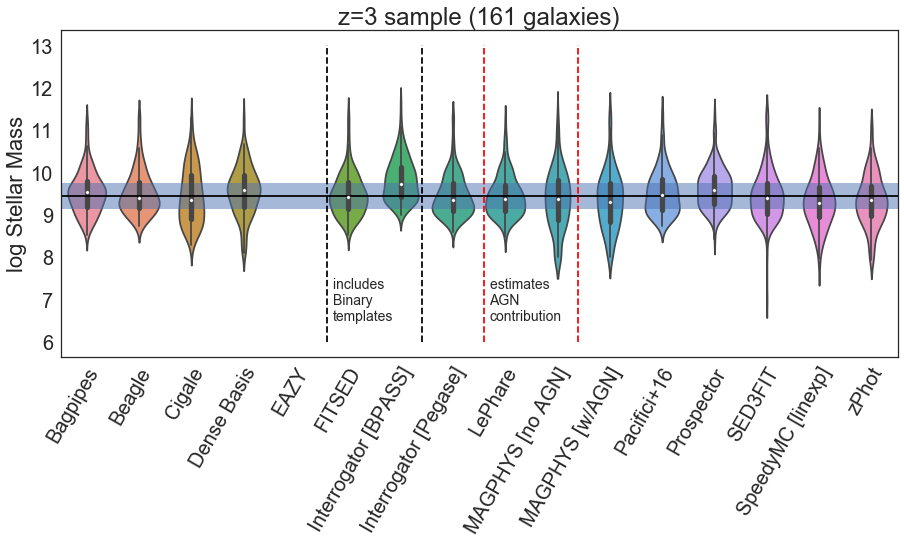

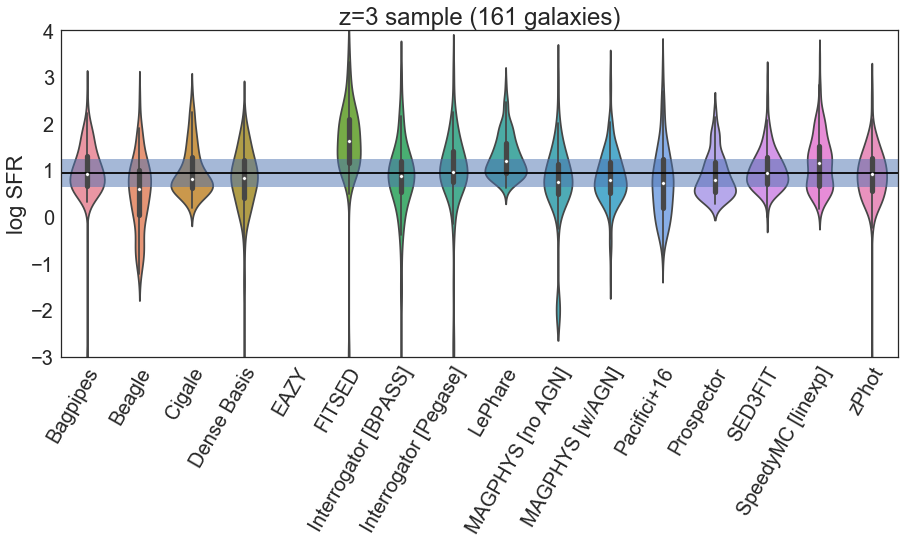

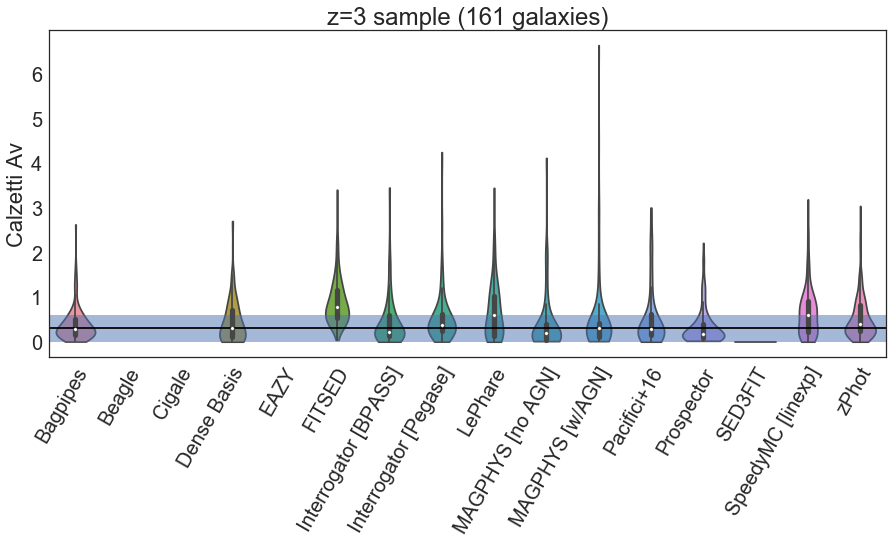

In [43]:


plt.figure(figsize=(15,6))
ax = sns.violinplot(data=z3_cat_mass, orient='v',zorder=10)


median_mass_val = np.nanmedian(z3_cat_mass)
plt.plot([-20,20],[median_mass_val,median_mass_val],'k-')
plt.fill_between([-20,20], [median_mass_val+0.3,median_mass_val+0.3], [median_mass_val-0.3,median_mass_val-0.3], alpha=0.5)
ax.set_xticks(np.arange(z3_cat_mass.shape[1])+0.3)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60,horizontalalignment='right',position=(1,0))
ax.set_ylabel('log Stellar Mass')
ax.set_title('z=3 sample (161 galaxies)')
fname = 'figures/z3_sample_Mstar_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
#plt.ylim(6,13)
x = 5;plt.plot([x-0.4,x-0.4],[6,13],'k--',zorder=100);plt.plot([x+1+0.4,x+1+0.4],[6,13],'k--',zorder=100)
plt.text(x-0.8+0.5,6.5,'includes \nBinary \ntemplates',fontsize=14)
#x = 2;plt.plot([x-1-0.4,x-1-0.4],[6,13],'r--',zorder=100);plt.plot([x+0.45,x+0.45],[6,13],'r--',zorder=100)
#plt.text(x-1.8+0.55,6.5,'estimates \nAGN \ncontribution',fontsize=14)
x = 9;plt.plot([x-1-0.4,x-1-0.4],[6,13],'r--',zorder=100);plt.plot([x+0.4,x+0.4],[6,13],'r--',zorder=100)
plt.text(x-1.8+0.5,6.5,'estimates \nAGN \ncontribution',fontsize=14)
plt.show()



plt.figure(figsize=(15,6))
ax = sns.violinplot(data=z3_cat_sfr, orient='v')

median_sfr_val = np.nanmedian(z3_cat_sfr)
plt.plot([-20,20],[median_sfr_val,median_sfr_val],'k-')
plt.fill_between([-20,20], [median_sfr_val+0.3,median_sfr_val+0.3], [median_sfr_val-0.3,median_sfr_val-0.3], alpha=0.5)
ax.set_xticks(np.arange(z3_cat_sfr.shape[1])+0.3)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60,horizontalalignment='right')
ax.set_ylabel('log SFR')
ax.set_title('z=3 sample (161 galaxies)')
fname = 'figures/z3_sample_SFR_all_galaxies.png'
plt.ylim(-3,4)
plt.savefig(fname, bbox_inches='tight')
plt.show()




plt.figure(figsize=(15,6))
ax = sns.violinplot(data=z3_cat_Av, orient='v',cut=0)

median_Av_val = np.nanmedian(z3_cat_Av)
plt.plot([-20,20],[median_Av_val,median_Av_val],'k-')
plt.fill_between([-20,20], [median_Av_val+0.3,median_Av_val+0.3], [median_Av_val-0.3,median_Av_val-0.3], alpha=0.5)

ax.set_xticks(np.arange(z3_cat_Av.shape[1])+0.3)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60,horizontalalignment='right')
ax.set_ylabel('Calzetti Av')
ax.set_title('z=3 sample (161 galaxies)')
fname = 'figures/z3_sample_AV_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()



In [22]:
# I've used 0.2 dex uncertainties where Marianna's and EAZY fits that didn't have uncertainties.


dict_small_cat_mass = {'Marianna\CANDELS':marianna_mass_small, 'Nima\CANDELS':nima_mass_small, 'Salmon+15':brett_mass_small, 
                  'BEAGLE':beagle_mass_small_sorted, 'MAGPHYS':magphys_mass_small, 'EAZY':eazy_mass_small, 
                  'SpeedyMC [linexp]':speedy_mass_small, 'Interrogator [Pegase]':interrogator_mass_pegase, 
                  'Interrogator [Bpass]':interrogator_mass_bpass, 'LePhare':lephare_mass_small.ravel(), 
                  'Cigale [w/AGN]':cigale_mass_small_wagn.ravel(), 'Cigale [no AGN]':cigale_mass_small_noagn.ravel(), 
                  'Bagpipes': bagpipes_mass_small, 'Dense Basis': DB_mass_small.ravel(), 
                  'Pacifici+16': cami_mass_small.ravel(), 'Prospector': prospector_mass_small.ravel()}

small_cat_mass = pd.DataFrame(data=dict_small_cat_mass)


dict_small_cat_mass_lo = {'Marianna\CANDELS':marianna_mass_lo_small, 'Nima\CANDELS':nima_mass_lo_small, 
                     'Salmon+15':brett_mass_lo_small, 'BEAGLE':beagle_mass_lo_small_sorted, 
                     'MAGPHYS':magphys_mass_lo_small, 'EAZY':eazy_mass_small -np.ones_like(eazy_mass_small)*0.1, 
                  'SpeedyMC [linexp]':speedy_mass_lo_small, 'Interrogator [Pegase]':interrogator_mass_lo_pegase, 
                  'Interrogator [Bpass]':interrogator_mass_lo_bpass, 'LePhare':lephare_mass_lo_small.ravel(), 
                  'Cigale [w/AGN]':cigale_mass_lo_small_wagn, 'Cigale [no AGN]':cigale_mass_lo_small_noagn, 
                  'Bagpipes': bagpipes_mass_lo_small, 'Dense Basis': DB_mass_lo_small.ravel(), 
                  'Pacifici+16': cami_mass_lo_small.ravel(), 'Prospector': prospector_mass_lo_small}

small_cat_mass_lo = pd.DataFrame(data=dict_small_cat_mass_lo)

dict_small_cat_mass_hi = {'Marianna\CANDELS':marianna_mass_hi_small, 'Nima\CANDELS':nima_mass_hi_small, 
                     'Salmon+15':brett_mass_hi_small, 'BEAGLE':beagle_mass_hi_small_sorted, 
                     'MAGPHYS':magphys_mass_hi_small, 'EAZY':eazy_mass_small +np.ones_like(eazy_mass_small)*0.1, 
                  'SpeedyMC [linexp]':speedy_mass_hi_small, 'Interrogator [Pegase]':interrogator_mass_hi_pegase, 
                  'Interrogator [Bpass]':interrogator_mass_hi_bpass, 'LePhare':lephare_mass_hi_small.ravel(), 
                  'Cigale [w/AGN]':cigale_mass_hi_small_wagn, 'Cigale [no AGN]':cigale_mass_hi_small_noagn, 
                  'Bagpipes': bagpipes_mass_hi_small, 'Dense Basis': DB_mass_hi_small.ravel(), 
                  'Pacifici+16': cami_mass_hi_small.ravel(), 'Prospector': prospector_mass_hi_small}

small_cat_mass_hi = pd.DataFrame(data=dict_small_cat_mass_hi)


#-----------------------------------------------------------------------


dict_small_cat_sfr = {'Marianna\CANDELS':marianna_sfr_small, 'Nima\CANDELS':nima_sfr_small, 'Salmon+15':brett_sfr_small, 
                  'BEAGLE':beagle_sfr_small_sorted, 'MAGPHYS':magphys_sfr_small, 'EAZY':eazy_sfr_small, 
                  'Interrogator [Pegase]':interrogator_sfr_pegase, 'SpeedyMC [linexp]':speedy_sfr_small,
                  'Interrogator [Bpass]':interrogator_sfr_bpass, 'LePhare':lephare_sfr_small.ravel(), 
                  'Cigale [w/AGN]':cigale_sfr_small_wagn.ravel(), 'Cigale [no AGN]':cigale_sfr_small_noagn.ravel(), 
                  'Bagpipes': bagpipes_sfr_small, 'Dense Basis': DB_sfr_small.ravel(), 
                  'Pacifici+16': cami_sfr_small.ravel(), 'Prospector': prospector_sfr_small.ravel()}

small_cat_sfr = pd.DataFrame(data=dict_small_cat_sfr)


dict_small_cat_sfr_lo = {'Marianna\CANDELS':marianna_sfr_lo_small, 'Nima\CANDELS':nima_sfr_lo_small, 
                     'Salmon+15':brett_sfr_lo_small, 'BEAGLE':beagle_sfr_lo_small_sorted, 
                     'MAGPHYS':magphys_sfr_lo_small, 'EAZY':eazy_sfr_small -np.ones_like(eazy_sfr_small)*0.1, 
                  'Interrogator [Pegase]':interrogator_sfr_lo_pegase, 'SpeedyMC [linexp]':speedy_sfr_small - 0.1,
                  'Interrogator [Bpass]':interrogator_sfr_lo_bpass, 'LePhare':lephare_sfr_lo_small.ravel(), 
                  'Cigale [w/AGN]':cigale_sfr_lo_small_wagn, 'Cigale [no AGN]':cigale_sfr_lo_small_noagn, 
                  'Bagpipes': bagpipes_sfr_lo_small, 'Dense Basis': DB_sfr_lo_small.ravel(), 
                  'Pacifici+16': cami_sfr_lo_small.ravel(), 'Prospector': prospector_sfr_lo_small}

small_cat_sfr_lo = pd.DataFrame(data=dict_small_cat_sfr_lo)

dict_small_cat_sfr_hi = {'Marianna\CANDELS':marianna_sfr_hi_small, 'Nima\CANDELS':nima_sfr_hi_small, 
                     'Salmon+15':brett_sfr_hi_small, 'BEAGLE':beagle_sfr_hi_small_sorted, 
                     'MAGPHYS':magphys_sfr_hi_small, 'EAZY':eazy_sfr_small +np.ones_like(eazy_sfr_small)*0.1, 
                  'Interrogator [Pegase]':interrogator_sfr_hi_pegase, 'SpeedyMC [linexp]':speedy_sfr_small + 0.1,
                  'Interrogator [Bpass]':interrogator_sfr_hi_bpass, 'LePhare':lephare_sfr_hi_small.ravel(), 
                  'Cigale [w/AGN]':cigale_sfr_hi_small_wagn, 'Cigale [no AGN]':cigale_sfr_hi_small_noagn, 
                  'Bagpipes': bagpipes_sfr_hi_small, 'Dense Basis': DB_sfr_hi_small.ravel(), 
                  'Pacifici+16': cami_sfr_hi_small.ravel(), 'Prospector': prospector_sfr_hi_small}

small_cat_sfr_hi = pd.DataFrame(data=dict_small_cat_sfr_hi)



#-----------------------------------------------------------------------------


dict_small_cat_Av = {'Marianna\CANDELS':marianna_Av_small, 'Nima\CANDELS':nima_Av_small, 'Salmon+15':brett_Av_small, 
                  'MAGPHYS':magphys_Av_small, 'EAZY':eazy_Av_small, 'BEAGLE':np.zeros_like(beagle_mass_small), 
                  'SpeedyMC [linexp]':speedy_Av_small, 'Interrogator [Pegase]':interrogator_Av_pegase, 
                  'Interrogator [Bpass]':interrogator_Av_bpass, 'LePhare':lephare_Av_small.ravel(), 
                  'Bagpipes': bagpipes_Av_small, 'Dense Basis': DB_Av_small.ravel(), 
                  'Pacifici+16': cami_Av_small.ravel(), 'Prospector': prospector_Av_small.ravel(),
                  'Cigale [w/AGN]':np.zeros_like(cigale_mass_small_wagn), 'Cigale [no AGN]':np.zeros_like(cigale_mass_small_wagn)}

small_cat_Av = pd.DataFrame(data=dict_small_cat_Av)


dict_small_cat_Av_lo = {'Marianna\CANDELS':marianna_Av_small - np.ones_like(marianna_Av_small)*0.1, 
                        'Nima\CANDELS':nima_Av_small - np.ones_like(nima_Av_small)*0.1, 
                     'Salmon+15':brett_Av_lo_small, 'LePhare':lephare_Av_small.ravel() - 0.1, 
                     'MAGPHYS':magphys_Av_lo_small, 'EAZY':eazy_Av_small -np.ones_like(eazy_Av_small)*0.1, 
                  'SpeedyMC [linexp]':speedy_Av_lo_small, 'Interrogator [Pegase]':interrogator_Av_lo_pegase, 
                  'Interrogator [Bpass]':interrogator_Av_lo_bpass, 'BEAGLE':np.zeros_like(beagle_mass_small), 
                  'Bagpipes': bagpipes_Av_lo_small, 'Dense Basis': DB_Av_small.ravel() - 0.1, 
                  'Pacifici+16': cami_Av_lo_small.ravel(), 'Prospector': prospector_Av_lo_small,
                  'Cigale [w/AGN]':np.zeros_like(cigale_mass_small_wagn), 'Cigale [no AGN]':np.zeros_like(cigale_mass_small_wagn)}

small_cat_Av_lo = pd.DataFrame(data=dict_small_cat_Av_lo)

dict_small_cat_Av_hi = {'Marianna\CANDELS':marianna_Av_small + np.ones_like(marianna_Av_small)*0.1, 
                        'Nima\CANDELS':nima_Av_small + np.ones_like(nima_Av_small)*0.1, 
                     'Salmon+15':brett_Av_hi_small, 'LePhare':lephare_Av_small.ravel() + 0.1, 
                     'MAGPHYS':magphys_Av_hi_small, 'EAZY':eazy_Av_small +np.ones_like(eazy_Av_small)*0.1, 
                  'SpeedyMC [linexp]':speedy_Av_hi_small, 'Interrogator [Pegase]':interrogator_Av_hi_pegase, 
                  'Interrogator [Bpass]':interrogator_Av_hi_bpass, 'BEAGLE':np.zeros_like(beagle_mass_small), 
                  'Bagpipes': bagpipes_Av_hi_small, 'Dense Basis': DB_Av_small.ravel()+0.1, 
                  'Pacifici+16': cami_Av_hi_small.ravel(), 'Prospector': prospector_Av_hi_small,
                  'Cigale [w/AGN]':np.zeros_like(cigale_mass_small_wagn), 'Cigale [no AGN]':np.zeros_like(cigale_mass_small_wagn)}

small_cat_Av_hi = pd.DataFrame(data=dict_small_cat_Av_hi)

(23, 16) (23, 16) (23, 16)
(23, 16) (23, 16) (23, 16)
(23, 16) (23, 16) (23, 16)
(23,)


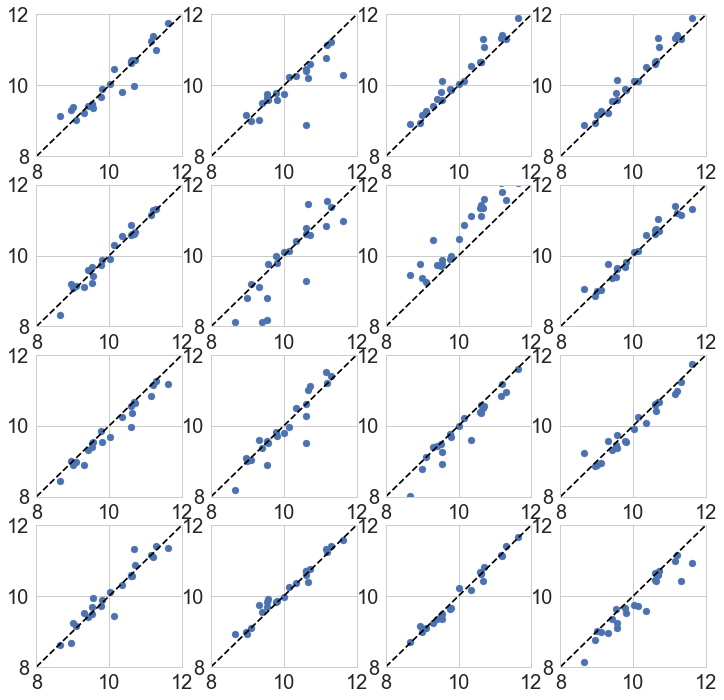

In [23]:
mass_fits_array = np.array(small_cat_mass)
mass_fits_array_lo = np.array(small_cat_mass_lo)
mass_fits_array_hi = np.array(small_cat_mass_hi)

print(mass_fits_array.shape, mass_fits_array_lo.shape, mass_fits_array_hi.shape)

sfr_fits_array = np.array(small_cat_sfr)
sfr_fits_array_lo = np.array(small_cat_sfr_lo)
sfr_fits_array_hi = np.array(small_cat_sfr_hi)

print(sfr_fits_array.shape, sfr_fits_array_lo.shape, sfr_fits_array_hi.shape)

Av_fits_array = np.array(small_cat_Av)
Av_fits_array_lo = np.array(small_cat_Av_lo)
Av_fits_array_hi = np.array(small_cat_Av_hi)

print(Av_fits_array.shape, Av_fits_array_lo.shape, Av_fits_array_hi.shape)

median_mass_fits_small = np.nanmedian(mass_fits_array,axis=1)
print(median_mass_fits_small.shape)


plt.figure(figsize=(12,12))
for i in range(mass_fits_array.shape[1]):
    plt.subplot(4,4,i+1)
    
    plt.scatter(median_mass_fits_small, mass_fits_array[0:,i])
    plt.axis([8,12,8,12])
    plt.plot([8,12],[8,12],'k--')
plt.show()

## individual galaxy plots:

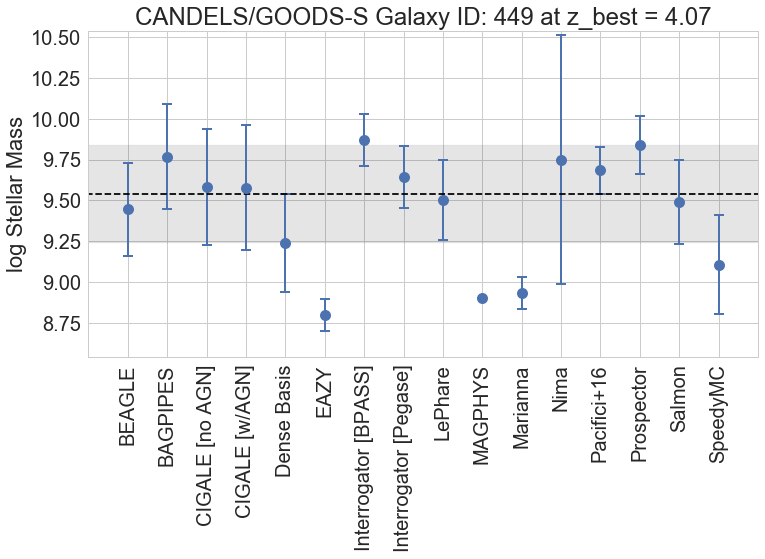

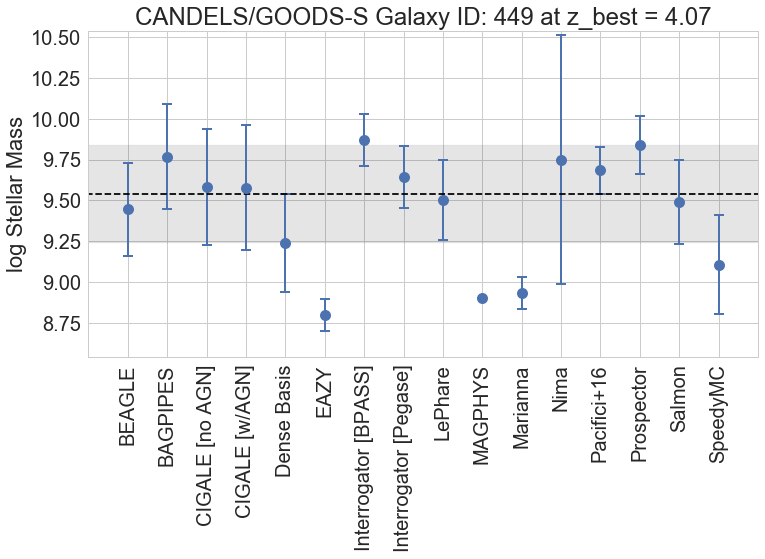

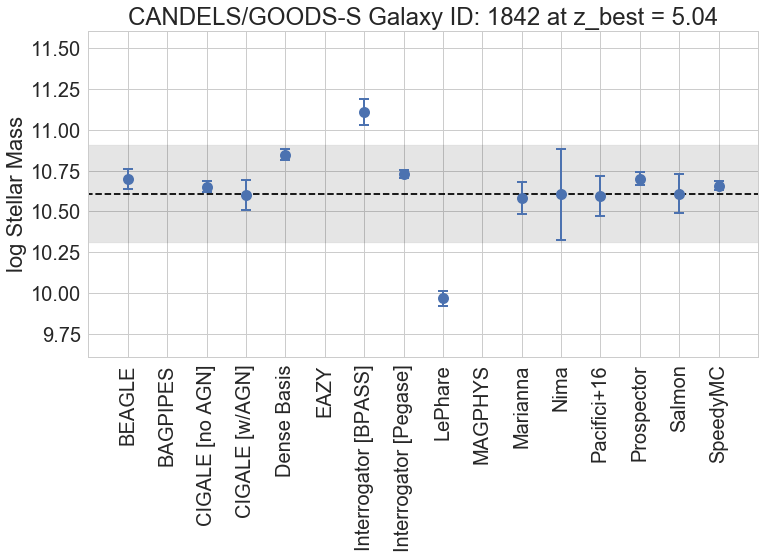

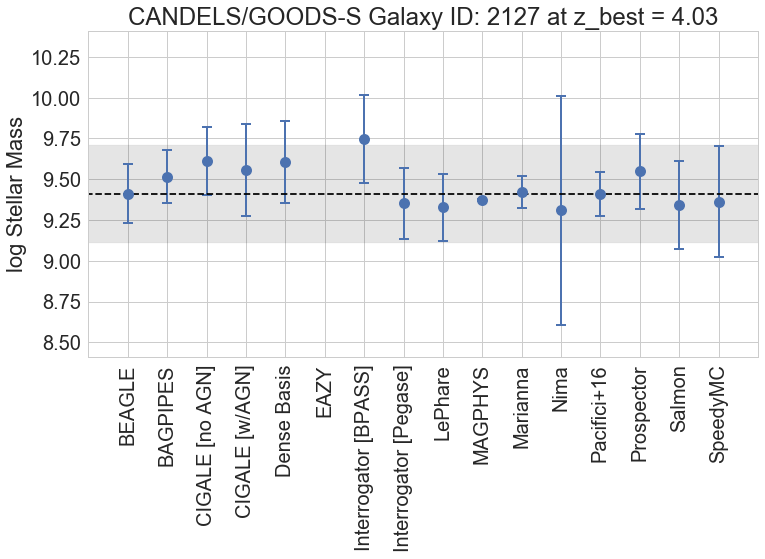

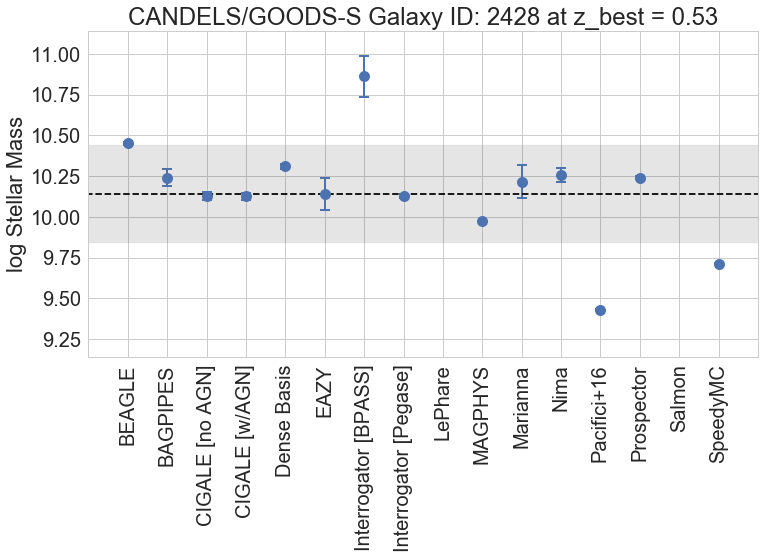

...

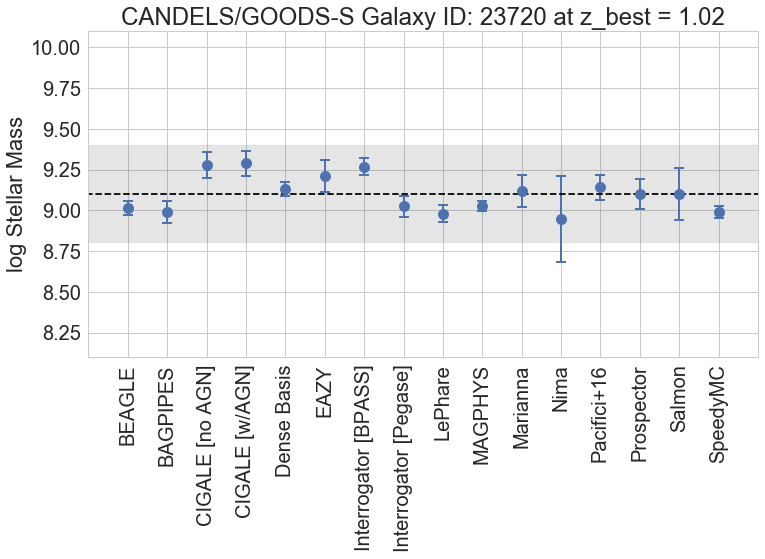

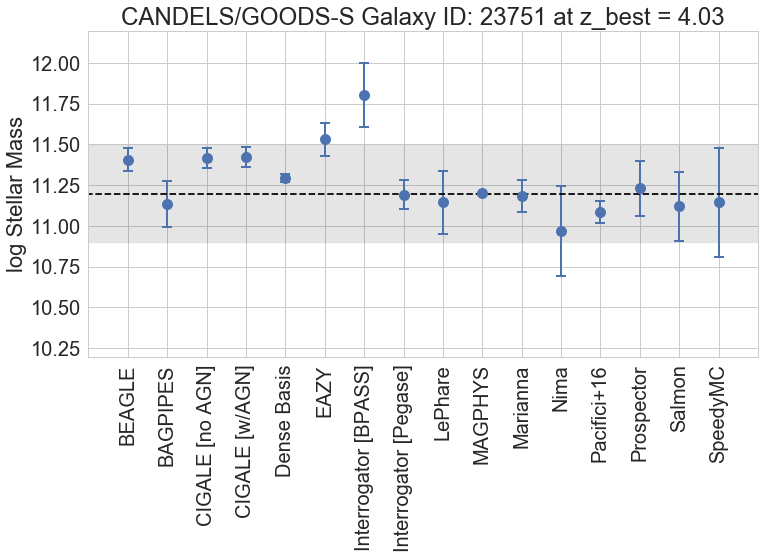

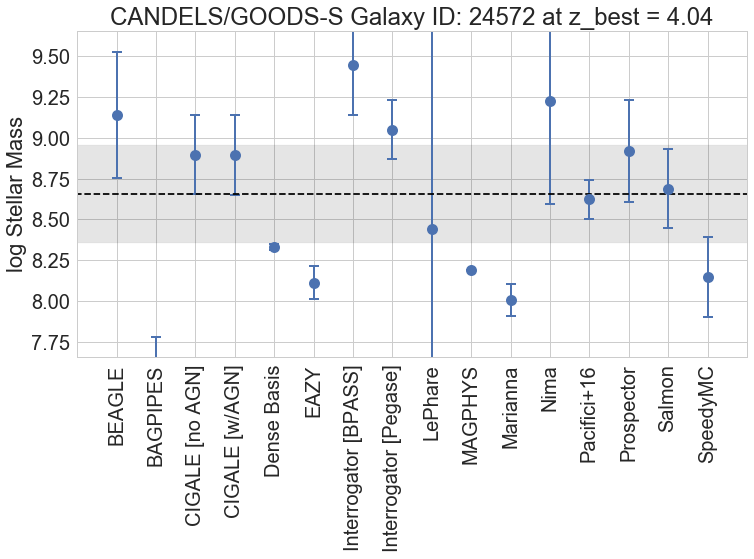

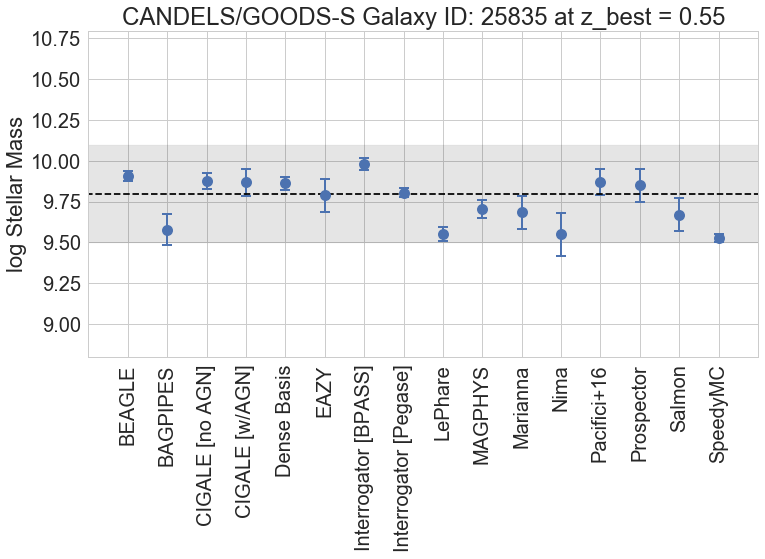

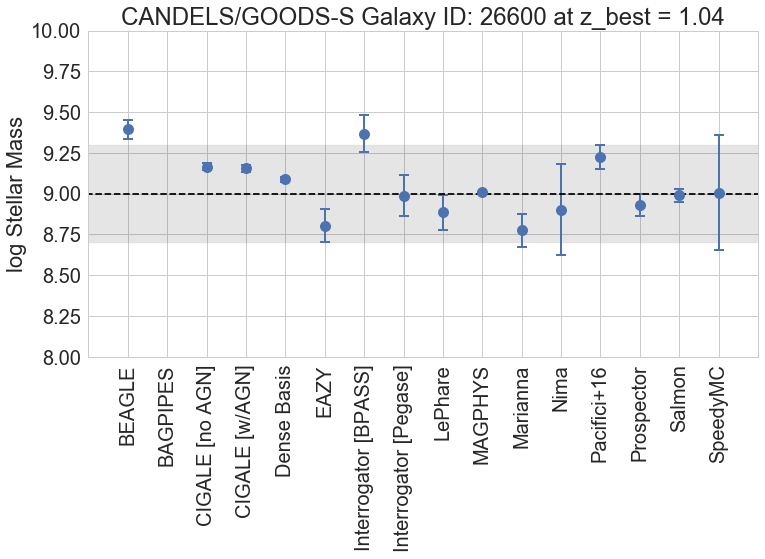

In [33]:
median_mass_fits_small = np.nanmedian(mass_fits_array,axis=1)

code_names = ['BEAGLE','BAGPIPES','CIGALE [no AGN]','CIGALE [w/AGN]','Dense Basis','EAZY','Interrogator [BPASS]','Interrogator [Pegase]','LePhare','MAGPHYS','Marianna','Nima','Pacifici+16','Prospector','Salmon','SpeedyMC']
#code_names = ['BEAGLE','BAGPIPES','CIGALE [no AGN]','CIGALE [w/AGN]','Dense Basis','EAZY','Interrogator [BPASS]','Interrogator [Pegase]','LePhare','MAGPHYS','Marianna','Nima','Pacifici+16','Prospector','Salmon']


for galid in range(len(cat_small_z)):

    median_masses_galid = median_mass_fits_small[galid]

    all_masses_galid = mass_fits_array[galid,0:]
    all_masses_galid_lo = (mass_fits_array[galid,0:] - mass_fits_array_lo[galid,0:])
    all_masses_galid_hi = (mass_fits_array_hi[galid,0:] - mass_fits_array[galid,0:])

    plt.figure(figsize=(12,6))
    plt.fill_between([-2,18],[median_masses_galid-0.3,median_masses_galid-0.3],
                     [median_masses_galid+0.3,median_masses_galid+0.3],color='k',alpha=0.1)
    
    plt.errorbar(np.arange(16),all_masses_galid,yerr=np.abs(all_masses_galid_lo,all_masses_galid_hi),
                lw=0,elinewidth=2,capsize=5,marker='o',markersize=9,markeredgewidth=2)
    plt.plot(np.arange(-2,18),np.ones_like(np.arange(-2,18))*median_masses_galid,'k--')
    plt.xticks(np.arange(16),(code_names),rotation=90)
    #plt.ylim(8,12)
    plt.ylim(median_masses_galid - 1, median_masses_galid + 1)
    plt.xlim(-1,16)
    plt.ylabel('log Stellar Mass')
    plt.title('CANDELS/GOODS-S Galaxy ID: '+str(cat_small_ids[galid].astype(int)+1)+' at z_best = %.2f' %cat_small_z[galid])
    
    gid_small = (cat_small_ids[galid].astype(int)+1)
    fname = 'figures/gal_id_'+str(gid_small)+'_stellar_mass_comparison.png'
    plt.savefig(fname, bbox_inches='tight')
    plt.show()


## 3d plots of M*,SFR, Av

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


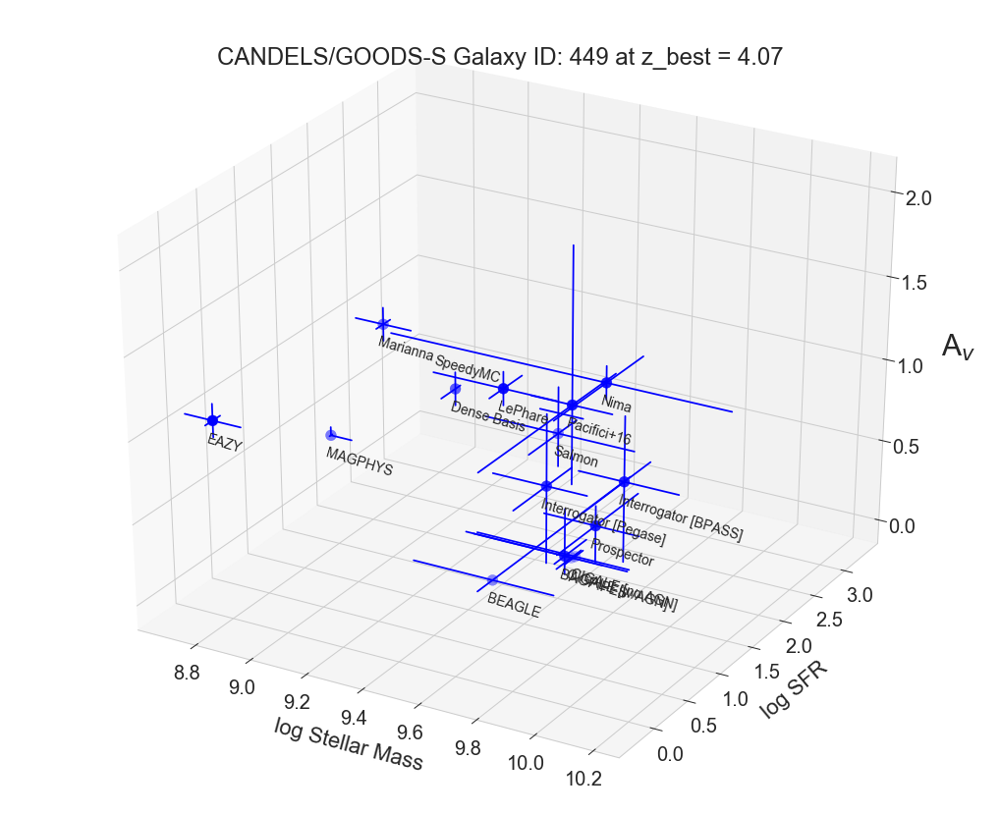

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


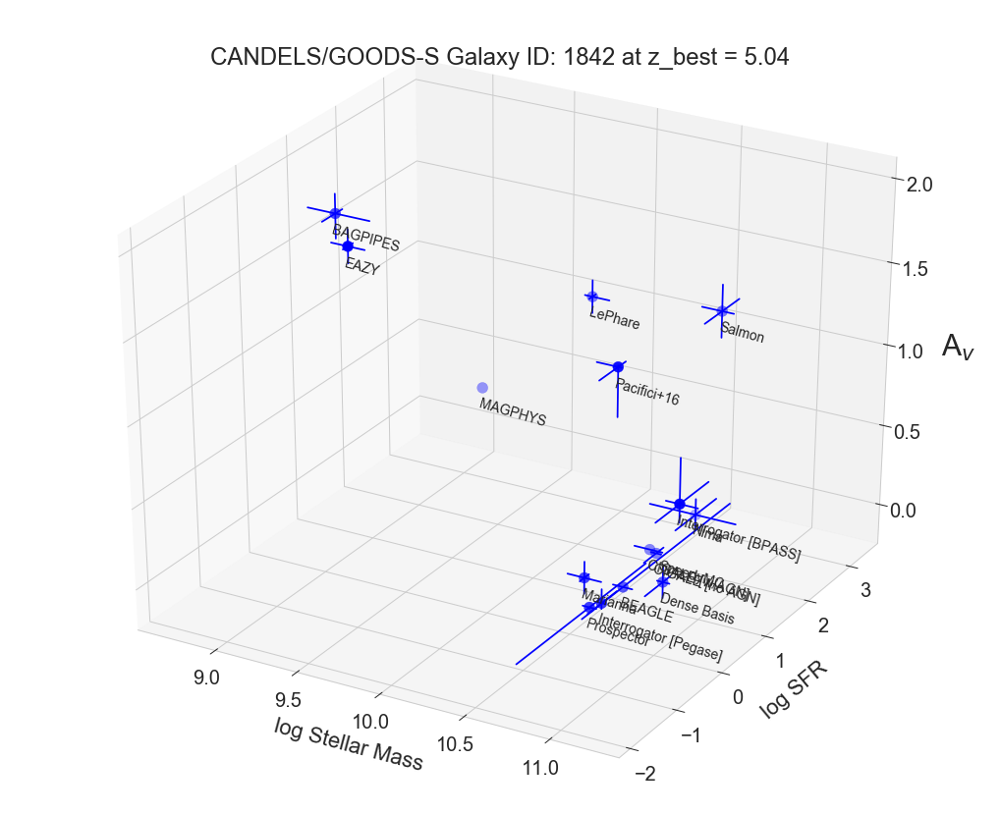

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


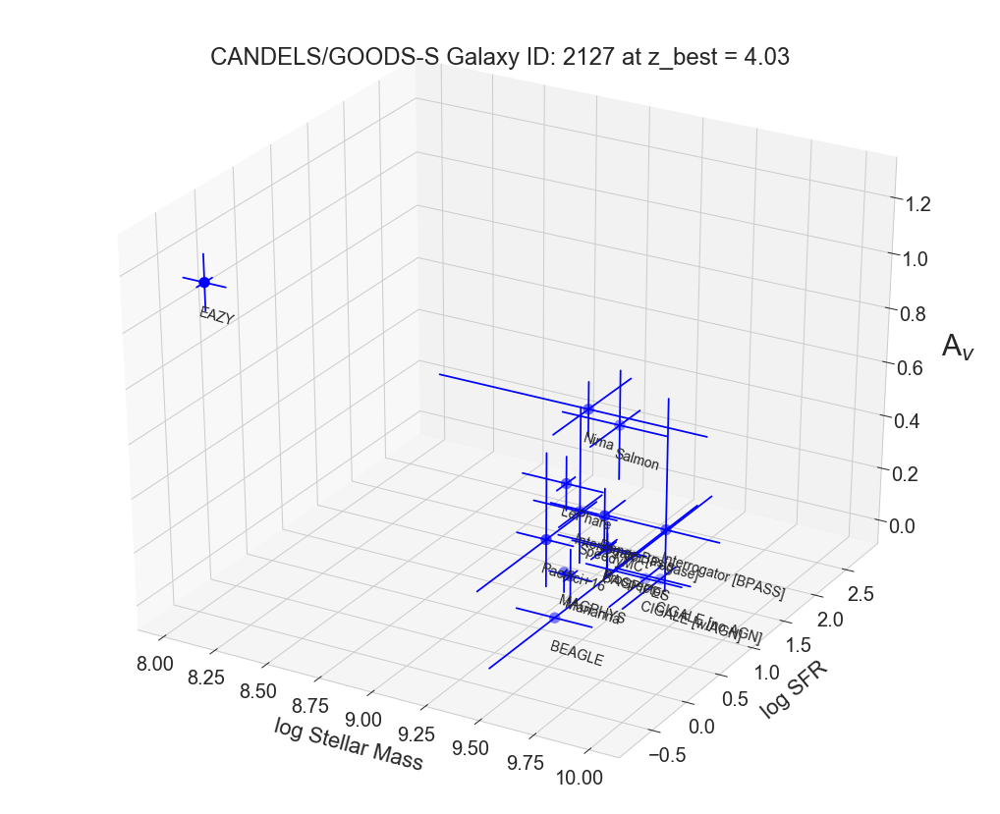

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True False  True]


C:\Users\proto\Anaconda3\lib\site-packages\mpl_toolkits\mplot3d\proj3d.py:141: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


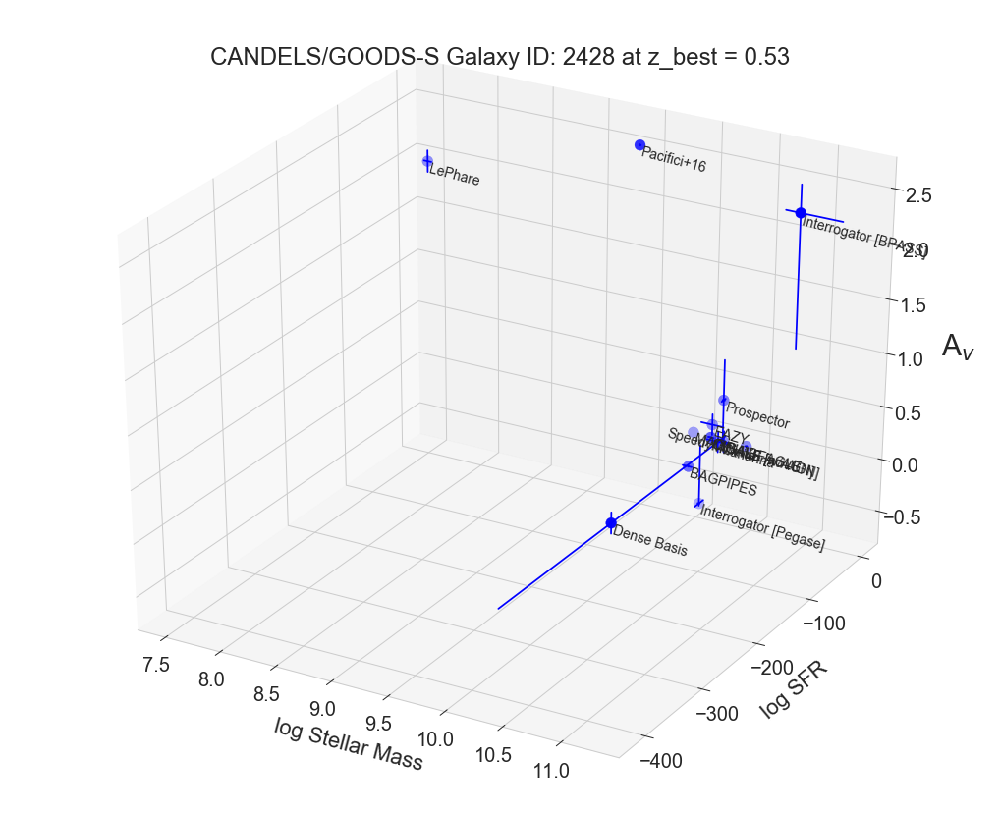

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


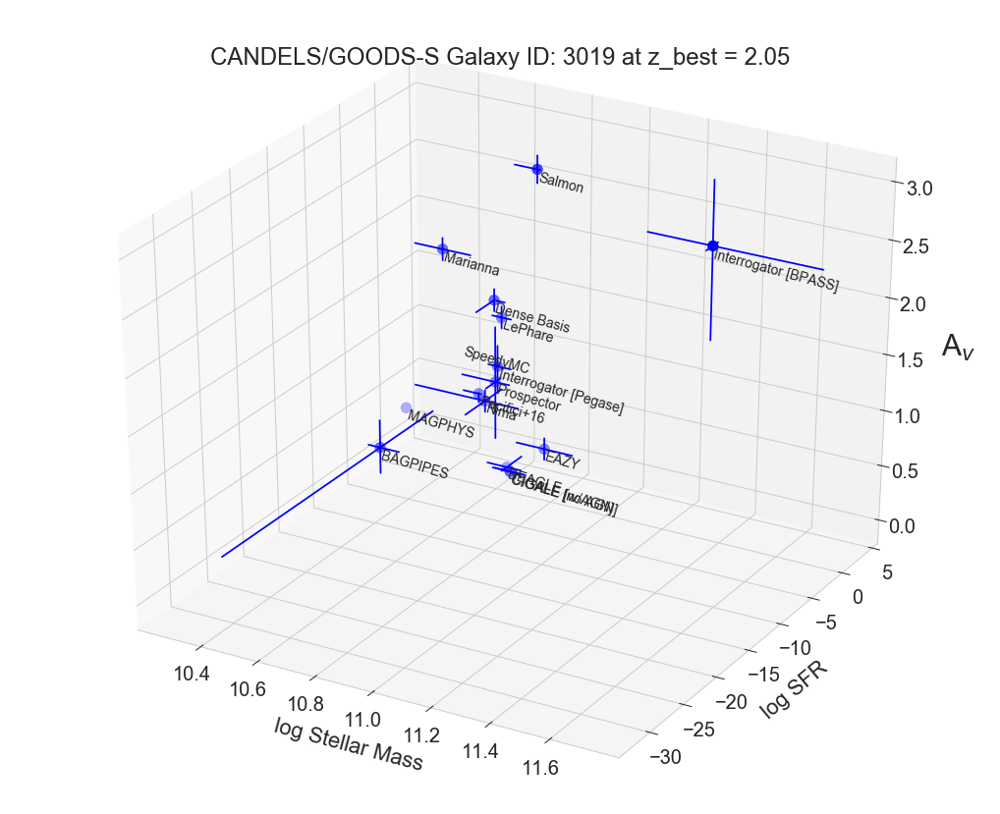

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


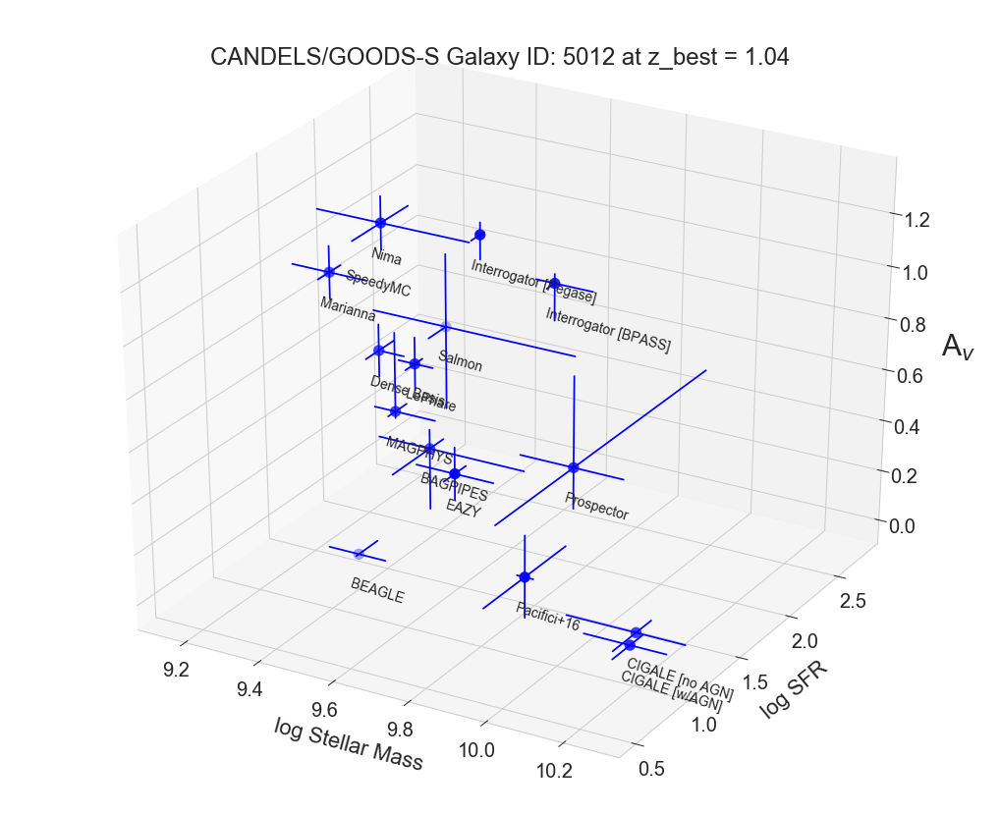

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


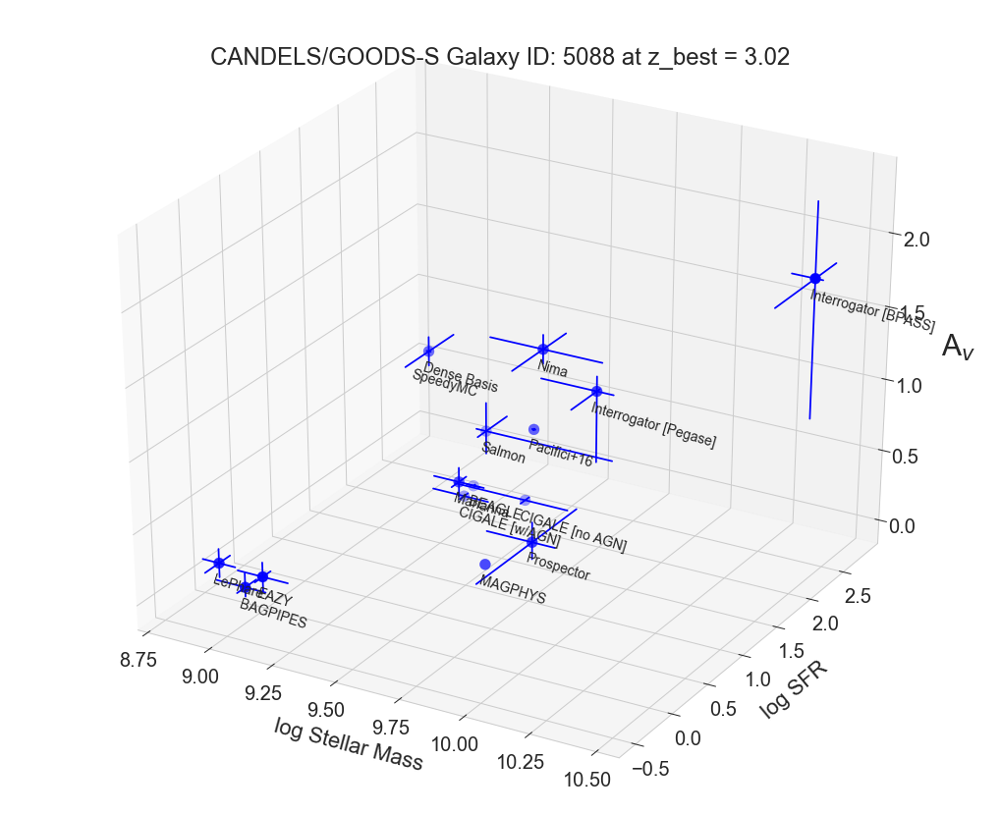

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


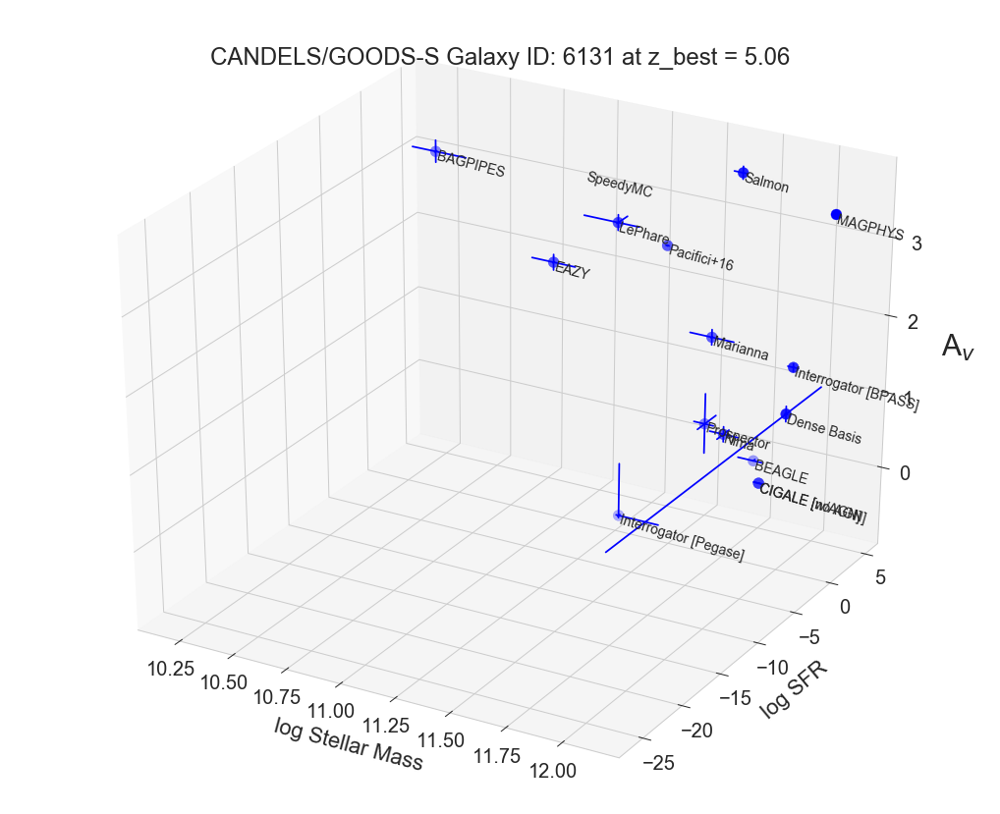

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


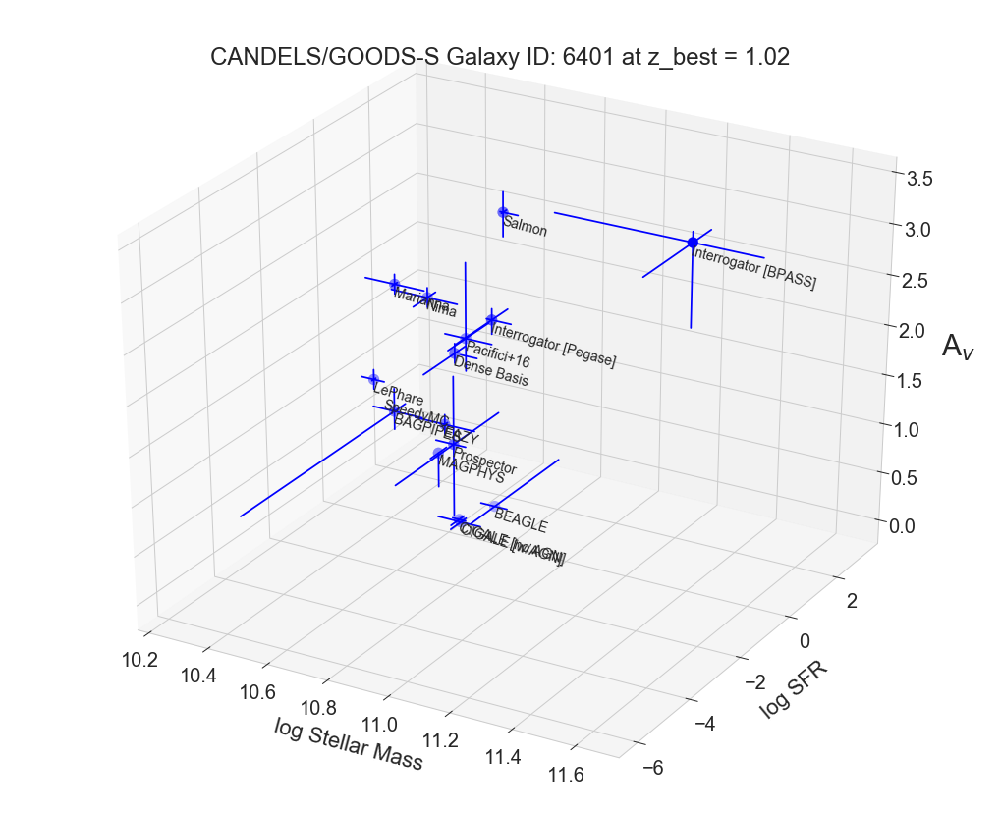

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


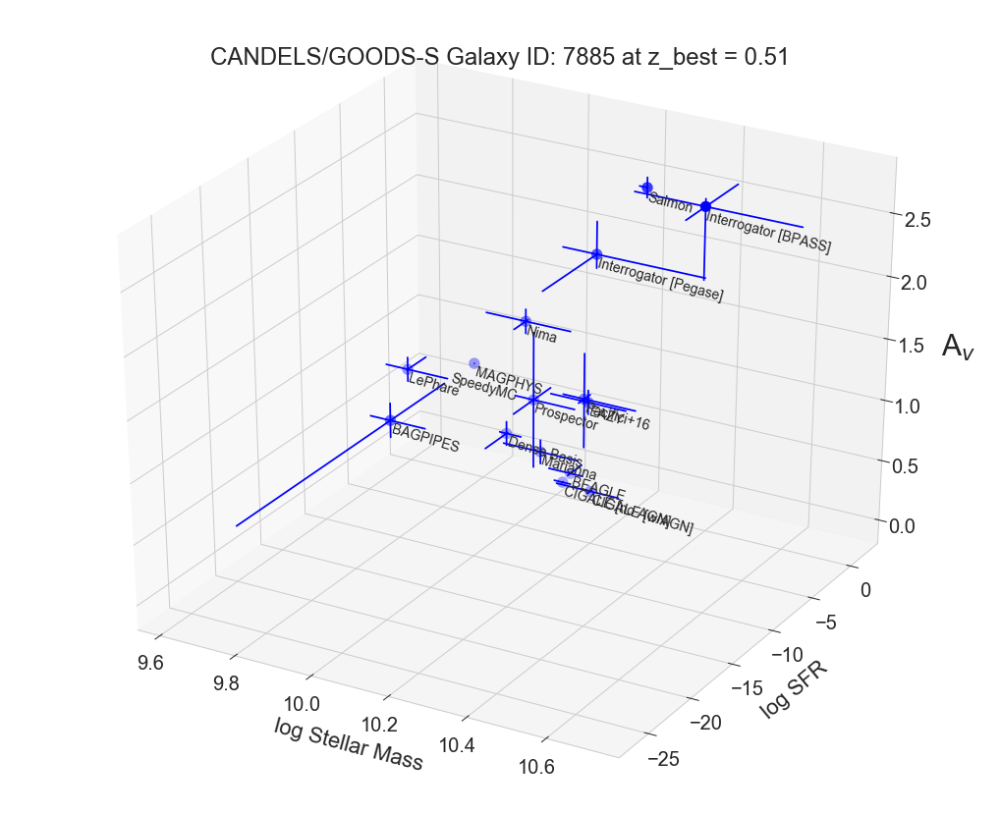

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


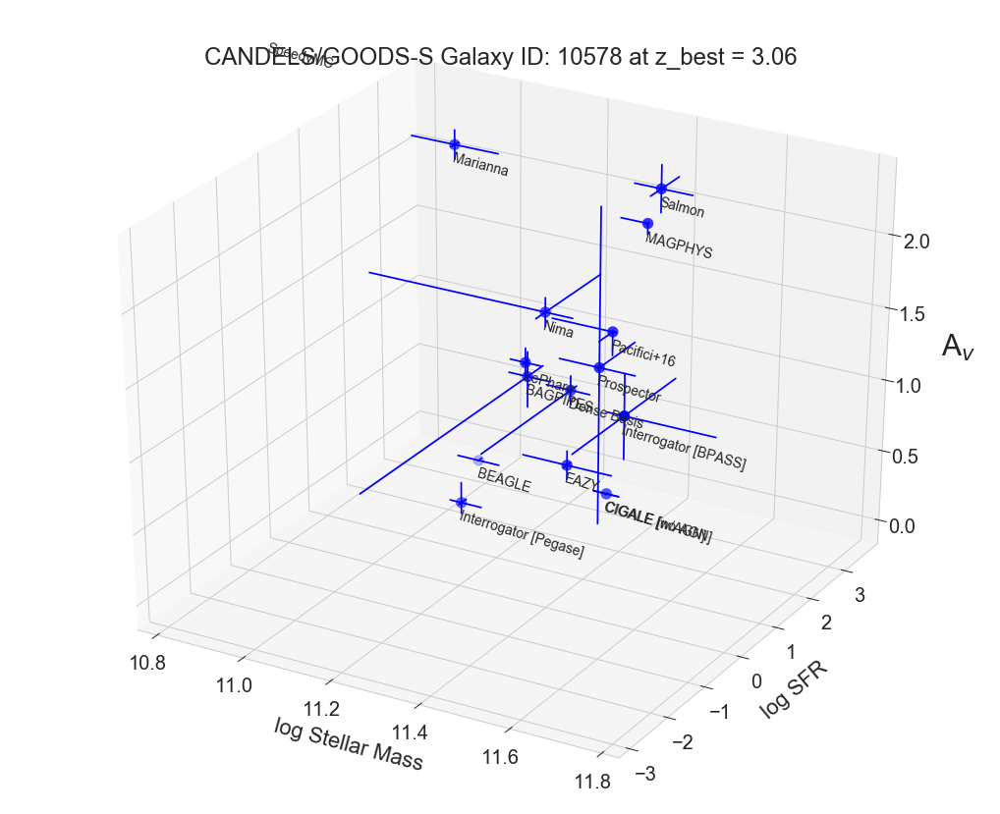

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


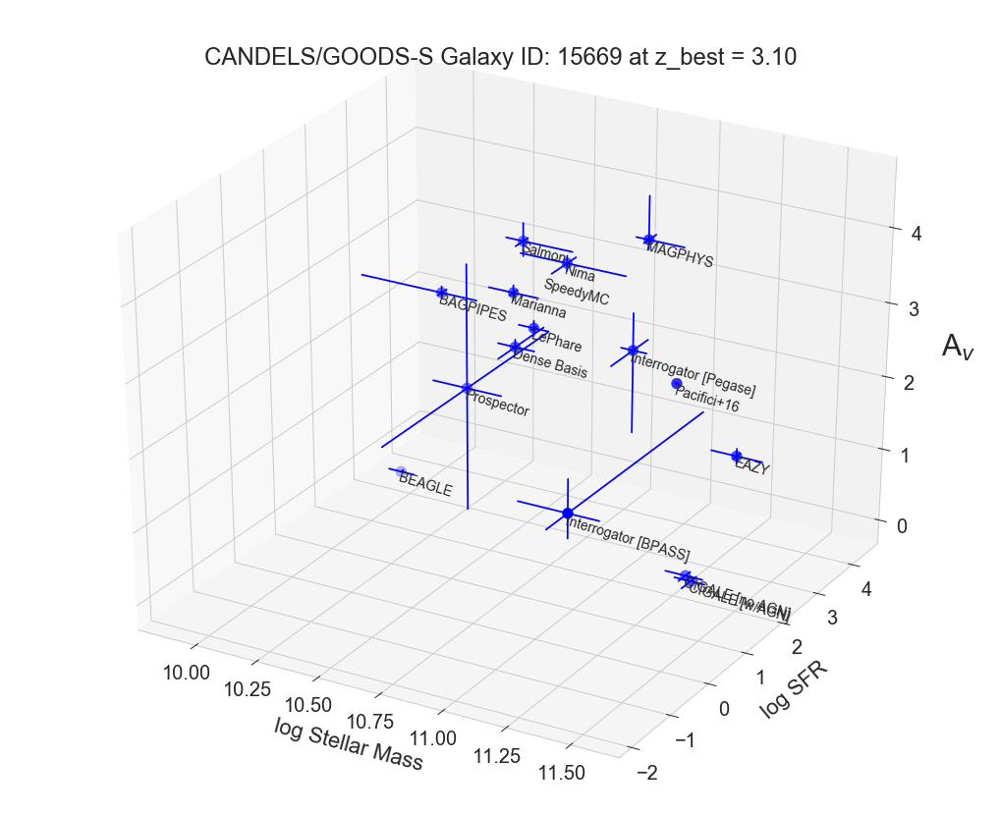

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


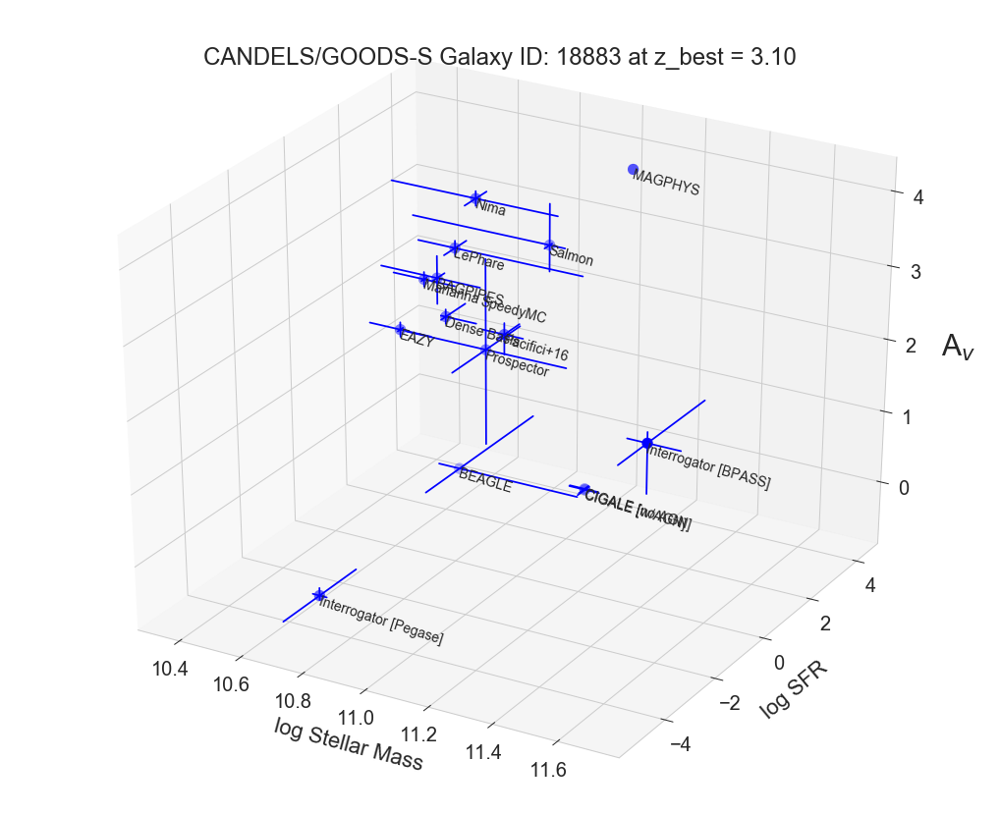

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


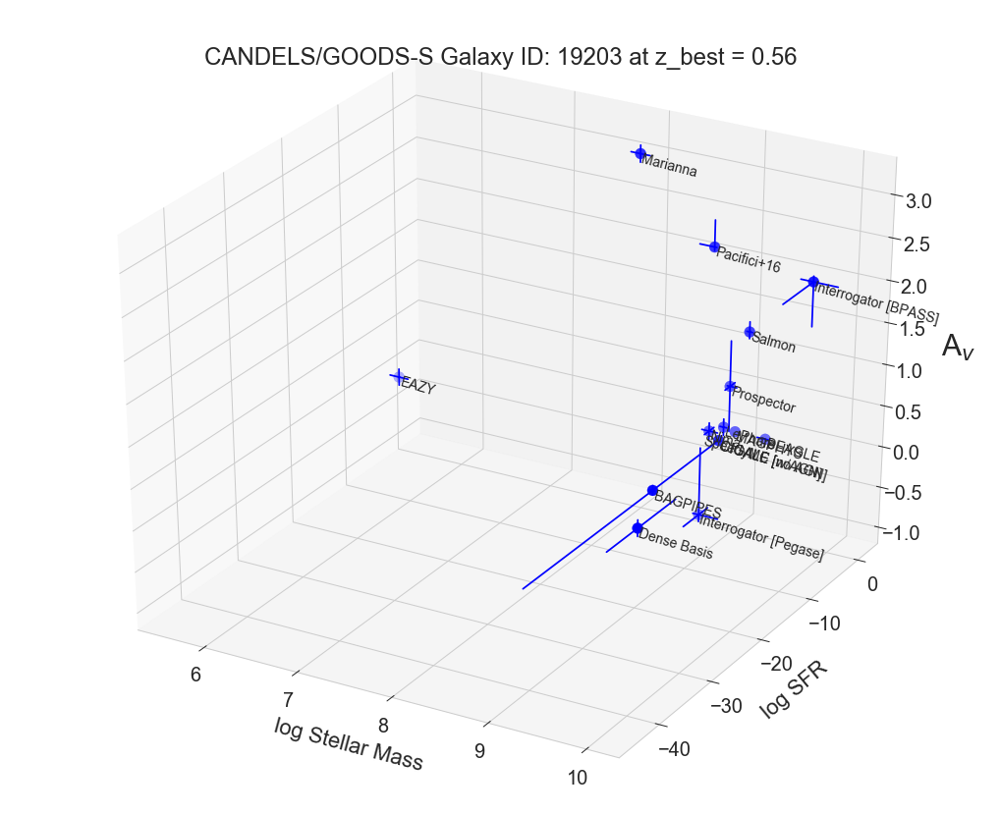

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


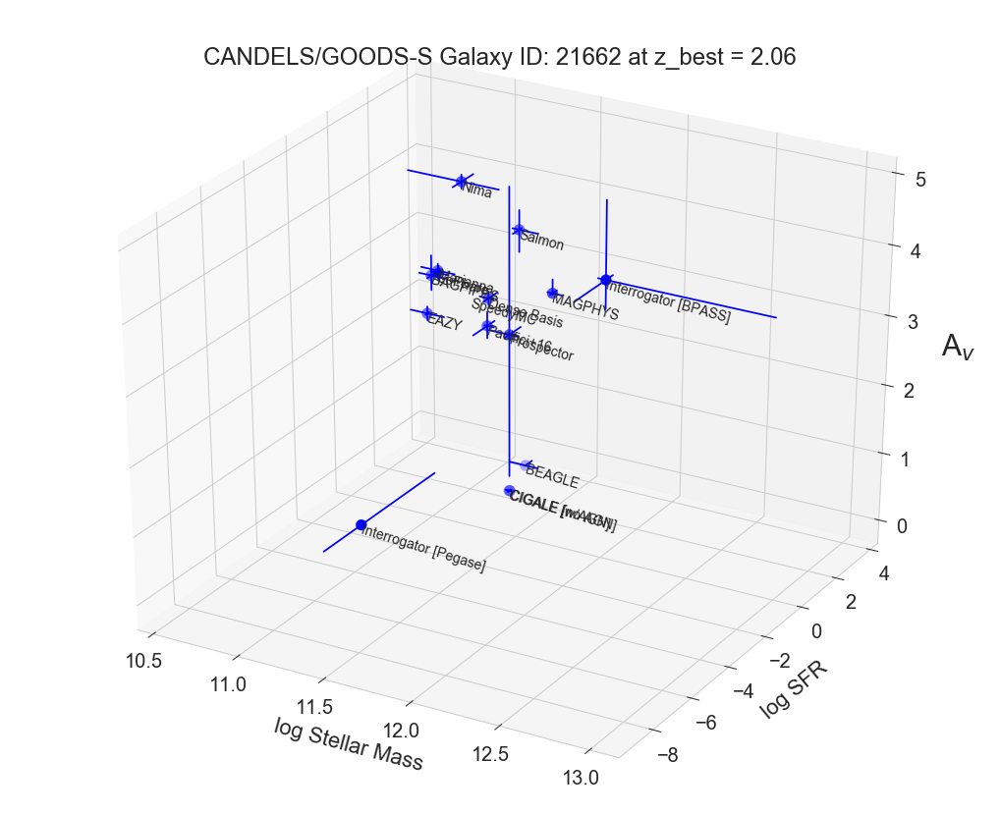

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


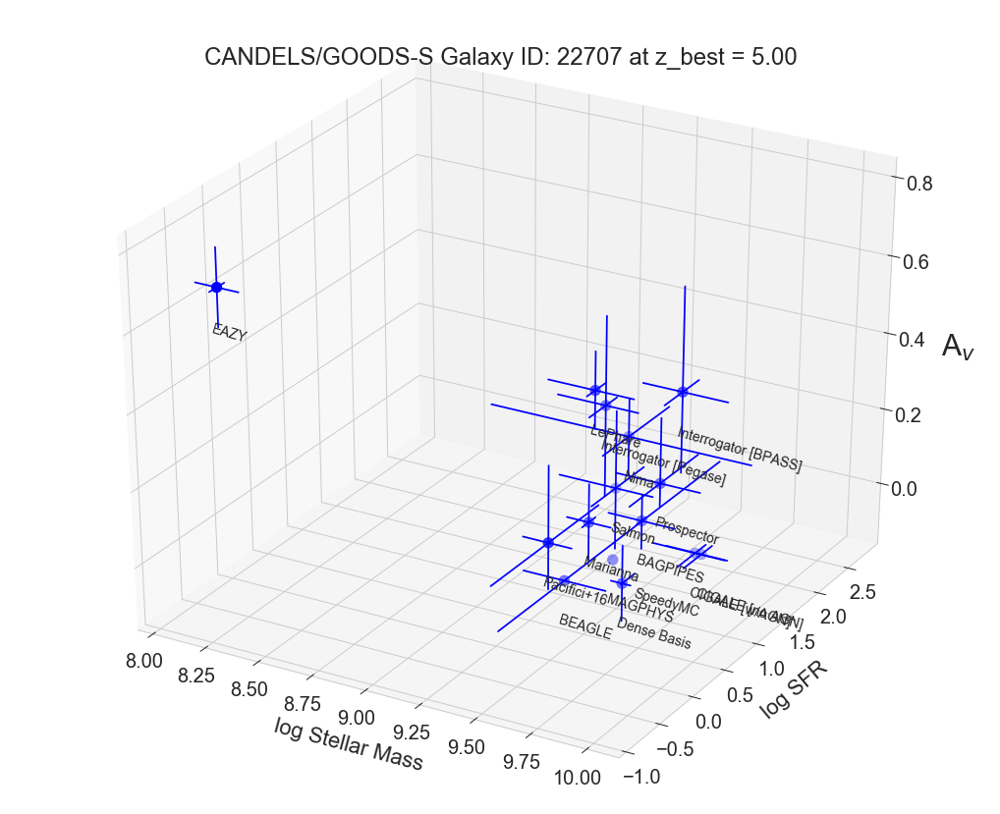

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


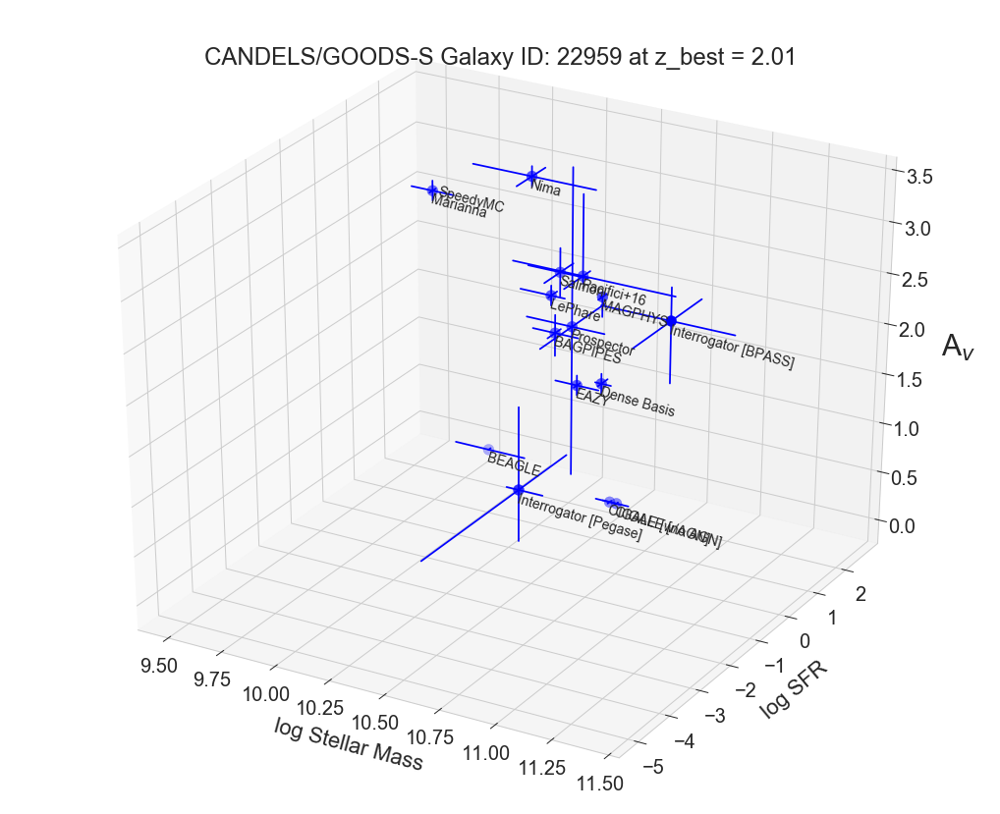

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


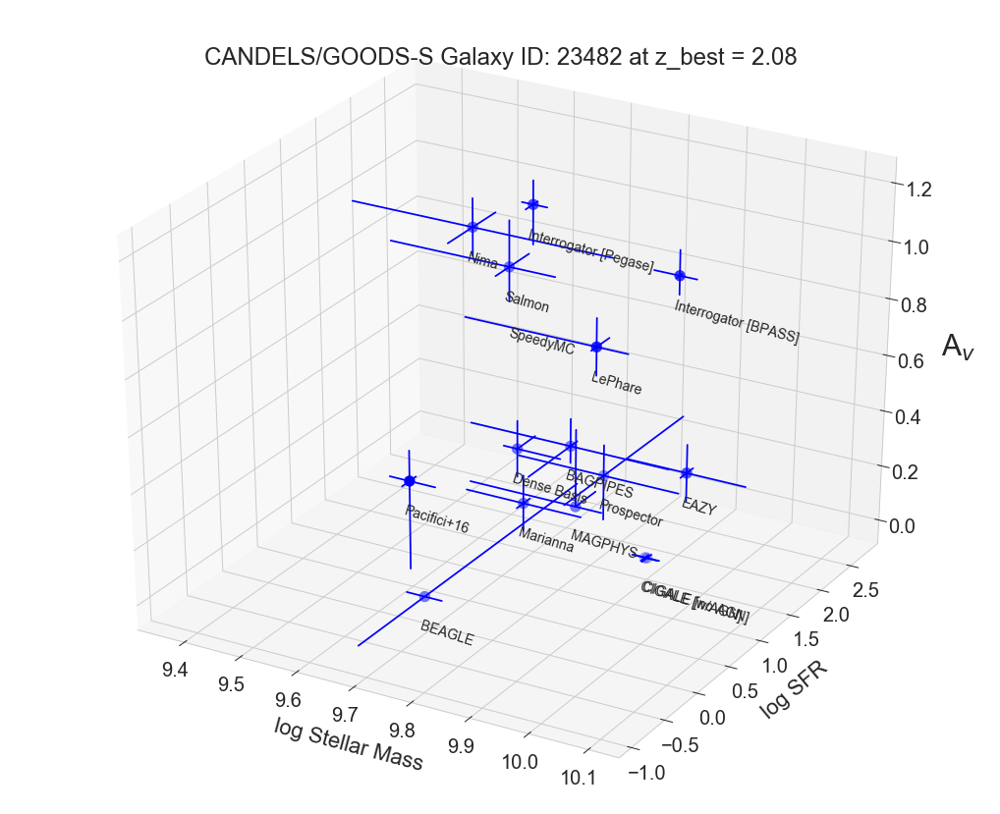

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


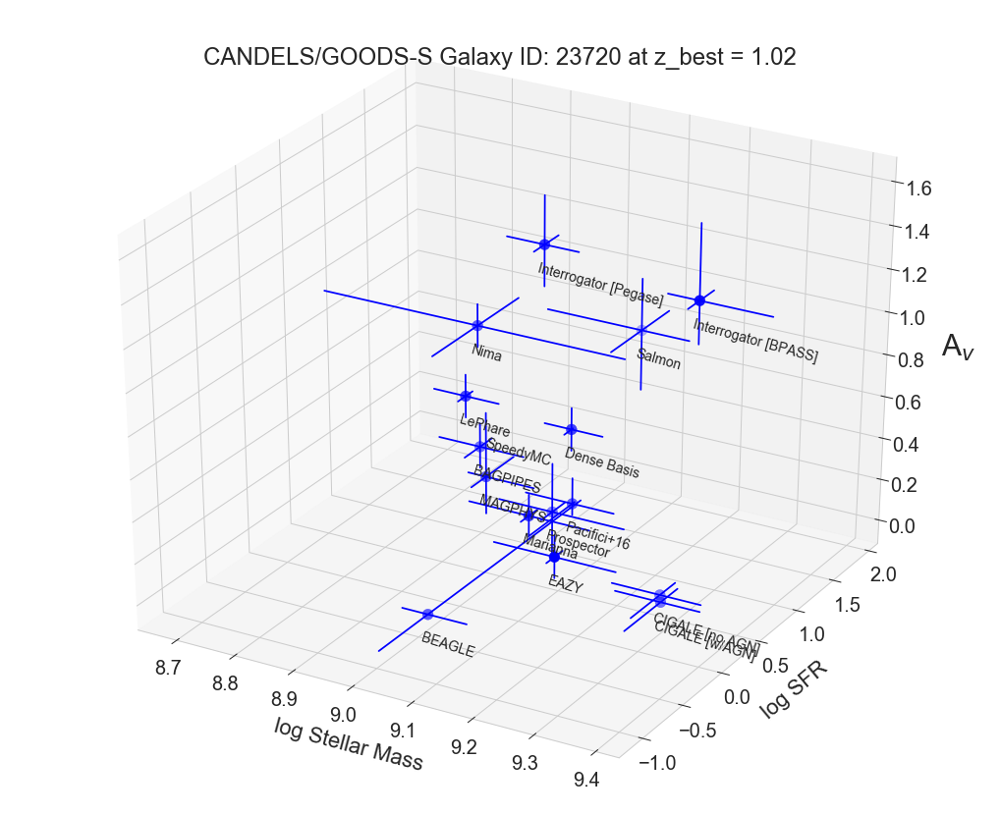

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


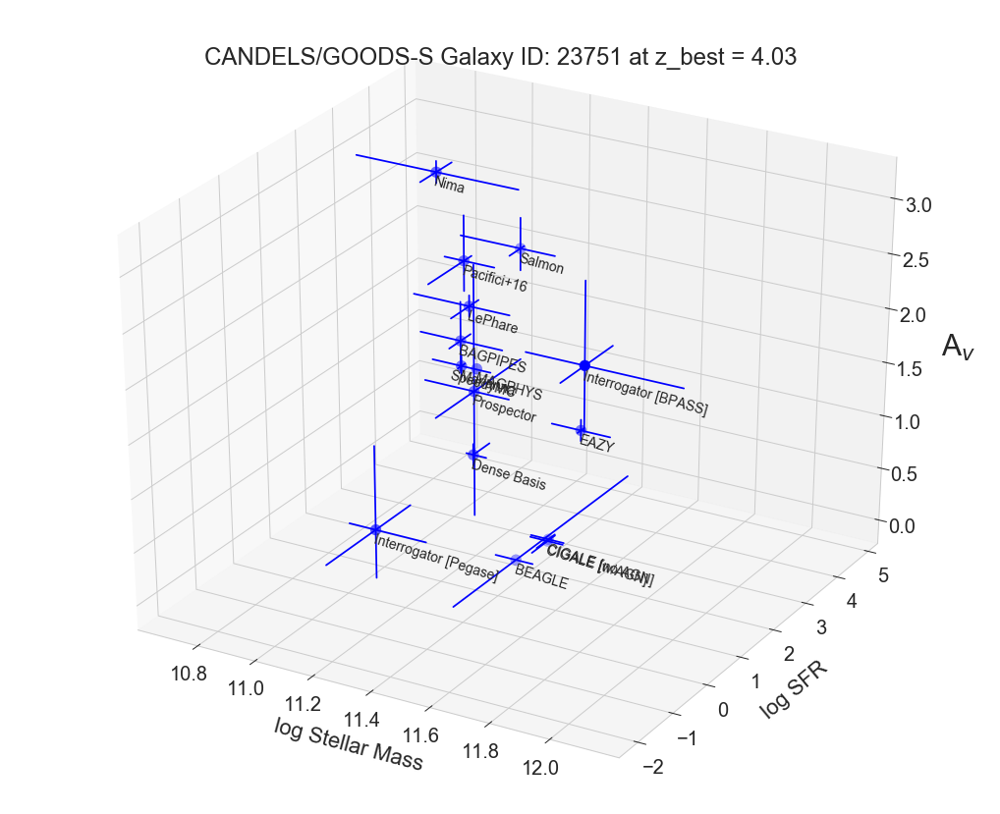

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


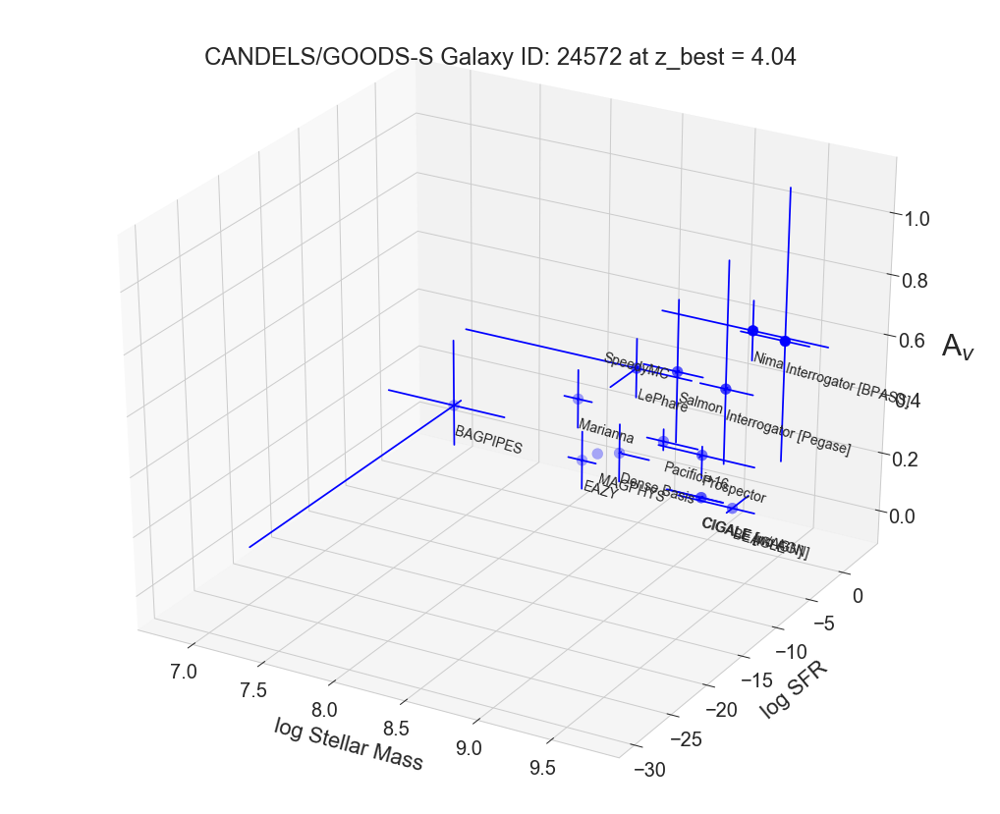

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


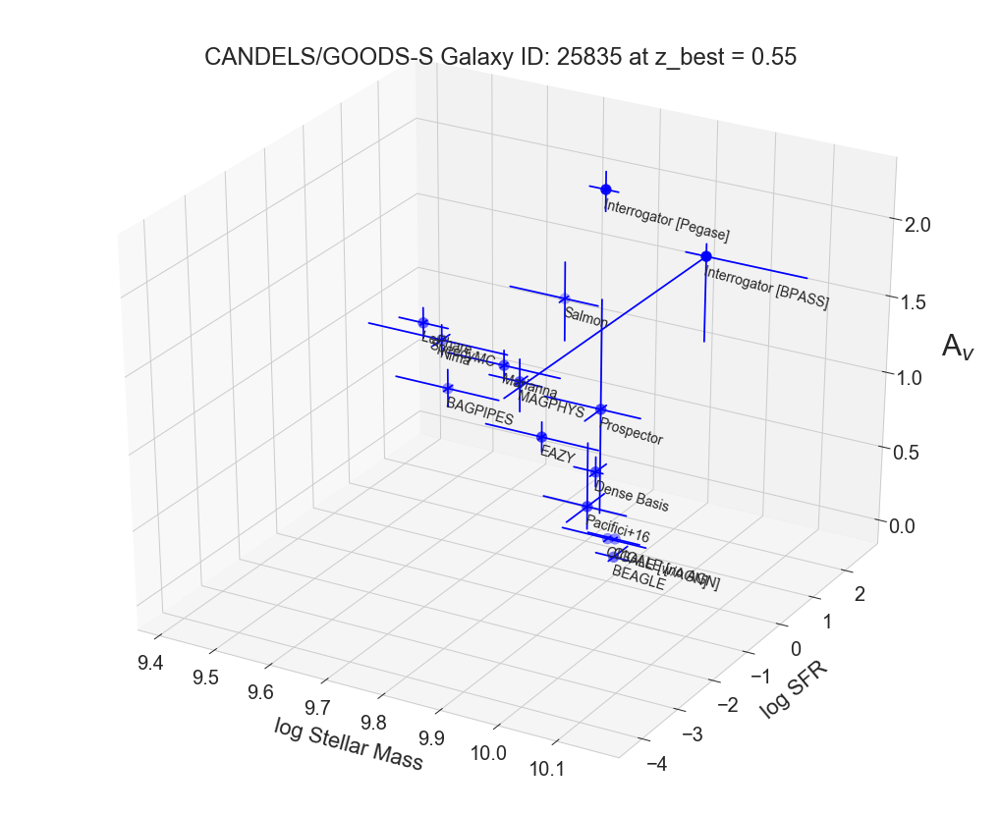

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


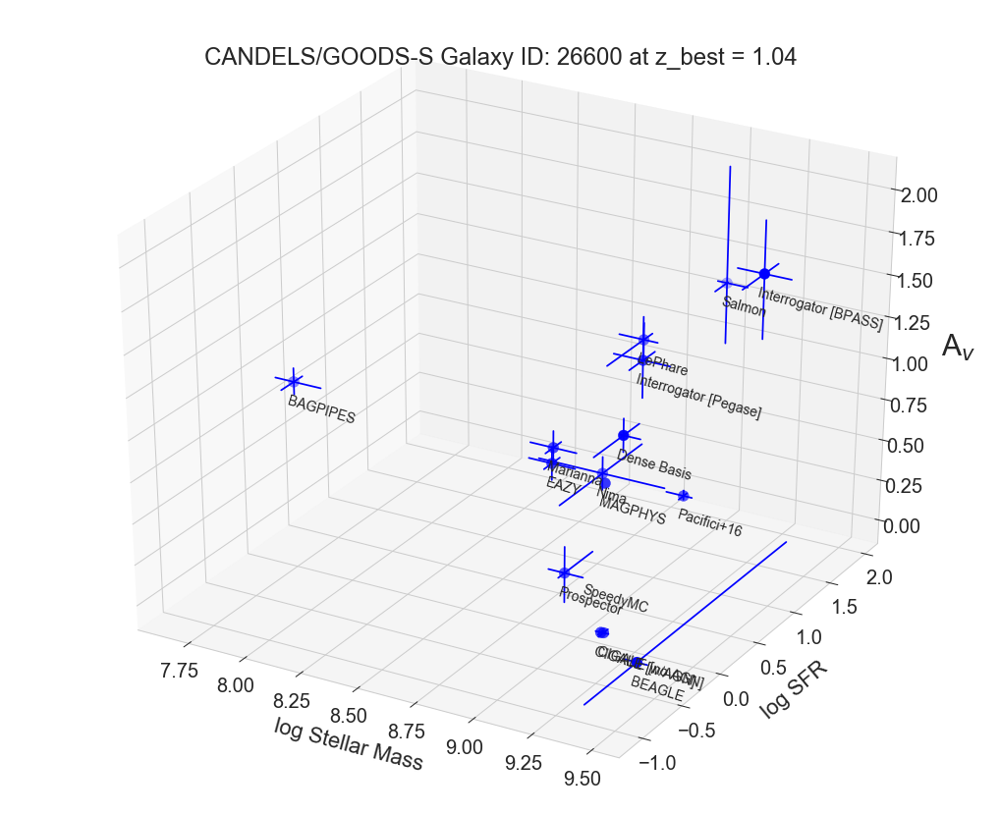

In [35]:
# this plot can be improved, but my python crashes every time I try to set xlim or ylim
# There's also some interesting trends here, it would be nice if someone could improve these plots
# by adding a best-fit line / plane to the points




#code_names = ['BEAGLE','BAGPIPES','CIGALE [no AGN]','CIGALE [w/AGN]','Dense Basis','EAZY','Interrogator [BPASS]','Interrogator [Pegase]','LePhare','MAGPHYS','Marianna','Nima','Pacifici+16','Prospector','Salmon','SpeedyMC']
#code_names = ['BEAGLE','BAGPIPES','CIGALE [no AGN]','CIGALE [w/AGN]','Dense Basis','EAZY','Interrogator [BPASS]','Interrogator [Pegase]','LePhare','MAGPHYS','Marianna','Nima','Pacifici+16','Prospector','Salmon']

for galid in range(len(median_mass_fits_small)):

    median_masses_galid = median_mass_fits_small[galid]

    all_masses_galid = mass_fits_array[galid,0:]
    all_masses_galid_lo = (mass_fits_array[galid,0:] - mass_fits_array_lo[galid,0:])
    all_masses_galid_hi = (mass_fits_array_hi[galid,0:] - mass_fits_array[galid,0:])

    all_sfrs_galid = sfr_fits_array[galid,0:]
    all_sfrs_galid_lo = np.abs(sfr_fits_array[galid,0:] - sfr_fits_array_lo[galid,0:])
    all_sfrs_galid_hi = np.abs(sfr_fits_array_hi[galid,0:] - sfr_fits_array[galid,0:])

    all_Av_galid = Av_fits_array[galid,0:]
    all_Av_galid_lo = np.abs(Av_fits_array[galid,0:] - Av_fits_array_lo[galid,0:])
    all_Av_galid_hi = np.abs(Av_fits_array_hi[galid,0:] - Av_fits_array[galid,0:])
    
    good_values_mask = (~np.isnan(all_masses_galid)) & (~np.isnan(all_sfrs_galid)) & ((~np.isnan(all_Av_galid)))
    print(good_values_mask)

    fig, ax = plt.subplots(1, 1,figsize=(18,15), subplot_kw={'projection':'3d'})
    plt.title('CANDELS/GOODS-S Galaxy ID: '+str(cat_small_ids[galid].astype(int)+1)+' at z_best = %.2f' %cat_small_z[galid])
    ax.scatter(all_masses_galid[0:-1], all_sfrs_galid[0:-1], all_Av_galid[0:-1], s=120, c='b', zorder=10)
    for i in np.arange(0,len(all_masses_galid)-1):
        if (good_values_mask[i] == True):
            ax.plot([all_masses_galid[i]+all_masses_galid_hi[i],all_masses_galid[i]-all_masses_galid_lo[i]], 
                    [all_sfrs_galid[i], all_sfrs_galid[i]], [all_Av_galid[i],all_Av_galid[i]],c='b')
            ax.plot([all_masses_galid[i],all_masses_galid[i]],
                   [all_sfrs_galid[i] + all_sfrs_galid_hi[i],all_sfrs_galid[i] - all_sfrs_galid_lo[i]],
                   [all_Av_galid[i],all_Av_galid[i]],c='b')
            ax.plot([all_masses_galid[i],all_masses_galid[i]],
                   [all_sfrs_galid[i],all_sfrs_galid[i]],
                   [all_Av_galid[i] + all_Av_galid_hi[i],all_Av_galid[i] - all_Av_galid_lo[i]],c='b')

    allvals = np.arange(len(all_masses_galid))
    goodvals = allvals[good_values_mask]
    for i, txt in enumerate(code_names):
        if (good_values_mask[i] == True):
            ax.text(all_masses_galid[i]+0.0,all_sfrs_galid[i]-0.1,all_Av_galid[i]-0.1, txt,fontsize=14,zdir='x')

    ax.set_xlabel('log Stellar Mass',labelpad=20)
    ax.set_ylabel('log SFR',labelpad=20)
    ax.zaxis.set_rotate_label(False) 
    ax.set_zlabel(r'A$_v$', fontsize=30, rotation = 0,labelpad=25)
    #ax.set_ylim(-3,4)
    
    
    gid_small = (cat_small_ids[galid].astype(int)+1)
    fname = 'figures/gal_id_'+str(gid_small)+'_3d_comparison.png'
    plt.savefig(fname, bbox_inches='tight')
    
    plt.show()


In [43]:
print(bagpipes_mass_z3.shape, magphy)

(161,)


# Make Violin plots of all the stellar mass estimates.

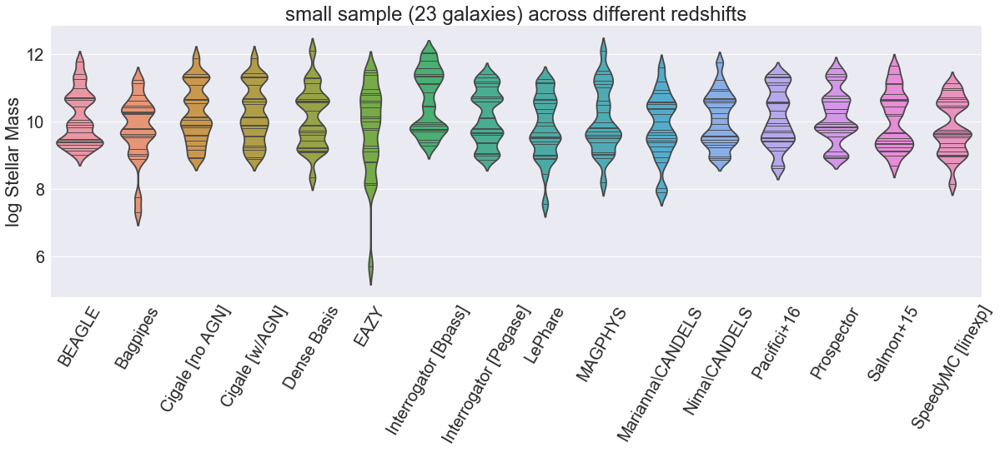

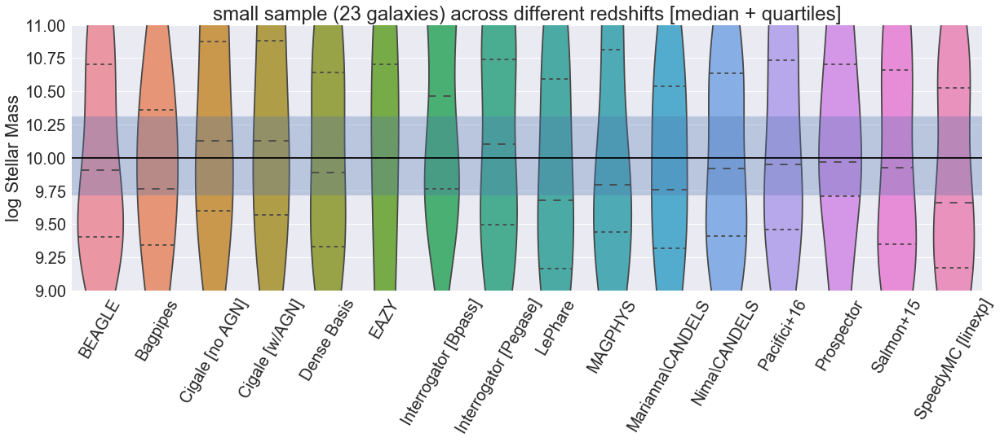

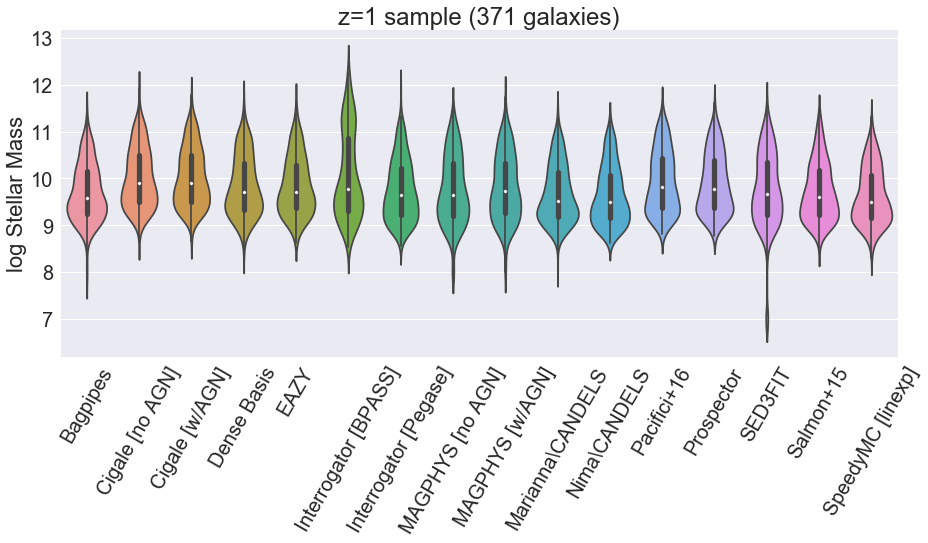

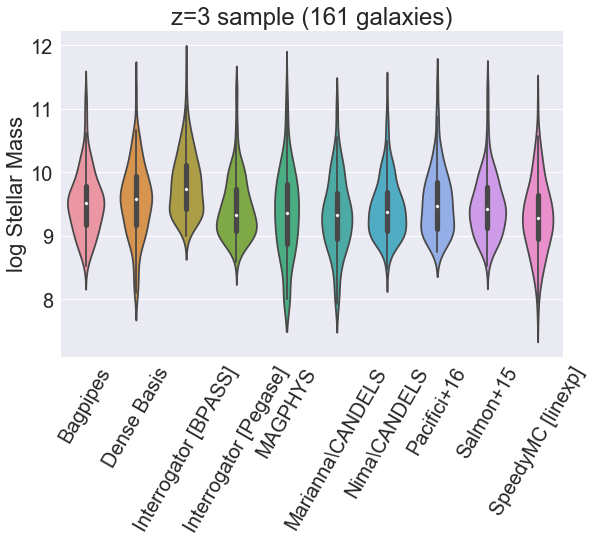

In [163]:
warnings.filterwarnings('ignore')

brett_mass_z1_masked = brett_mass_z1
brett_mass_z1_masked[brett_mass_z1_masked < 0] = np.nan

interrogator_z1_bpass = np.zeros_like(marianna_mass_z1)*np.nan
interrogator_z1_bpass[0:len(interrogator_mass_z1_bpass)] = interrogator_mass_z1_bpass
interrogator_z1_bpass[interrogator_z1_bpass < 0] = np.nan

interrogator_z1_pegase = np.zeros_like(marianna_mass_z1)*np.nan
interrogator_z1_pegase[0:len(interrogator_mass_z1_pegase)] = interrogator_mass_z1_pegase
interrogator_z1_pegase[interrogator_z1_pegase < 0] = np.nan


nima_mass_z1_masked = nima_mass_z1
nima_mass_z1_masked[nima_mass_z1_masked < 0] = np.nan
z1_cat_mass_dict = {'zPhot':marianna_mass_z1, 
               'Nima\CANDELS':nima_mass_z1_masked, 
               'Salmon+15':brett_mass_z1_masked, 
               'MAGPHYS [no AGN]':magphys_mass_z1, 
               'MAGPHYS [w/AGN]':magphys_mass_z1_wagn, 
               'EAZY':eazy_mass_z1, 'SpeedyMC [linexp]':speedy_mass_z1,'Cigale [w/AGN]':cigale_mass_z1_wagn.ravel(), 
               'Cigale [no AGN]':cigale_mass_z1_noagn.ravel(), 'Dense Basis': DB_mass_z1.ravel(), 
               'Pacifici+16': cami_mass_z1.ravel(), 'Prospector': prospector_mass_z1.ravel(),
                'Bagpipes': bagpipes_mass_z1, 'SED3FIT':sed3fit_mass_z1,
                'Interrogator [BPASS]':interrogator_z1_bpass.ravel(), 'Interrogator [Pegase]':interrogator_z1_pegase.ravel()}
z1_cat_mass = pd.DataFrame(data=z1_cat_mass_dict)



brett_mass_z3_masked = brett_mass_z3
brett_mass_z3_masked[brett_mass_z3_masked < 0] = np.nan

interrogator_z3_bpass = np.zeros_like(marianna_mass_z3)*np.nan
interrogator_z3_bpass[0:len(interrogator_mass_z3_bpass)] = interrogator_mass_z3_bpass

interrogator_z3_pegase = np.zeros_like(marianna_mass_z3)*np.nan
interrogator_z3_pegase[0:len(interrogator_mass_z3_bpass)] = interrogator_mass_z3_pegase


nima_mass_z3_masked = nima_mass_z3
nima_mass_z3_masked[nima_mass_z3_masked < 0] = np.nan
z3_cat_mass_dict = {'Marianna\CANDELS':marianna_mass_z3, 
               'Nima\CANDELS':nima_mass_z3_masked, 'Salmon+15':brett_mass_z3_masked, 'MAGPHYS':magphys_mass_z3, 
                    'Bagpipes': bagpipes_mass_z3, 'Dense Basis': DB_mass_z3.ravel(), 'Pacifici+16': cami_mass_z3.ravel(),
                   'Interrogator [BPASS]':interrogator_z3_bpass.ravel(), 'Interrogator [Pegase]':interrogator_z3_pegase.ravel(),
                   'SpeedyMC [linexp]':speedy_mass_z3}
z3_cat_mass = pd.DataFrame(data=z3_cat_mass_dict)

sns.set(font_scale=2)




plt.figure(figsize=(20,6))
ax = sns.violinplot(data=small_cat_mass, orient='v',inner='stick',bw=0.2)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60)
ax.set_ylabel('log Stellar Mass')
#ax.set_ylim(8,11)
ax.set_title('small sample (23 galaxies) across different redshifts')
fname = 'figures/small_sample_Mstar_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()


plt.figure(figsize=(20,6))
ax = sns.violinplot(data=small_cat_mass, orient='v',inner='quartile')
ax.set_xticklabels(ax.get_xticklabels(),rotation=60)
plt.plot([-20,20],[10,10],'k-')
plt.fill_between([-20,20], [np.median(median_mass_fits_small)+0.3,np.median(median_mass_fits_small)+0.3], 
                 [np.median(median_mass_fits_small)-0.3,np.median(median_mass_fits_small)-0.3], alpha=0.3)

#plt.plot([-20,20],[10.3,10.3],'k:')
#plt.plot([-20,20],[9.7,9.7],'k:')
ax.set_ylim(9,11)
ax.set_ylabel('log Stellar Mass')
ax.set_title('small sample (23 galaxies) across different redshifts [median + quartiles]')
fname = 'figures/small_sample_Mstar_all_galaxies_zoomed_in.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()



plt.figure(figsize=(15,6))
ax = sns.violinplot(data=z1_cat_mass, orient='v')
ax.set_xticklabels(ax.get_xticklabels(),rotation=60)
ax.set_ylabel('log Stellar Mass')
ax.set_title('z=1 sample (371 galaxies)')
fname = 'figures/z1_sample_Mstar_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()



plt.figure(figsize=(9,6))
ax = sns.violinplot(data=z3_cat_mass, orient='v')
ax.set_xticklabels(ax.get_xticklabels(),rotation=60)
ax.set_ylabel('log Stellar Mass')
ax.set_title('z=3 sample (161 galaxies)')
fname = 'figures/z3_sample_Mstar_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()

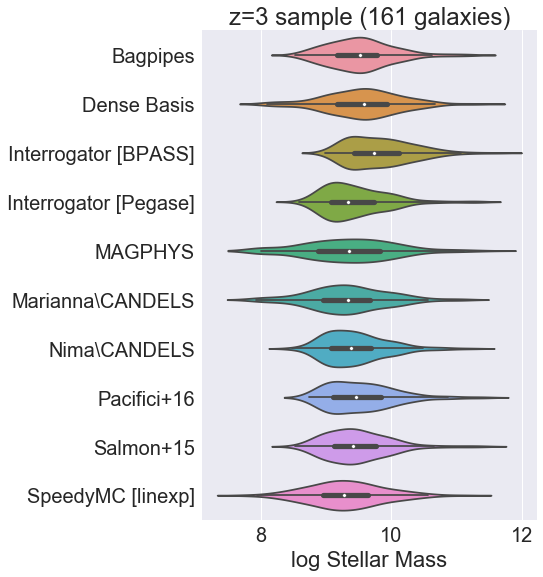

In [182]:

plt.figure(figsize=(6,9))
ax = sns.violinplot(data=z3_cat_mass, orient='h')
ax.set_yticklabels(ax.get_yticklabels(),rotation=0, horizontalalignment='right')
ax.set_xlabel('log Stellar Mass')
ax.set_title('z=3 sample (161 galaxies)')
fname = 'figures/z3_sample_Mstar_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()

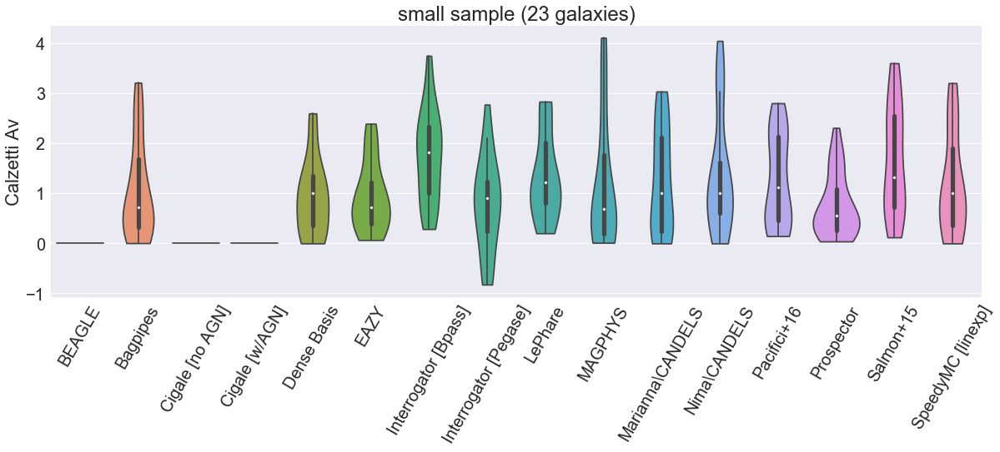

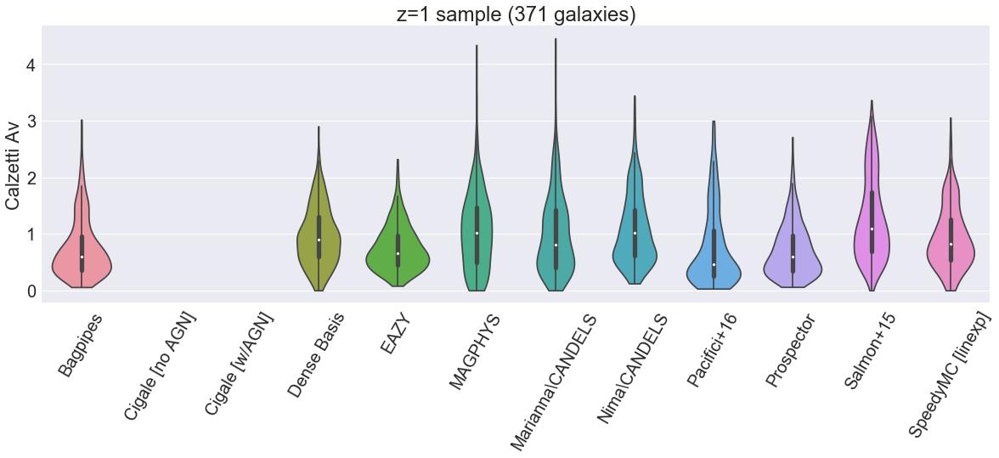

In [181]:
plt.figure(figsize=(20,6))
ax = sns.violinplot(data=small_cat_Av, orient='v',cut=0)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60)
ax.set_ylabel('Calzetti Av')
ax.set_title('small sample (23 galaxies)')
fname = 'figures/small_sample_Av.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()


plt.figure(figsize=(20,6))
ax = sns.violinplot(data=z1_cat_Av, orient='v',cut=0)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60)
ax.set_ylabel('Calzetti Av')
ax.set_title('z=1 sample (371 galaxies)')
fname = 'figures/z1_sample_Av.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()


# Here's the table with all the values for reference:

In [108]:
np.array(z3_cat_mass).shape

(161, 7)

In [38]:
small_cat_mass_hi

,BEAGLE,Bagpipes,Cigale [no AGN],Cigale [w/AGN],Dense Basis,EAZY,Interrogator [Bpass],Interrogator [Pegase],LePhare,MAGPHYS,Marianna\CANDELS,Nima\CANDELS,Pacifici+16,Prospector,Salmon+15,SpeedyMC [linexp]
0,9.663102,9.896956,9.776575,9.777669,9.689979,8.896131,10.0604,9.7843,9.68843,8.977,9.032169,10.17960,9.823,9.99,9.76,9.408009
1,10.752647,9.079084,10.681924,10.676458,10.888509,9.383685,11.2164,10.7540,10.06938,9.502,10.681608,10.84760,10.617,10.74,10.68,10.686831
2,9.585372,9.667450,9.752311,9.724493,9.577564,8.218053,9.9924,9.5261,9.49833,9.372,9.522097,9.85545,9.533,9.73,9.56,9.701958
3,10.460159,10.268476,10.148355,10.148249,10.313399,10.240348,11.2240,10.1341,7.58400,9.972,10.316430,10.29380,9.434,10.25,10.17,9.715397
4,10.686296,10.486225,10.708404,10.718252,10.624314,10.886249,11.7247,10.6487,10.58407,10.280,10.487034,10.69310,10.560,10.65,10.68,10.472987
5,9.441481,9.824628,10.260808,10.246202,9.482187,9.859003,9.8661,9.6195,9.58123,9.607,9.350908,9.60116,9.970,10.04,9.71,9.302933
6,9.235424,9.118932,9.600949,9.322970,9.107062,9.214402,10.4667,9.8392,8.96049,9.592,9.487923,9.80040,9.534,9.83,9.74,9.027681
7,11.806963,10.442645,11.908968,11.909185,12.110662,11.070125,12.0579,11.4974,11.26178,12.090,11.702711,11.81200,11.344,11.63,11.67,10.950585
8,10.751319,10.557012,10.685890,10.744415,10.690673,10.717645,11.6378,10.8110,10.40212,10.620,10.462482,10.52090,10.662,10.74,10.69,10.439249
9,10.066863,9.858115,10.063680,10.199189,9.928786,10.200122,10.7021,10.3847,9.78652,9.797,10.091935,10.03890,10.233,10.08,10.22,9.763774


# now plotting SFR

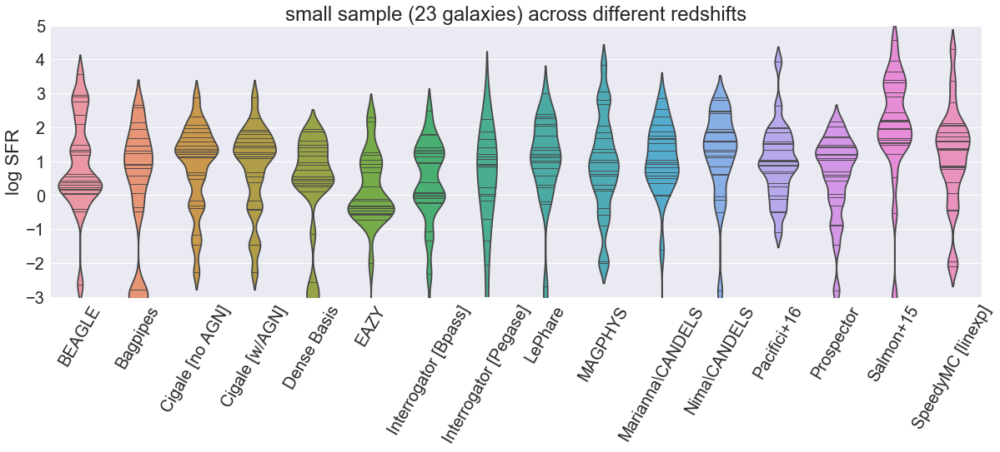

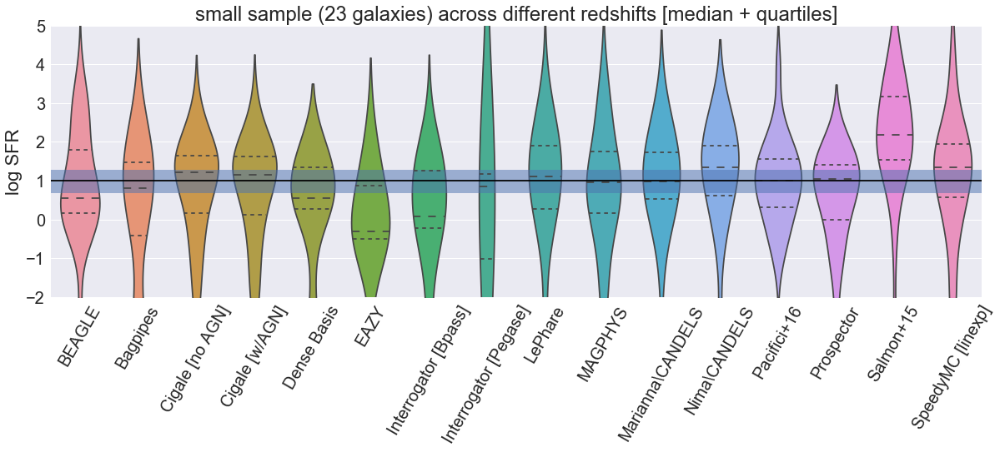

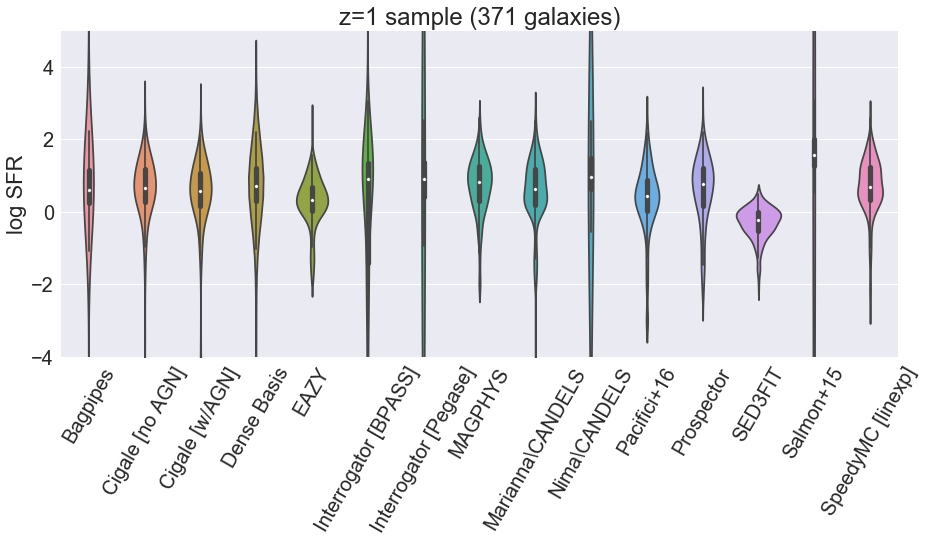

In [40]:
bagpipes_sfr_masked = bagpipes_sfr_small[:]
bagpipes_sfr_masked[bagpipes_sfr_masked < -3] = -3

DB_small_cat_sfr_masked = DB_sfr_small[:]
DB_small_cat_sfr_masked[DB_small_cat_sfr_masked < -3] = -3

brett_sfr_small_masked = brett_sfr_small[:]
brett_sfr_small_masked[brett_sfr_small_masked < -3] = -3


small_cat_sfr = {'Marianna\CANDELS':marianna_sfr_small, 'Nima\CANDELS':nima_sfr_small, 'FITSED':brett_sfr_small_masked, 
                 'BEAGLE':beagle_sfr_small, 'MAGPHYS':magphys_sfr_small, 'EAZY':eazy_sfr_small, 
                 'Interrogator [Pegase]':interrogator_sfr_pegase, 'SpeedyMC [linexp]':speedy_sfr_small,
                 'Interrogator [Bpass]':interrogator_sfr_bpass, 'LePhare':lephare_sfr_small.ravel(), 
                 'Cigale [w/AGN]':cigale_sfr_small_wagn.ravel(), 'Cigale [no AGN]':cigale_sfr_small_noagn.ravel(), 
                 'Bagpipes': bagpipes_sfr_masked, 'Dense Basis': DB_small_cat_sfr_masked.ravel(), 
                 'Pacifici+16': cami_sfr_small.ravel(), 'Prospector': prospector_sfr_small.ravel()}

small_cat_fits_sfr = pd.DataFrame(data=small_cat_sfr)

#-----------------------------------------------

interrogator_z1_bpass = np.zeros_like(marianna_mass_z1)*np.nan
interrogator_z1_bpass[0:len(interrogator_mass_z1_bpass)] = interrogator_sfr_z1_bpass

interrogator_z1_pegase = np.zeros_like(marianna_mass_z1)*np.nan
interrogator_z1_pegase[0:len(interrogator_mass_z1_bpass)] = interrogator_sfr_z1_pegase

z1_cat_sfr = {'Marianna\CANDELS':marianna_sfr_z1, 'Nima\CANDELS':nima_sfr_z1, 'FITSED':brett_sfr_z1, 
               'MAGPHYS':magphys_sfr_z1, 'EAZY':eazy_sfr_z1, 'SpeedyMC [linexp]':speedy_sfr_z1,
               'Cigale [w/AGN]':cigale_sfr_z1_wagn.ravel(), 'Cigale [no AGN]':cigale_sfr_z1_noagn.ravel(), 
              'Dense Basis': DB_sfr_z1.ravel(), 'Pacifici+16': cami_sfr_z1.ravel(), 
              'Prospector': prospector_sfr_z1.ravel(), 'Bagpipes':bagpipes_sfr_z1,
             'Interrogator [BPASS]':interrogator_z1_bpass, 'Interrogator [Pegase]':interrogator_z1_pegase,
             'SED3FIT':sed3fit_sfr_z1}
z1_cat_fits_sfr = pd.DataFrame(data=z1_cat_sfr)



#ax = sns.violinplot(x=DB_small_cat_mstar)
#plt.show()

sns.set(font_scale=2)

plt.figure(figsize=(20,6))
ax = sns.violinplot(data=small_cat_fits_sfr, orient='v',inner='stick',bw=0.2)
ax.set_xticklabels(ax.get_xticklabels(),rotation=60)
ax.set_ylabel('log SFR')
#ax.set_ylim(8,11)
ax.set_title('small sample (23 galaxies) across different redshifts')
plt.ylim(-3,5)

fname = 'figures/small_sample_SFR_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()

median_sfr_val = np.median(small_cat_fits_sfr)

plt.figure(figsize=(20,6))
ax = sns.violinplot(data=small_cat_fits_sfr, orient='v',inner='quartile')
ax.set_xticklabels(ax.get_xticklabels(),rotation=60)
plt.plot([-20,20],[1,1],'k-')
plt.fill_between([-20,20], [median_sfr_val+0.3,median_sfr_val+0.3], [median_sfr_val-0.3,median_sfr_val-0.3], alpha=0.5)
#plt.plot([-20,20],[10.3,10.3],'k:')
#plt.plot([-20,20],[9.7,9.7],'k:')
ax.set_ylim(-2,5)
ax.set_ylabel('log SFR')
ax.set_title('small sample (23 galaxies) across different redshifts [median + quartiles]')
fname = 'figures/small_sample_SFR_all_galaxies_zoomed_in.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()



plt.figure(figsize=(15,6))
ax = sns.violinplot(data=z1_cat_fits_sfr, orient='v')
ax.set_xticklabels(ax.get_xticklabels(),rotation=60)
ax.set_ylabel('log SFR')
ax.set_title('z=1 sample (371 galaxies)')
plt.ylim(-4,5)
fname = 'figures/z1_sample_SFR_all_galaxies.png'
plt.savefig(fname, bbox_inches='tight')
plt.show()

# in case anyone prefers boxplots:

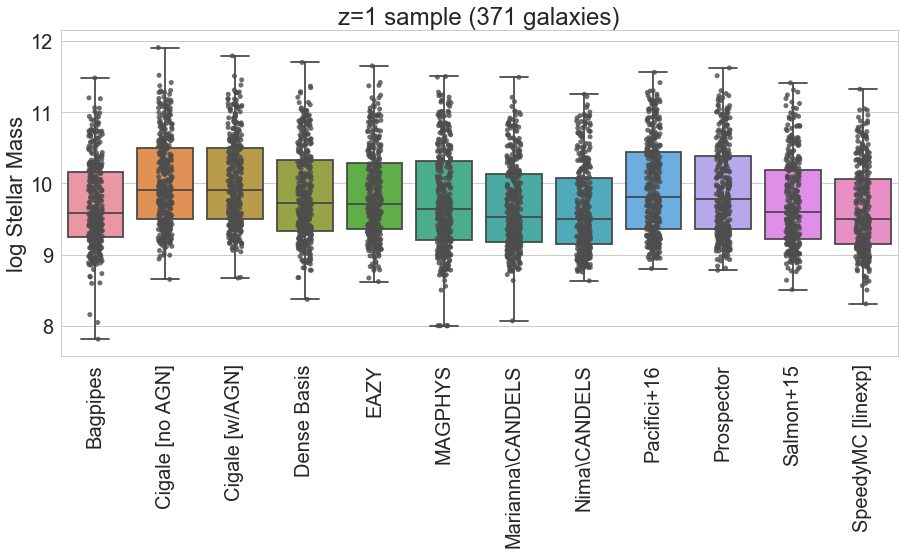

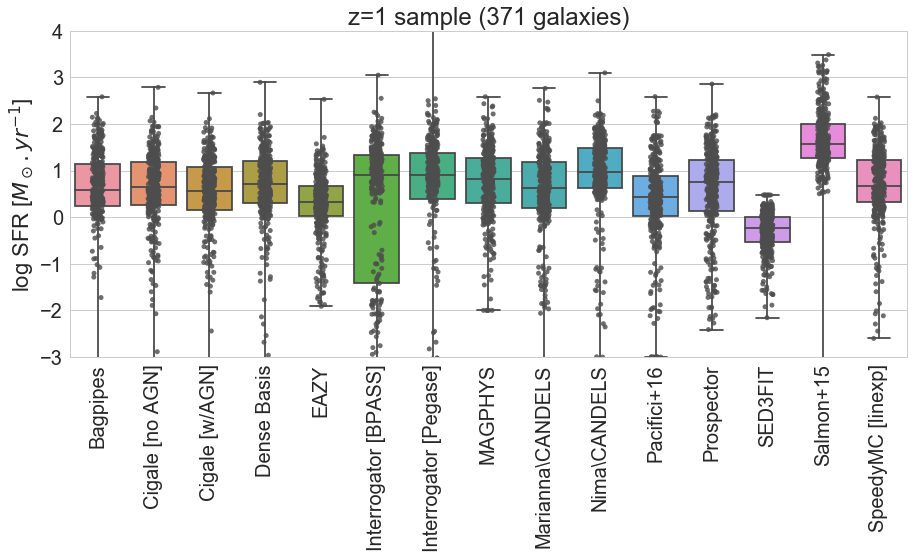

In [61]:

plt.figure(figsize=(15,6))
ax = sns.boxplot(data=z1_cat_mass, orient='v', whis=np.inf)
ax = sns.stripplot(data=z1_cat_mass, orient='v', jitter=True, color='.3' , alpha=0.81)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_ylabel('log Stellar Mass')
ax.set_title('z=1 sample (371 galaxies)')
fname = 'figures/z1_sample_Mstar_all_galaxies_boxplots.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()


plt.figure(figsize=(15,6))
#ax = sns.violinplot(data=z1_cat_fits_sfr, orient='v')
ax = sns.boxplot(data=z1_cat_fits_sfr, orient='v', whis=np.inf)
ax = sns.stripplot(data=z1_cat_fits_sfr, orient='v',jitter=True, color='.3',alpha=0.81)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_ylabel(r'log SFR [$M_\odot.yr^{-1}$]')
ax.set_title('z=1 sample (371 galaxies)')
plt.ylim(-3,4)
fname = 'figures/z1_sample_SFR_all_galaxies_boxplots.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

In [41]:
def gaus2side(grid,mean,sigdn,sigup,vb=False,normed='area'):
    """
    return a 2-tailed gaussian over a grid. 
    """
    
    if (sigdn == 0) & (sigup == 0):
        sigdn, sigup = 0.1, 0.1
        
    if ~np.isnan(mean):

        mask1 = (grid < mean)
        mask2 = (grid > mean)
        gaus2vals = np.zeros_like(grid)
        gaus2vals[mask1] = np.exp(-(grid[mask1] - mean)**2 / (2*sigdn**2))
        gaus2vals[mask2] = np.exp(-(grid[mask2] - mean)**2 / (2*sigup**2))

        if vb == True: 
            plt.plot(grid,gaus2vals,lw=3)
            plt.show()

        if normed == 'area':
            gaus2vals = gaus2vals/np.trapz(x=grid,y=gaus2vals)
    else:
        gaus2vals = np.zeros_like(grid)
        
    return gaus2vals

def make_kde_cat(x, x_dn, x_up, xgrid_lo = 6, xgrid_hi = 14, xgrid_res = 0.01, vb=False, normed = 'area'):
    
    xgrid = np.arange(xgrid_lo, xgrid_hi, xgrid_res)
    x_kde = np.zeros_like(xgrid)
    
    for i in (range(len(x))):
        gv = gaus2side(xgrid, x[i], x[i] - x_dn[i], x_up[i] - x[i])
        x_kde = x_kde + gv
        if vb == True:
            plt.plot(xgrid,gv,'k-')
    if vb == True:
        plt.plot(xgrid,x_kde,lw=3)
        plt.show()
    
    if normed == 'area':
        x_kde = x_kde / np.trapz(x = xgrid, y = x_kde)    
    
    return x_kde, xgrid

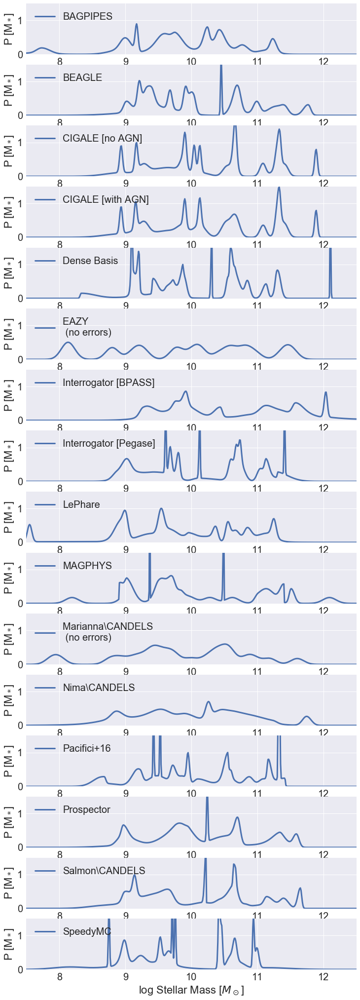

In [42]:
plt.figure(figsize = (12,36))

numsets = 16

cts = 1

plt.subplot(numsets,1,cts)
cts = cts + 1
bagpipes_kde, massgrid = make_kde_cat(bagpipes_mass_small,bagpipes_mass_lo_small,bagpipes_mass_hi_small)
plt.plot(massgrid,bagpipes_kde,lw=3,label='BAGPIPES')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)

plt.subplot(numsets,1,cts)
cts = cts + 1
beagle_kde, massgrid = make_kde_cat(beagle_mass_small,beagle_mass_lo_small,beagle_mass_hi_small)
plt.plot(massgrid,beagle_kde,lw=3,label='BEAGLE')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)


plt.subplot(numsets,1,cts)
cts = cts + 1
cigale1_kde, massgrid = make_kde_cat(cigale_mass_small_noagn, cigale_mass_lo_small_noagn, cigale_mass_hi_small_noagn)
plt.plot(massgrid,cigale1_kde,lw=3,label='CIGALE [no AGN]')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)

plt.subplot(numsets,1,cts)
cts = cts + 1
cigale2_kde, massgrid = make_kde_cat(cigale_mass_small_wagn, cigale_mass_lo_small_wagn, cigale_mass_hi_small_wagn)
plt.plot(massgrid,cigale2_kde,lw=3,label='CIGALE [with AGN]')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)



plt.subplot(numsets,1,cts)
cts = cts + 1
DB_kde, massgrid = make_kde_cat(DB_mass_small, DB_mass_lo_small, DB_mass_hi_small)
plt.plot(massgrid,DB_kde,lw=3,label='Dense Basis')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)


plt.subplot(numsets,1,cts)
cts = cts + 1
eazy_kde, massgrid = make_kde_cat(eazy_mass_small,eazy_mass_small,eazy_mass_small)
plt.plot(massgrid,eazy_kde,lw=3,label='EAZY \n (no errors)')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)



plt.subplot(numsets,1,cts)
cts = cts + 1
interrogator1_kde, massgrid = make_kde_cat(interrogator_mass_bpass,interrogator_mass_lo_bpass,interrogator_mass_hi_bpass)
plt.plot(massgrid,interrogator1_kde,lw=3,label='Interrogator [BPASS]')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)

plt.subplot(numsets,1,cts)
cts = cts + 1
interrogator2_kde, massgrid = make_kde_cat(interrogator_mass_pegase,interrogator_mass_lo_pegase,interrogator_mass_hi_pegase)
plt.plot(massgrid,interrogator2_kde,lw=3,label='Interrogator [Pegase]')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)

plt.subplot(numsets,1,cts)
cts = cts + 1
lephare_kde, massgrid = make_kde_cat(lephare_mass_small,lephare_mass_lo_small,lephare_mass_hi_small)
plt.plot(massgrid,lephare_kde,lw=3,label='LePhare')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)

plt.subplot(numsets,1,cts)
cts = cts + 1
magphys_kde, massgrid = make_kde_cat(magphys_mass_small, magphys_mass_lo_small,magphys_mass_hi_small)
plt.plot(massgrid,magphys_kde,lw=3,label='MAGPHYS')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)


plt.subplot(numsets,1,cts)
cts = cts + 1
marianna_kde, massgrid = make_kde_cat(marianna_mass_small,marianna_mass_small,marianna_mass_small)
plt.plot(massgrid,marianna_kde,lw=3,label='Marianna\CANDELS \n (no errors)')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)



plt.subplot(numsets,1,cts)
cts = cts + 1
nima_kde, massgrid = make_kde_cat(nima_mass_small,nima_mass_lo_small,nima_mass_hi_small)
plt.plot(massgrid,nima_kde,lw=3,label='Nima\CANDELS')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)

plt.subplot(numsets,1,cts)
cts = cts + 1
cami_kde, massgrid = make_kde_cat(cami_mass_small,cami_mass_lo_small,cami_mass_hi_small)
plt.plot(massgrid,cami_kde,lw=3,label='Pacifici+16')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)


plt.subplot(numsets,1,cts)
cts = cts + 1
prospector_kde, massgrid = make_kde_cat(prospector_mass_small, prospector_mass_lo_small, prospector_mass_hi_small)
plt.plot(massgrid,prospector_kde,lw=3,label='Prospector')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)


plt.subplot(numsets,1,cts)
cts = cts + 1
salmon_kde, massgrid = make_kde_cat(brett_mass_small,brett_mass_lo_small,brett_mass_hi_small)
plt.plot(massgrid,salmon_kde,lw=3,label='Salmon\CANDELS')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)

plt.subplot(numsets,1,cts)
cts = cts + 1
speedyMC_kde, massgrid = make_kde_cat(speedy_mass_small, speedy_mass_lo_small, speedy_mass_hi_small)
plt.plot(massgrid,speedyMC_kde,lw=3,label='SpeedyMC')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.5)
plt.xlim(7.5,12.5)



plt.xlabel(r'log Stellar Mass [$M_\odot$]')

fname = 'figures/small_sample_Mstar_all_galaxies_KDEplot.png'
plt.savefig(fname, bbox_inches='tight')


plt.show()

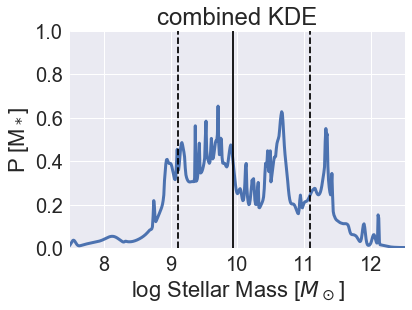

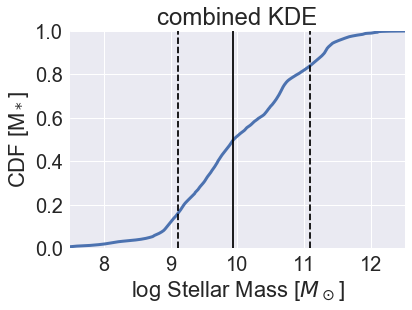

In [43]:
combined_kde = bagpipes_kde + beagle_kde + cigale1_kde + cigale2_kde + DB_kde + eazy_kde + interrogator1_kde + interrogator2_kde + lephare_kde + magphys_kde + marianna_kde + nima_kde + cami_kde + prospector_kde + salmon_kde + speedyMC_kde

#combined_kde = bagpipes_kde * beagle_kde * cigale1_kde * cigale2_kde * DB_kde * eazy_kde * interrogator1_kde * interrogator2_kde * lephare_kde * magphys_kde * marianna_kde * nima_kde * cami_kde * prospector_kde * salmon_kde * speedyMC_kde

normed_kde_cumsum = np.cumsum(combined_kde)/np.amax(np.cumsum(combined_kde))

median_mass_combined_kde = massgrid[np.argmin(np.abs(normed_kde_cumsum - 0.5))]
mass_lo_combined_kde = massgrid[np.argmin(np.abs(normed_kde_cumsum - 0.84))]
mass_hi_combined_kde = massgrid[np.argmin(np.abs(normed_kde_cumsum - 0.16))]

plt.plot(massgrid, combined_kde/16,lw=3)
plt.plot([median_mass_combined_kde,median_mass_combined_kde],[0,1],'k-')
plt.plot([mass_lo_combined_kde,mass_lo_combined_kde],[0,1],'k--')
plt.plot([mass_hi_combined_kde,mass_hi_combined_kde],[0,1],'k--')
plt.ylabel(r'P [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.0)
plt.xlim(7.5,12.5)
plt.xlabel(r'log Stellar Mass [$M_\odot$]')
plt.title('combined KDE')
plt.show()

plt.plot(massgrid,normed_kde_cumsum,lw=3)
plt.plot([median_mass_combined_kde,median_mass_combined_kde],[0,1],'k-')
plt.plot([mass_lo_combined_kde,mass_lo_combined_kde],[0,1],'k--')
plt.plot([mass_hi_combined_kde,mass_hi_combined_kde],[0,1],'k--')
plt.ylabel(r'CDF [M$_*$]')
plt.legend(loc=2)
plt.ylim(0,1.0)
plt.xlim(7.5,12.5)
plt.xlabel(r'log Stellar Mass [$M_\odot$]')
plt.title('combined KDE')
plt.show()


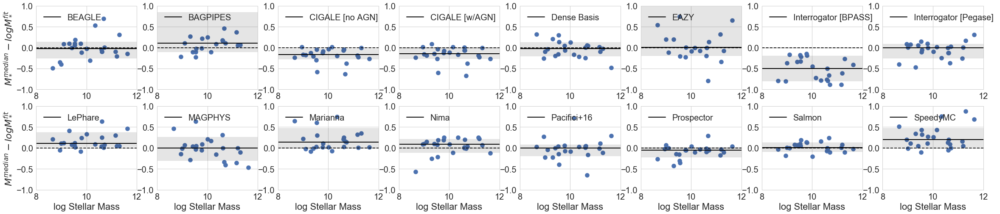

In [44]:
# todo: add errorbars to this plot.

sns.set_style("whitegrid")

plt.figure(figsize=(40,8))

code_names = ['BEAGLE','BAGPIPES','CIGALE [no AGN]','CIGALE [w/AGN]','Dense Basis','EAZY','Interrogator [BPASS]','Interrogator [Pegase]','LePhare','MAGPHYS','Marianna','Nima','Pacifici+16','Prospector','Salmon','SpeedyMC']

for i in range(mass_fits_array.shape[1]):
    plt.subplot(2,8,i+1)
    massdiff = median_mass_fits_small - mass_fits_array[0:,i]
    plt.scatter(median_mass_fits_small,massdiff,s=108)
    plt.plot([8,12],[0,0],'k--')
    plt.plot([8,12],[1*np.nanmedian(massdiff),1*np.nanmedian(massdiff)],'k-',lw=2,label=code_names[i])
    plt.fill_between([8,12],[np.nanpercentile(massdiff,16),np.nanpercentile(massdiff,16)],
                     [np.nanpercentile(massdiff,84),np.nanpercentile(massdiff,84)],alpha=0.1,color='k')
    plt.axis([8,12,-1,1])
    plt.legend(loc=2)
    if (i>7):
        plt.xlabel('log Stellar Mass')
    if (i == 0) or (i == 8):
        plt.ylabel(r'$M_*^{median} - log M_*^{fit}$')
    #plt.axis([8,12,8,12])
    #plt.plot([8,12],[8,12],'k--')
    
fname = 'figures/small_sample_Mstar_all_galaxies_median_compare.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()


[ 1.1755515   0.43478515  0.36972684 -2.62856721  0.16412952  1.34489182
  2.10508103  3.5741028   0.553282    0.17630748  2.94793023  2.90442439
  1.29545272  0.23986875  2.75828497  0.31049364  2.37298185  0.03865695
 -0.48756873  1.47664049  0.62663724  0.05680674 -0.40973403]
(23,)


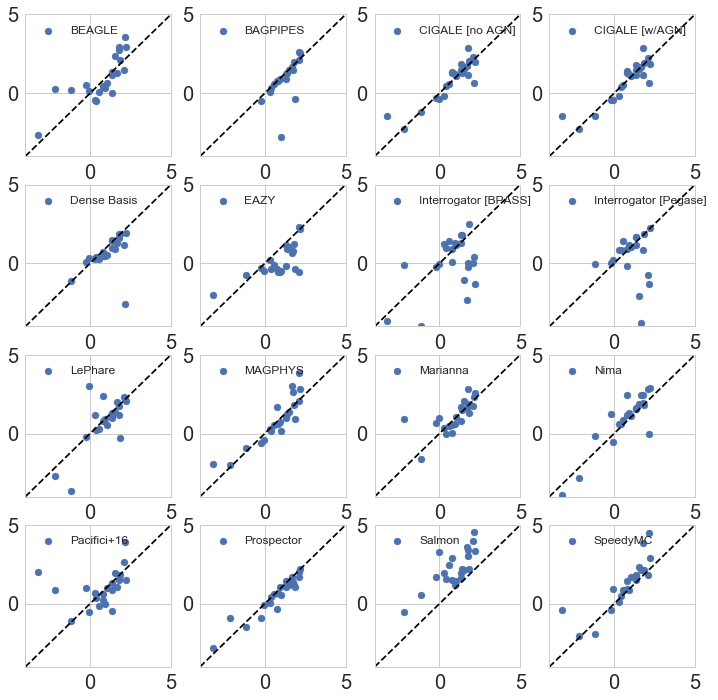

In [45]:
# add errorbars to this plot.


print(sfr_fits_array[0:,0])

median_sfr_fits_small = np.nanmedian(sfr_fits_array,axis=1)
print(median_sfr_fits_small.shape)


plt.figure(figsize=(12,12))
for i in range(sfr_fits_array.shape[1]):
    plt.subplot(4,4,i+1)
    
    plt.scatter(median_sfr_fits_small, sfr_fits_array[0:,i],label=code_names[i])
    plt.axis([-4,5,-4,5])
    plt.plot([-4,5],[-4,5],'k--')
    plt.legend(loc=2,fontsize=12)
plt.show()

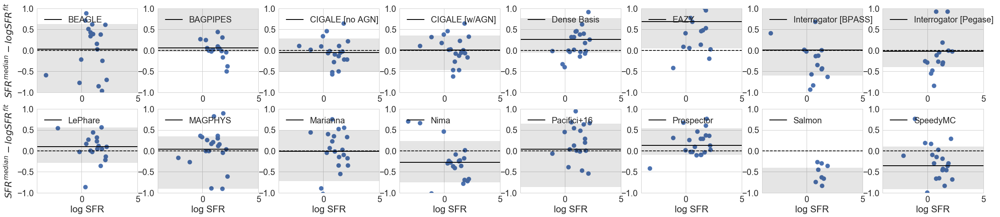

In [46]:
sns.set_style("whitegrid")

plt.figure(figsize=(40,8))

code_names = ['BEAGLE','BAGPIPES','CIGALE [no AGN]','CIGALE [w/AGN]','Dense Basis','EAZY','Interrogator [BPASS]','Interrogator [Pegase]','LePhare','MAGPHYS','Marianna','Nima','Pacifici+16','Prospector','Salmon','SpeedyMC']

for i in range(sfr_fits_array.shape[1]):
    plt.subplot(2,8,i+1)
    sfrdiff = median_sfr_fits_small - sfr_fits_array[0:,i]
    plt.scatter(median_sfr_fits_small,sfrdiff,s=108)
    plt.plot([-4,5],[0,0],'k--')
    plt.plot([-4,5],[1*np.nanmedian(sfrdiff),1*np.nanmedian(sfrdiff)],'k-',lw=2,label=code_names[i])
    plt.fill_between([-4,5],[np.nanpercentile(sfrdiff,16),np.nanpercentile(sfrdiff,16)],
                     [np.nanpercentile(sfrdiff,84),np.nanpercentile(sfrdiff,84)],alpha=0.1,color='k')
    plt.axis([-4,5,-1,1])
    plt.legend(loc=2)
    if (i>7):
        plt.xlabel('log SFR')
    if (i == 0) or (i == 8):
        plt.ylabel(r'$SFR^{median} - log SFR^{fit}$')
    #plt.axis([8,12,8,12])
    #plt.plot([8,12],[8,12],'k--')
fname = 'figures/small_sample_SFR_all_galaxies_median_compare.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

In [ ]:
# this plot can be improved, but my python crashes every time I try to set xlim or ylim
# There's also some interesting trends here, it would be nice if someone could improve these plots
# by adding a best-fit line / plane to the points




#code_names = ['BEAGLE','BAGPIPES','CIGALE [no AGN]','CIGALE [w/AGN]','Dense Basis','EAZY','Interrogator [BPASS]','Interrogator [Pegase]','LePhare','MAGPHYS','Marianna','Nima','Pacifici+16','Prospector','Salmon','SpeedyMC']
#code_names = ['BEAGLE','BAGPIPES','CIGALE [no AGN]','CIGALE [w/AGN]','Dense Basis','EAZY','Interrogator [BPASS]','Interrogator [Pegase]','LePhare','MAGPHYS','Marianna','Nima','Pacifici+16','Prospector','Salmon']

for galid in range(len(median_mass_fits_small)):

    median_masses_galid = median_mass_fits_small[galid]

    all_masses_galid = mass_fits_array[galid,0:]
    all_masses_galid_lo = (mass_fits_array[galid,0:] - mass_fits_array_lo[galid,0:])
    all_masses_galid_hi = (mass_fits_array_hi[galid,0:] - mass_fits_array[galid,0:])

    all_sfrs_galid = sfr_fits_array[galid,0:]
    all_sfrs_galid_lo = np.abs(sfr_fits_array[galid,0:] - sfr_fits_array_lo[galid,0:])
    all_sfrs_galid_hi = np.abs(sfr_fits_array_hi[galid,0:] - sfr_fits_array[galid,0:])

    all_Av_galid = Av_fits_array[galid,0:]
    all_Av_galid_lo = np.abs(Av_fits_array[galid,0:] - Av_fits_array_lo[galid,0:])
    all_Av_galid_hi = np.abs(Av_fits_array_hi[galid,0:] - Av_fits_array[galid,0:])
    
    good_values_mask = (~np.isnan(all_masses_galid)) & (~np.isnan(all_sfrs_galid)) & ((~np.isnan(all_Av_galid)))
    print(good_values_mask)

    fig, ax = plt.subplots(1, 1,figsize=(18,15), subplot_kw={'projection':'3d'})
    plt.title('CANDELS/GOODS-S Galaxy ID: '+str(cat_small_ids[galid].astype(int)+1)+' at z_best = %.2f' %cat_small_z[galid])
    ax.scatter(all_masses_galid[0:-1], all_sfrs_galid[0:-1], all_Av_galid[0:-1], s=120, c='b', zorder=10)
    for i in np.arange(0,len(all_masses_galid)-1):
        if (good_values_mask[i] == True):
            ax.plot([all_masses_galid[i]+all_masses_galid_hi[i],all_masses_galid[i]-all_masses_galid_lo[i]], 
                    [all_sfrs_galid[i], all_sfrs_galid[i]], [all_Av_galid[i],all_Av_galid[i]],c='b')
            ax.plot([all_masses_galid[i],all_masses_galid[i]],
                   [all_sfrs_galid[i] + all_sfrs_galid_hi[i],all_sfrs_galid[i] - all_sfrs_galid_lo[i]],
                   [all_Av_galid[i],all_Av_galid[i]],c='b')
            ax.plot([all_masses_galid[i],all_masses_galid[i]],
                   [all_sfrs_galid[i],all_sfrs_galid[i]],
                   [all_Av_galid[i] + all_Av_galid_hi[i],all_Av_galid[i] - all_Av_galid_lo[i]],c='b')

    allvals = np.arange(len(all_masses_galid))
    goodvals = allvals[good_values_mask]
    for i, txt in enumerate(code_names):
        if (good_values_mask[i] == True):
            ax.text(all_masses_galid[i]+0.0,all_sfrs_galid[i]-0.1,all_Av_galid[i]-0.1, txt,fontsize=14,zdir='x')

    ax.set_xlabel('log Stellar Mass',labelpad=20)
    ax.set_ylabel('log SFR',labelpad=20)
    ax.zaxis.set_rotate_label(False) 
    ax.set_zlabel(r'A$_v$', fontsize=30, rotation = 0,labelpad=25)
    #ax.set_ylim(-3,4)
    
    
    gid_small = (cat_small_ids[galid].astype(int)+1)
    fname = 'figures/gal_id_'+str(gid_small)+'_3d_comparison.png'
    plt.savefig(fname, bbox_inches='tight')
    
    plt.show()


# Inter-code Stellar Mass variability. 
### Quantifying the amount of variance between different codes for individual codes using the z~1 sample,  then looking at a function of mass.

In [122]:
# start with code outputs I have so far.

brett_mass_z1_masked = brett_mass_z1
brett_mass_z1_masked[brett_mass_z1_masked < 0] = np.nan

nima_mass_z1_masked = nima_mass_z1
nima_mass_z1_masked[nima_mass_z1_masked < 0] = np.nan

z1_cat_mass_dict = {'Marianna\CANDELS':marianna_mass_z1, 
               'Nima\CANDELS':nima_mass_z1_masked, 
                'Salmon+15':brett_mass_z1_masked, 
                'MAGPHYS':magphys_mass_z1, 
               'EAZY':eazy_mass_z1, 
                'SpeedyMC [linexp]':speedy_mass_z1,
                'Cigale [w/AGN]':cigale_mass_z1_wagn.ravel(), 
               'Cigale [no AGN]':cigale_mass_z1_noagn.ravel(), 
                'Dense Basis': DB_mass_z1.ravel(), 
               'Pacifici+16': cami_mass_z1.ravel(), 
                'Prospector': prospector_mass_z1.ravel(),
                'Bagpipes': bagpipes_mass_z1}
z1_cat_mass = pd.DataFrame(data=z1_cat_mass_dict)

z1_cat_mass_array = np.array(z1_cat_mass)
print(z1_cat_mass_array.shape)


z1_cat_sfr_dict = {'Marianna\CANDELS':marianna_sfr_z1, 
                   'Nima\CANDELS':nima_sfr_z1, 
                   'Salmon+15':brett_sfr_z1, 
                   'MAGPHYS':magphys_sfr_z1, 
                   'EAZY':eazy_sfr_z1, 
                   'SpeedyMC [linexp]':speedy_sfr_z1,
                   'Cigale [w/AGN]':cigale_sfr_z1_wagn.ravel(), 
                   'Cigale [no AGN]':cigale_sfr_z1_noagn.ravel(), 
                   'Dense Basis': DB_sfr_z1.ravel(), 
                   'Pacifici+16': cami_sfr_z1.ravel(), 
                  'Prospector': prospector_sfr_z1.ravel(), 
                   'Bagpipes':bagpipes_sfr_z1}
z1_cat_sfr = pd.DataFrame(data=z1_cat_sfr_dict)

z1_cat_sfr_array = np.array(z1_cat_sfr)
print(z1_cat_sfr_array.shape)



z1_cat_Av_dict = {'Marianna\CANDELS':marianna_Av_z1, 
                   'Nima\CANDELS':nima_Av_z1, 
                   'Salmon+15':brett_Av_z1, 
                   'MAGPHYS':magphys_Av_z1, 
                   'EAZY':eazy_Av_z1, 
                   'SpeedyMC [linexp]':speedy_Av_z1,
                   'Cigale [w/AGN]':np.zeros_like(eazy_Av_z1)*np.nan, 
                   'Cigale [no AGN]':np.zeros_like(eazy_Av_z1)*np.nan, 
                   'Dense Basis': DB_Av_z1, 
                   'Pacifici+16': cami_Av_z1, 
                  'Prospector': prospector_Av_z1, 
                   'Bagpipes':bagpipes_Av_z1}
z1_cat_Av = pd.DataFrame(data=z1_cat_Av_dict)

z1_cat_Av_array = np.array(z1_cat_Av)
print(z1_cat_sfr_array.shape)

(371, 12)
(371, 12)
(371, 12)


In [125]:
mass_z1cat_50 = np.nanmedian(z1_cat_mass,axis=1)
mass_z1cat_16 = np.nanpercentile(z1_cat_mass,16,axis=1)
mass_z1cat_84 = np.nanpercentile(z1_cat_mass,84,axis=1)

z1_cat_sfr[z1_cat_sfr < -3] = np.nan

sfr_z1cat_50 = np.nanmedian(z1_cat_sfr,axis=1)
sfr_z1cat_16 = np.nanpercentile(z1_cat_sfr,16,axis=1)
sfr_z1cat_84 = np.nanpercentile(z1_cat_sfr,84,axis=1)

ssfr_dist = np.log10(10**z1_cat_sfr_array / 10**z1_cat_mass_array)

ssfr_z1cat_50 = np.nanmedian(ssfr_dist,axis=1)
ssfr_z1cat_16 = np.nanpercentile(ssfr_dist,16,axis=1)
ssfr_z1cat_84 = np.nanpercentile(ssfr_dist,84,axis=1)

Av_z1cat_50 = np.nanmedian(z1_cat_Av,axis=1)
Av_z1cat_16 = np.nanpercentile(z1_cat_Av,16,axis=1)
Av_z1cat_84 = np.nanpercentile(z1_cat_Av,84,axis=1)

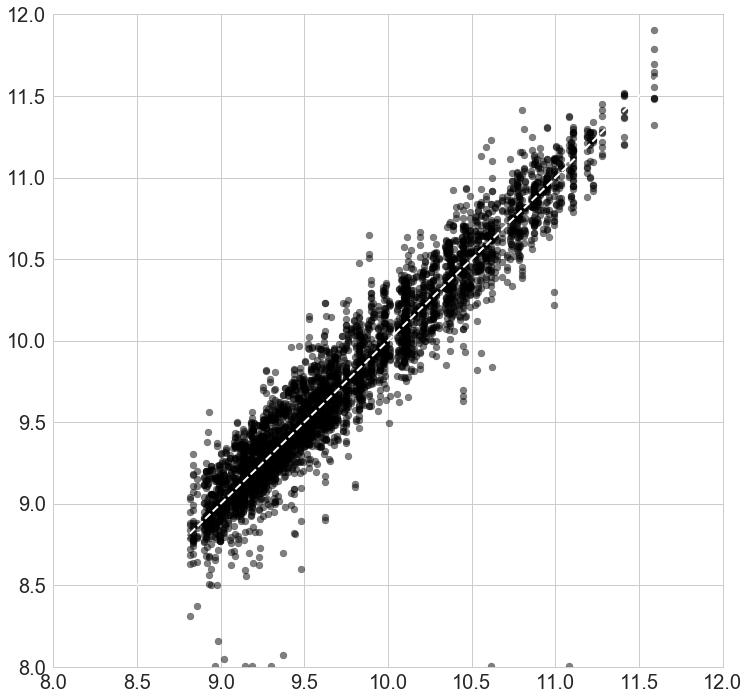

In [91]:

plt.figure(figsize=(12,12))
for i in range(z1_cat_mass_array.shape[1]):
    #plt.subplot(2,8,i+1)
    plt.scatter(mass_z1cat_50, z1_cat_mass_array[0:,i],color='k',alpha=0.5)
plt.plot([8,12],[8,12],'w--',lw=2)
plt.axis([8,12,8,12])
plt.show()

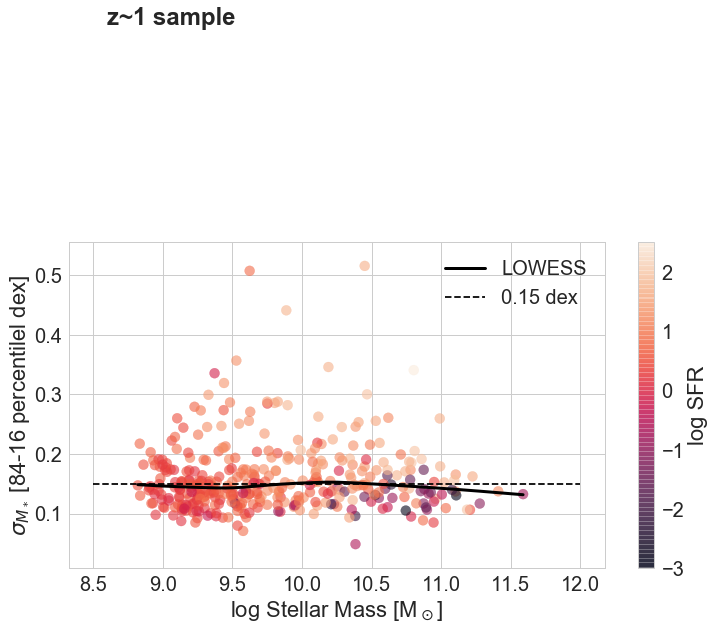

In [93]:
# plot variability for all the galaxies:

sns.set_style("whitegrid")


plt.figure(figsize=(12,6))
plt.scatter(mass_z1cat_50, (mass_z1cat_84 - mass_z1cat_16)/2,s=100,alpha=0.6,c=sfr_z1cat_50)

z1 = lowess((mass_z1cat_84 - mass_z1cat_16)/2,mass_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([8.5,12],[0.15,0.15],'k--',label='0.15 dex')
plt.xlabel(r'log Stellar Mass [M$_\odot$]')
plt.ylabel(r'$\sigma_{M_*}$ [84-16 percentilel dex]')
plt.legend()
plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')

clbr = plt.colorbar()
clbr.set_label('log SFR')
fname = 'figures/mass_variability_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

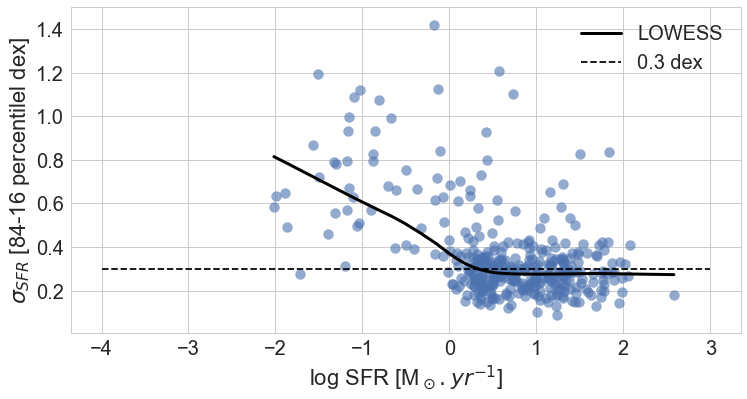

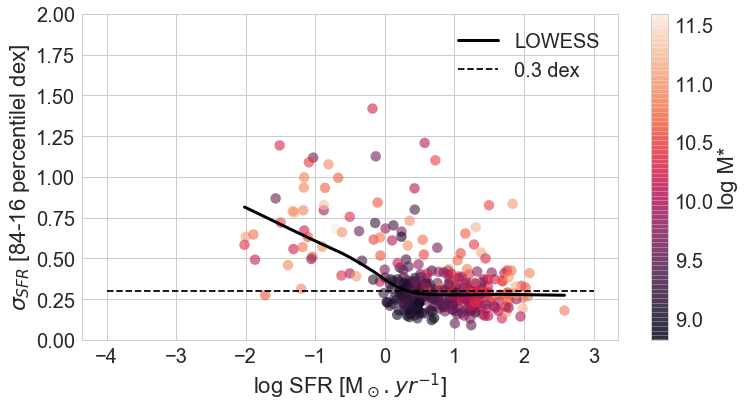

In [115]:


plt.figure(figsize=(12,6))
plt.scatter(sfr_z1cat_50, (sfr_z1cat_84 - sfr_z1cat_16)/2,s=100,alpha=0.6)

z1 = lowess((sfr_z1cat_84 - sfr_z1cat_16)/2,sfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([-4,3],[0.3,0.3],'k--',label='0.3 dex')
plt.xlabel(r'log SFR [M$_\odot.yr^{-1}$]')
plt.ylabel(r'$\sigma_{SFR}$ [84-16 percentilel dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')

fname = 'figures/sfr_variability_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()


plt.figure(figsize=(12,6))
#plt.subplot(2,1,1)
plt.scatter(sfr_z1cat_50, (sfr_z1cat_84 - sfr_z1cat_16)/2,s=100,alpha=0.6,c=mass_z1cat_50)

z1 = lowess((sfr_z1cat_84 - sfr_z1cat_16)/2,sfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([-4,3],[0.3,0.3],'k--',label='0.3 dex')
plt.xlabel(r'log SFR [M$_\odot.yr^{-1}$]')
plt.ylabel(r'$\sigma_{SFR}$ [84-16 percentilel dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')
plt.ylim(0,2)

clbr = plt.colorbar()
clbr.set_label('log M*')

fname = 'figures/sfr_variability_z1_small_axes.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

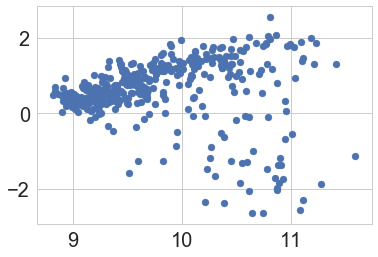

In [115]:
plt.scatter(mass_z1cat_50, sfr_z1cat_50)
plt.show()

In [60]:
X = np.vstack((cat_z1_ids, mass_z1cat_16, mass_z1cat_50, mass_z1cat_84, sfr_z1cat_16, sfr_z1cat_50, sfr_z1cat_84)).T
X.shape

fname = 'mass_sfr_distribution_comparison.txt'
header_txt = ' ID, log_mass_16, log_mass_50, log_mass_84, log_sfr_16, log_sfr_50, log_sfr_84 \n'
np.savetxt(fname, X, fmt='%.7f', delimiter=' ', newline='\n', header=header_txt, footer='', comments='# ')

In [ ]:
# from adam:

axes[-1].set_xticklabels(names, rotation=45, ha="right") < ha kwarg will sort the labels out

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 89.33it/s]


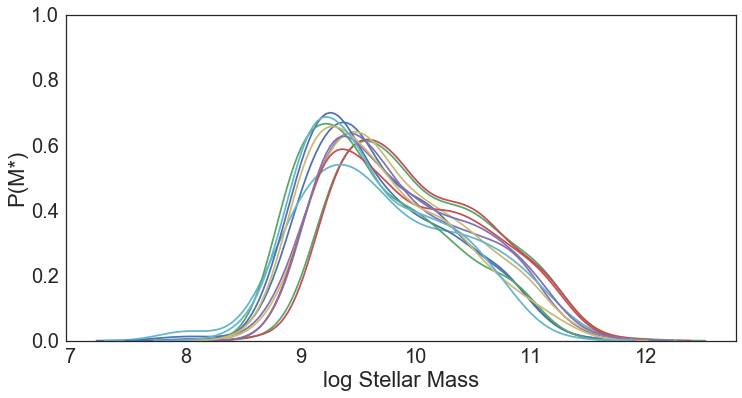

In [74]:
sns.set_style('white')

plt.figure(figsize=(12,6))
for i in tqdm(range(z1_cat_mass_array.shape[1])):
    sns.kdeplot(z1_cat_mass_array[0:,i])
plt.ylim(0,1)
plt.xlabel('log Stellar Mass')
plt.ylabel('P(M*)')
plt.show()

100%|███████████████████████████████████████████████████████████████████████████████| 371/371 [00:02<00:00, 155.02it/s]


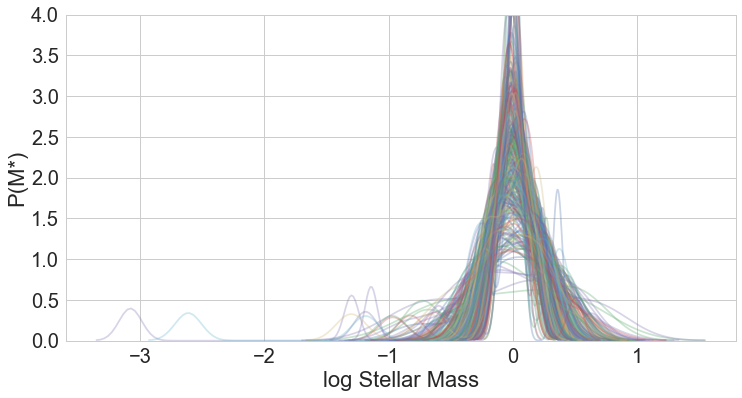

100%|███████████████████████████████████████████████████████████████████████████████| 371/371 [00:02<00:00, 151.64it/s]


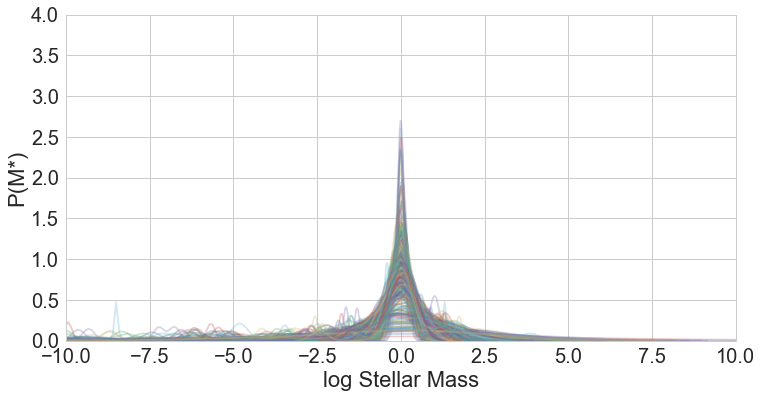

In [97]:
mass_z1cat_50 = np.nanmedian(z1_cat_mass,axis=1)

plt.figure(figsize=(12,6))
for i in tqdm(range(z1_cat_mass_array.shape[0])):
#for i in tqdm(range(100)):
    
    sns.kdeplot(z1_cat_mass_array[i,0:] - mass_z1cat_50[i],alpha=0.3)
plt.ylim(0,4)
plt.xlabel('log Stellar Mass')
plt.ylabel('P(M*)')
plt.show()

mass_z1cat_50 = np.nanmedian(z1_cat_mass,axis=1)

plt.figure(figsize=(12,6))
for i in tqdm(range(z1_cat_mass_array.shape[0])):
#for i in tqdm(range(100)):
    
    sns.kdeplot(z1_cat_sfr_array[i,0:] - sfr_z1cat_50[i],alpha=0.3)
plt.xlim(-10,10)
plt.ylim(0,4)
plt.xlabel('log SFR')
plt.ylabel('P(M*)')
plt.show()

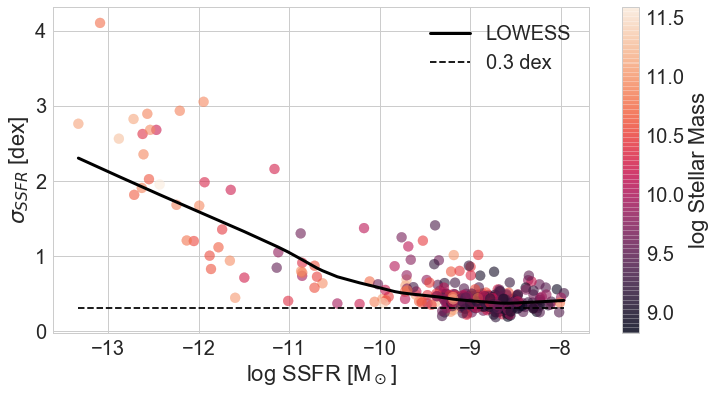

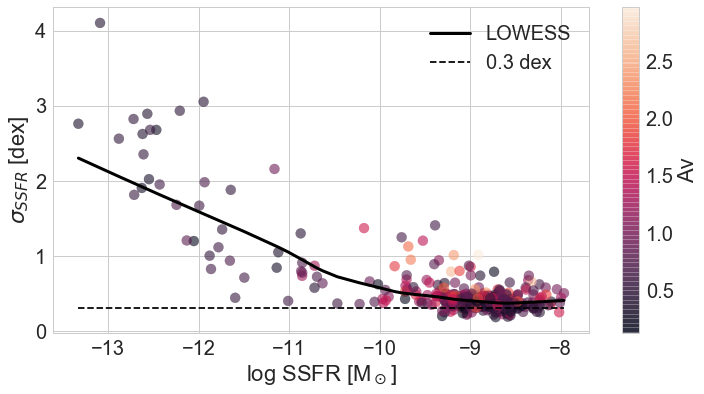

In [129]:
# plot variability for all the galaxies:

sns.set_style("whitegrid")


plt.figure(figsize=(12,6))
plt.scatter(ssfr_z1cat_50, (ssfr_z1cat_84 - ssfr_z1cat_16)/2,s=100,alpha=0.6,c=mass_z1cat_50)

z1 = lowess((ssfr_z1cat_84 - ssfr_z1cat_16)/2,ssfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([np.nanmin(ssfr_z1cat_50), np.nanmax(ssfr_z1cat_50)],[0.3,0.3],'k--',label='0.3 dex')
plt.xlabel(r'log SSFR [M$_\odot$]')
plt.ylabel(r'$\sigma_{SSFR}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')

clbr = plt.colorbar()
clbr.set_label('log Stellar Mass')
fname = 'figures/ssfr_variability_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()



plt.figure(figsize=(12,6))
plt.scatter(ssfr_z1cat_50, (ssfr_z1cat_84 - ssfr_z1cat_16)/2,s=100,alpha=0.6,c=(Av_z1cat_50))

z1 = lowess((ssfr_z1cat_84 - ssfr_z1cat_16)/2,ssfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([np.nanmin(ssfr_z1cat_50), np.nanmax(ssfr_z1cat_50)],[0.3,0.3],'k--',label='0.3 dex')
plt.xlabel(r'log SSFR [M$_\odot$]')
plt.ylabel(r'$\sigma_{SSFR}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')

clbr = plt.colorbar()
clbr.set_label('Av')
fname = 'figures/ssfr_variability_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

In [ ]:


plt.figure(figsize=(12,6))
plt.scatter(sfr_z1cat_50, (sfr_z1cat_84 - sfr_z1cat_16)/2,s=100,alpha=0.6)

z1 = lowess((sfr_z1cat_84 - sfr_z1cat_16)/2,sfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([-4,3],[0.3,0.3],'k--',label='0.3 dex')
plt.xlabel(r'log SFR [M$_\odot.yr^{-1}$]')
plt.ylabel(r'$\sigma_{SFR}$ [84-16 percentilel dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')

fname = 'figures/sfr_variability_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()


plt.figure(figsize=(12,6))
#plt.subplot(2,1,1)
plt.scatter(sfr_z1cat_50, (sfr_z1cat_84 - sfr_z1cat_16)/2,s=100,alpha=0.6,c=mass_z1cat_50)

z1 = lowess((sfr_z1cat_84 - sfr_z1cat_16)/2,sfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([-4,3],[0.3,0.3],'k--',label='0.3 dex')
plt.xlabel(r'log SFR [M$_\odot.yr^{-1}$]')
plt.ylabel(r'$\sigma_{SFR}$ [84-16 percentilel dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')
plt.ylim(0,2)

clbr = plt.colorbar()
clbr.set_label('log M*')

fname = 'figures/sfr_variability_z1_small_axes.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()

# plot variability for all the galaxies:

sns.set_style("whitegrid")


plt.figure(figsize=(12,6))
plt.scatter(ssfr_z1cat_50, (ssfr_z1cat_84 - ssfr_z1cat_16)/2,s=100,alpha=0.6,c=mass_z1cat_50)

z1 = lowess((ssfr_z1cat_84 - ssfr_z1cat_16)/2,ssfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([np.nanmin(ssfr_z1cat_50), np.nanmax(ssfr_z1cat_50)],[0.3,0.3],'k--',label='0.3 dex')
plt.xlabel(r'log SSFR [M$_\odot$]')
plt.ylabel(r'$\sigma_{SSFR}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')

clbr = plt.colorbar()
clbr.set_label('log Stellar Mass')
fname = 'figures/ssfr_variability_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()



plt.figure(figsize=(12,6))
plt.scatter(ssfr_z1cat_50, (ssfr_z1cat_84 - ssfr_z1cat_16)/2,s=100,alpha=0.6,c=(Av_z1cat_50))

z1 = lowess((ssfr_z1cat_84 - ssfr_z1cat_16)/2,ssfr_z1cat_50)
plt.plot(z1[0:,0],z1[0:,1],'k-',lw=3,label='LOWESS')
plt.plot([np.nanmin(ssfr_z1cat_50), np.nanmax(ssfr_z1cat_50)],[0.3,0.3],'k--',label='0.3 dex')
plt.xlabel(r'log SSFR [M$_\odot$]')
plt.ylabel(r'$\sigma_{SSFR}$ [dex]')
plt.legend()
#plt.text(8.6,0.92,'z~1 sample',fontsize=24,fontweight='bold')

clbr = plt.colorbar()
clbr.set_label('Av')
fname = 'figures/ssfr_variability_z1.png'
plt.savefig(fname, bbox_inches='tight')

plt.show()